# **Lab 4.2 NN MLP and CNN**

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.cuda.amp import autocast, GradScaler
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader,Subset
from torch.utils.tensorboard import SummaryWriter
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

from sklearn.model_selection import train_test_split
from collections import Counter
from mpl_toolkits.axes_grid1 import ImageGrid
from datetime import datetime
import os

Complete the `load_data()` function that loads the image using `ImageFolder()` with the specific `transforms.compose()` provided below.
`load_data()` will return `DataLoader()` and print the information about the Dataset.
This function must load only a pair of classes from the entire dataset.
Please ensure that the final image is in grayscale and has a size of 28x28.

`transforms.Compose()` :
- `transforms.Resize(32)`
- `transforms.ToTensor()`
- `transforms.Pad()`
- `transforms.RandomRotation(45),`
- `transforms.CenterCrop(28)`

Resource : [`transforms.Compose()`](https://pytorch.org/vision/main/generated/torchvision.transforms.Compose.html#compose), [`torchvision.transforms v1`](<https://pytorch.org/vision/stable/transforms.html#v1-api-reference:~:text=custom)%20tv_tensor%20type.-,V1%20API%20Reference,-Geometry>)

In [2]:
def get_base_dataset(ds):
    # ไล่ลึก dataset จริง (ไม่ใช่ Subset)
    while hasattr(ds, 'dataset'):
        ds = ds.dataset
    return ds

def show_subset_detail(subset, data_name):
    base_ds = get_base_dataset(subset)

    # ดึง mapping class_to_idx (ถ้ามี)
    if hasattr(base_ds, 'class_to_idx'):
        class_map = base_ds.class_to_idx
    else:
        class_map = {}

    # ดึง labels ของ subset ตาม indices
    if hasattr(subset, 'indices') and hasattr(base_ds, 'targets'):
        targets = [base_ds.targets[i] for i in subset.indices]
    elif hasattr(base_ds, 'targets'):
        targets = base_ds.targets
    elif hasattr(base_ds, 'labels'):
        targets = base_ds.labels
    else:
        targets = []

    class_counts = Counter(targets)

    print(f"{data_name} Dataset:")
    for label in sorted(class_counts.keys()):
        print(f"\tNumber of images in class {label}: {class_counts[label]}")

    print(f"\tNumber of {data_name.lower()} samples: {len(subset)}")

Use your `load_data()` function to load the dataset in the cell below. Then, display the image from the first batch.

<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

```
📃Train Dataset:
	Number of images in class 0: 313
	Number of images in class 1: 308
	Number of training samples: 621

📃Test Dataset:
	Number of images in class 0: 75
	Number of images in class 1: 81
	Number of testing samples: 156
```


![image.png](https://github.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/blob/main/Lab4_NN-and-CNN/assets/03.png?raw=true)

</details>

📂 Already extracted at: thai-handwriting-number
Train Dataset:
	Number of images in class 0: 270
	Number of images in class 1: 277
	Number of train samples: 547
Test Dataset:
	Number of images in class 0: 67
	Number of images in class 1: 70
	Number of test samples: 137


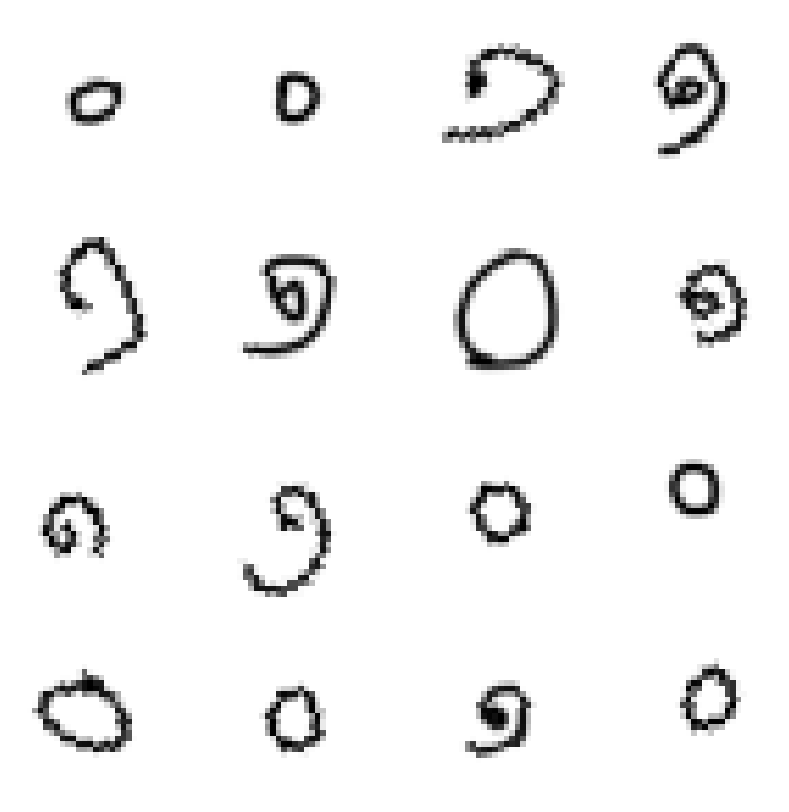

In [3]:
### START CODE HERE ###
def show_img(data_loader):
      
      images, labels = next(iter(data_loader))

      fig = plt.figure(figsize=(10, 10))
      plt.style.use('dark_background')

      grid = ImageGrid(fig, 111,
                        nrows_ncols=(4, 4),  
                        axes_pad=0.5,  
                        )

      for ax, im, lb in zip(grid, images, labels):
            im_np = im.permute(1, 2, 0).numpy()
            ax.axis('off')
            ax.set_title(str(lb.item()))
            ax.imshow(im_np, cmap='gray')

      plt.show()

def load_data(path,class_names):
    ### START CODE HERE ###
    transform = transforms.Compose([
        transforms.Grayscale(num_output_channels=1),
        transforms.Pad(20, padding_mode='edge'),
        transforms.Resize(32),
        transforms.RandomRotation(25, fill=255),
        transforms.CenterCrop(28),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5], std=[0.5])
    ])

    dataset = ImageFolder(root=path, transform=transform)

    class_to_idx = dataset.class_to_idx  
    selected_class_idxs = [class_to_idx[name] for name in class_names]

    indices = [i for i, (_, label) in enumerate(dataset) if label in selected_class_idxs]

    filtered_dataset = Subset(dataset, indices)     # สร้าง Subset ของ dataset เฉพาะ 2 คลาสนี้
    labels = [dataset.targets[i] for i in indices]  # ดึง label ของ subset สำหรับการแบ่ง train/test

    train_idx, test_idx = train_test_split(list(range(len(filtered_dataset))), test_size=0.2, stratify=labels, random_state=42) # แบ่ง train/test โดยใช้ sklearn

    train_dataset = Subset(filtered_dataset, train_idx)
    test_dataset = Subset(filtered_dataset, test_idx)

    train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=16, shuffle=True)

    show_subset_detail(train_dataset,"Train")
    show_subset_detail(test_dataset,"Test")
    show_img(train_loader)
    ### END CODE HERE ###
    
    return train_loader, test_loader

import zipfile
def unzip_data(zip_path, extract_to):
    if not os.path.exists(extract_to):
        with zipfile.ZipFile(zip_path, 'r') as zip_ref:
            zip_ref.extractall(extract_to)
            print(f"✅ Unzipped to: {extract_to}")
    else:
        print(f"📂 Already extracted at: {extract_to}")

unzip_data("thai-handwriting-number.appspot.com.zip", "thai-handwriting-number")

class_names = class_names = [f'{x}' for x in range(2)]
train_loader, test_loader = load_data("./thai-handwriting-number/thai-handwriting-number.appspot.com", class_names)
### END CODE HERE ###

**Create Models**
1. **NN (Neural Network)**:
- **Input**: 28x28 grayscale images (1 channel)
- **Architecture**: Single fully connected layer with sigmoid activation
- **Output**: Single neuron output with sigmoid activation
- **Description**: This is a simple feedforward neural network with a single fully connected layer. It takes input images, flattens them, passes through a fully connected layer, and applies sigmoid activation to produce the output.

2. **MLP (Multi-Layer Perceptron)**:
- **Input**: 28x28 grayscale images (1 channel)
- **Architecture**: Two fully connected layers with sigmoid activations
- **Output**: Single neuron output with sigmoid activation
- **Description**: This is a multi-layer perceptron with two fully connected layers. After flattening the input images, it passes through the first fully connected layer with sigmoid activation, followed by the second fully connected layer with sigmoid activation, producing the output.

3. **CNN (Convolutional Neural Network)**:
- **Input**: 28x28 grayscale images (1 channel)
- **Architecture**: Two convolutional layers with ReLU activations, followed by two fully connected layers with ReLU activations
- **Output**: Single neuron output with sigmoid activation
- **Description**: This is a convolutional neural network with two convolutional layers followed by two fully connected layers. It applies convolutional operations with ReLU activations, followed by flattening the output and passing through fully connected layers with ReLU activations. Finally, it produces a single neuron output with sigmoid activation.


Every model should have a `get_features()` method that returns the result from all layers.

In [4]:
### START CODE HERE ###

class NN(nn.Module):
    def __init__(self):
        super(NN, self).__init__()

        self.flatten = nn.Flatten()
        self.fc = nn.Linear(28*28,1)
        self.sigmoid = nn.Sigmoid()

    def get_features(self, x):

        features = {}

        print(x.shape)
        features['ori'] = x.detach().cpu()

        x = self.flatten(x)
        print(x.shape)
        features['flatten'] = x.detach().cpu()
        
        x = self.fc(x)
        print(x.shape)
        features['fc'] = x.detach().cpu()
        print(f"FC values: min={x.detach().cpu().min():.3f}, max={x.detach().cpu().max():.3f}")

        x = self.sigmoid(x)
        print(x.shape)
        features['sigmoid'] = x.detach().cpu()
        print(f"sigmoid values: min={x.detach().cpu().min():.3f}, max={x.detach().cpu().max():.3f}")

        return features

    def forward(self, x):
        x = self.flatten(x)
        x = self.fc(x)
        x = self.sigmoid(x)
        return x
    
class MLP(nn.Module):
    def __init__(self):
        super(MLP, self).__init__()
        
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(28 * 28, 48)      # ชั้นที่ 1
        self.sigmoid1 = nn.Sigmoid()
        self.fc2 = nn.Linear(48, 1)            # ชั้นที่ 2 (output)
        self.sigmoid2 = nn.Sigmoid()
        
    def get_features(self, x):
        features = {}
        
        features['input'] = x.detach().cpu()
        
        x = self.flatten(x)
        features['flatten'] = x.detach().cpu()
        
        x = self.fc1(x)
        features['fc1'] = x.detach().cpu()
        
        x = self.sigmoid1(x)
        features['sigmoid1'] = x.detach().cpu()
        
        x = self.fc2(x)
        features['fc2'] = x.detach().cpu()
        
        x = self.sigmoid2(x)
        features['sigmoid2'] = x.detach().cpu()
        
        return features

    def forward(self, x):
        x = self.flatten(x)
        x = self.fc1(x)
        x = self.sigmoid1(x)
        x = self.fc2(x)
        x = self.sigmoid2(x)
        return x
    
class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()
        
        # Convolutional layers
        self.conv1 = nn.Conv2d(1, 16, kernel_size=3, padding=1)  # (1 input channel → 16 filters)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, padding=1) # (16 → 32 filters)

        self.pool = nn.MaxPool2d(2, 2)  # reduce spatial size

        # Fully connected layers
        self.fc1 = nn.Linear(32 * 7 * 7, 128)  # Flattened after pooling
        self.fc2 = nn.Linear(128, 1)

        self.sigmoid = nn.Sigmoid()

    def get_features(self, x):
        features = {}

        features['input'] = x.detach().cpu()

        x = self.conv1(x)
        features['conv1'] = x.detach().cpu()
        x = F.relu(x)

        x = self.pool(x)
        features['pool1'] = x.detach().cpu()

        x = self.conv2(x)
        features['conv2'] = x.detach().cpu()
        x = F.relu(x)

        x = self.pool(x)
        features['pool2'] = x.detach().cpu()

        x = x.view(x.size(0), -1)  # Flatten
        features['flatten'] = x.detach().cpu()

        x = self.fc1(x)
        features['fc1'] = x.detach().cpu()
        x = F.relu(x)

        x = self.fc2(x)
        features['fc2'] = x.detach().cpu()

        x = self.sigmoid(x)
        features['output'] = x.detach().cpu()

        return features

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.pool(x)
        x = F.relu(self.conv2(x))
        x = self.pool(x)
        x = x.view(x.size(0), -1)  # Flatten
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        x = self.sigmoid(x)
        return x

### END CODE HERE ###

Complete the function below. This function will be used to display the feature map from the models at every epoch on TensorBoard.

<details>
<summary>
<font size="3" color="orange">
<b>Expected output that will be display on TensorBoard</b>
</font>
</summary>

- The output should resemble this, but not be identical
- `NN()`<br>
![image.png](https://github.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/blob/main/Lab4_NN-and-CNN/assets/04.png?raw=true)
- `MLP()`<br>
![image-2.png](https://github.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/blob/main/Lab4_NN-and-CNN/assets/05.png?raw=true)
- `CNN()`<br>
![image-3.png](https://github.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/blob/main/Lab4_NN-and-CNN/assets/06.png?raw=true)
</details>

In [5]:
from matplotlib import colors

def show_featuremaps(features):
    ### START CODE HERE ###
    fig, axs = plt.subplots(1, len(features), figsize=(len(features)*3, 4))
    plt.style.use('dark_background')

    for ax, (name, feat) in zip(axs, features.items()):
        f = feat[0].cpu().numpy()  # ใช้ sample แรก
        print(f.ndim, f.shape[0])

        if f.ndim == 3:
            # รูปภาพต้นฉบับ (C, H, W)
            if f.shape[0] == 1:
                f = f[0]  # ถ้าเป็น grayscale
                ax.imshow(f)
            else:
                channels = []
                for i in range(f.shape[0]):  # วนลูป 16 channels
                    channels.append(f[i])  # เอาแต่ละ channel (28, 28)
                # ต่อกันแนวตั้ง (stack vertically)
                f_stacked = np.vstack(channels)  # (16*28, 28) = (448, 28)
                ax.imshow(f_stacked)

        elif f.ndim == 1:
            if f.shape[0] > 1:
                ax.imshow(f.reshape(-1, 1), aspect='auto')
            else:
                f_display = np.array([[f.item()]])
                ax.imshow(f_display, aspect='auto', vmin=0, vmax=1)

        ax.set_title(name)
        ax.axis('off')
    return fig

# def load_image(filepath):
#     transform = transforms.Compose([
#         transforms.Grayscale(num_output_channels=1),  # เปลี่ยนเป็น grayscale
#         transforms.Resize((28, 28)),                  # ปรับขนาด
#         transforms.ToTensor(),                        # แปลงเป็น tensor (C, H, W)
#     ])
#     image = Image.open(filepath)
#     tensor = transform(image)  # shape: (1, 28, 28)
    return tensor.unsqueeze(0) # เพิ่ม batch dim → shape: (1, 1, 28, 28)

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-1.141, max=-0.188
torch.Size([16, 1])
sigmoid values: min=0.242, max=0.453
3 1
1 784
1 1
1 1


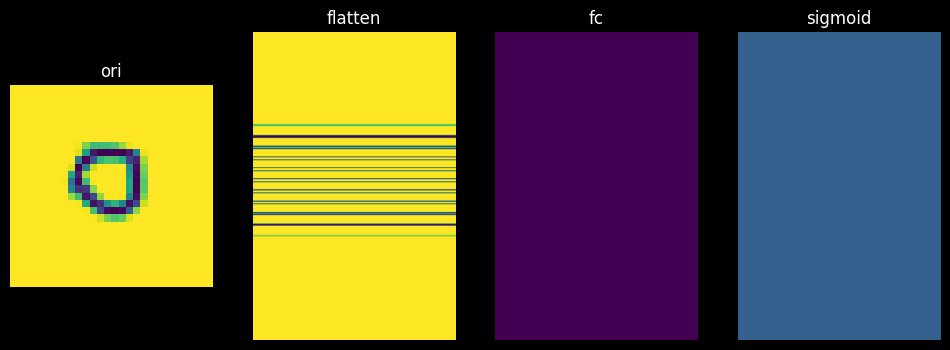

In [6]:
nn_model = NN()
data_iter = iter(train_loader)
input_tensor, _ = next(data_iter)
output= nn_model(input_tensor)
features = nn_model.get_features(input_tensor) 
fig = show_featuremaps(features)
plt.show() 

3 1
1 784
1 48
1 48
1 1
1 1


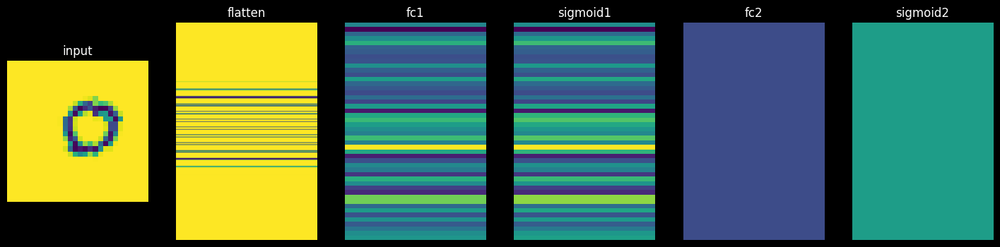

In [7]:
mlp_model = MLP()
data_iter = iter(train_loader)
input_tensor, _ = next(data_iter)
output= mlp_model(input_tensor)
features = mlp_model.get_features(input_tensor) 
fig = show_featuremaps(features)
plt.show() 

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


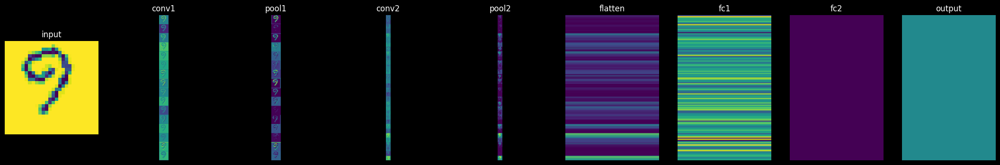

In [8]:
cnn_model = CNN()
data_iter = iter(train_loader)
input_tensor, _ = next(data_iter)
output= cnn_model(input_tensor)
features = cnn_model.get_features(input_tensor) 
fig = show_featuremaps(features)
plt.show() 

TensorBoard 101

Complete the `train()` function in the cell below. This function should evaluate the model at every epoch, log the training loss/accuracy, test loss/accuracy, and display the feature map from all layers of the model at every epoch on TensorBoard. Additionally, it should save the model at the last epoch.

Resource : [PyTorch Training loop](<https://pytorch.org/tutorials/beginner/introyt/trainingyt.html#:~:text=%3D0.9)-,The%20Training%20Loop,-Below%2C%20we%20have>), [TensorBoard](https://pytorch.org/docs/stable/tensorboard.html)

<details>
<summary>
<font size="3" color="orange">
<b>Expected output that will be display on TensorBoard</b>
</font>
</summary>

- The output should resemble this, but not be identical

![image.png](https://github.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/blob/main/Lab4_NN-and-CNN/assets/07.png?raw=true)

![image-2.png](https://github.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/blob/main/Lab4_NN-and-CNN/assets/08.png?raw=true)
</details>

In [9]:
from torchvision.utils import make_grid
from PIL import Image
import io
import numpy as np
import torchvision.transforms as transforms

def fig_to_tensor(fig):
    buf = io.BytesIO()
    fig.savefig(buf, format='png')
    buf.seek(0)
    image = Image.open(buf).convert('RGB')
    transform = transforms.ToTensor()
    return transform(image)

def train(class_names,model,opt,loss_fn,train_loader,test_loader,epochs=10,writer=None,checkpoint_path=None,device='cpu'):
    ### START CODE HERE ###
    
    model = model.to(device)
    class_map = {int(class_names[0]): 0, int(class_names[1]): 1}
    history = {
        'train_loss':[],
        'train_acc':[],
        'test_loss':[],
        'test_acc':[]
    }

    for epoch in range(epochs):
        model.train()
        train_bar = tqdm(train_loader, desc=f'Training Epoch [{epoch+1}/{epochs}]', unit='batch')

        total_train_loss = 0
        total_train_correct = 0

        for batch_idx, (images, labels) in enumerate(train_bar):
            images = images.to(device)
            labels = labels.cpu().numpy()
            labels = torch.tensor([class_map[int(l)] for l in labels], dtype=torch.float32, device=device).unsqueeze(1)

            opt.zero_grad()
            output = model(images)
            loss = loss_fn(output, labels)
            loss.backward()
            opt.step()
            
            total_train_loss += loss.item()
            predicted = (output > 0.6).long()  # output เป็น sigmoid -> 0~1
            total_train_correct += (predicted == labels).sum().item()

            train_bar.set_postfix(loss=loss.item())
            
        # print("output: ",output.squeeze().tolist())
        # print("Predicted: ", predicted.squeeze().tolist())
        # print("Label:     ", labels.squeeze().long().tolist())
        
        avg_train_loss = total_train_loss/len(train_loader)
        avg_train_acc = total_train_correct/len(train_loader.dataset)
        
        history['train_loss'].append(avg_train_loss)
        history['train_acc'].append(avg_train_acc)


        #testing-----------------------------------------------------------------------------------
        model.eval()
        test_bar = tqdm(test_loader, desc='Testing 🧐🧐', unit='batch')

        total_test_loss = 0
        total_test_correct = 0

        with torch.no_grad():
            for images, labels in test_bar:
                images = images.to(device)
                labels = labels.cpu().numpy()
                labels = torch.tensor([class_map[int(l)] for l in labels], dtype=torch.float32, device=device).unsqueeze(1)

                
                # labels = labels.to(device)
                # labels = labels.float().unsqueeze(1)

                output = model(images)
                loss = loss_fn(output, labels)

                total_test_loss += loss.item()
                predicted = (output > 0.6).long()
                total_test_correct += (predicted == labels).sum().item()

                test_bar.set_postfix(loss=loss.item())
        
        avg_test_loss = total_test_loss / len(test_loader)
        avg_test_acc = total_test_correct / len(test_loader.dataset)

        history['test_loss'].append(avg_test_loss)
        history['test_acc'].append(avg_test_acc)

        if epoch == epochs-1:
            print(f"Epoch {epoch+1}, Loss: {avg_train_loss:.4f}, Accuracy: {avg_train_acc:.4f}, Test Loss: {avg_test_loss:.4f}, Test Accuracy: {avg_test_acc:.4f}\n")

        if writer:
            writer.add_scalar("Loss/train", avg_train_loss, epoch)
            writer.add_scalar("Accuracy/train", avg_train_acc, epoch)
            writer.add_scalar("Loss/test", avg_test_loss, epoch)
            writer.add_scalar("Accuracy/test", avg_test_acc, epoch)

            # Log feature map images
            sample_iter = iter(train_loader)
            input_tensor, _ = next(sample_iter)
            input_tensor = input_tensor.to(device)
            _ = model(input_tensor)  # forward pass
            features = model.get_features(input_tensor)
            fig = show_featuremaps(features)
            image_tensor = fig_to_tensor(fig)
            writer.add_image('Feature Maps', image_tensor, epoch)

            writer.flush() 

        if checkpoint_path and epoch == epochs-1:
            os.makedirs(os.path.dirname(checkpoint_path), exist_ok=True)
            model_path = checkpoint_path
            torch.save(model.state_dict(), model_path)

        # data_iter = iter(train_loader)
        # input_tensor, _ = next(data_iter)
        # output= cnn_model(input_tensor)
        # features = cnn_model.get_features(input_tensor) 
        # fig = show_featuremaps(features)
        # #add image to tensorboard
        # writer.add_image('Input Images', fig, epoch)
        
    writer.close()
    return history

    ### END CODE HERE ###

Use your `train()` function to train all types of models with all combinations of numbers that you've obtained.

Train Dataset:
	Number of images in class 0: 270
	Number of images in class 1: 277
	Number of train samples: 547
Test Dataset:
	Number of images in class 0: 67
	Number of images in class 1: 70
	Number of test samples: 137


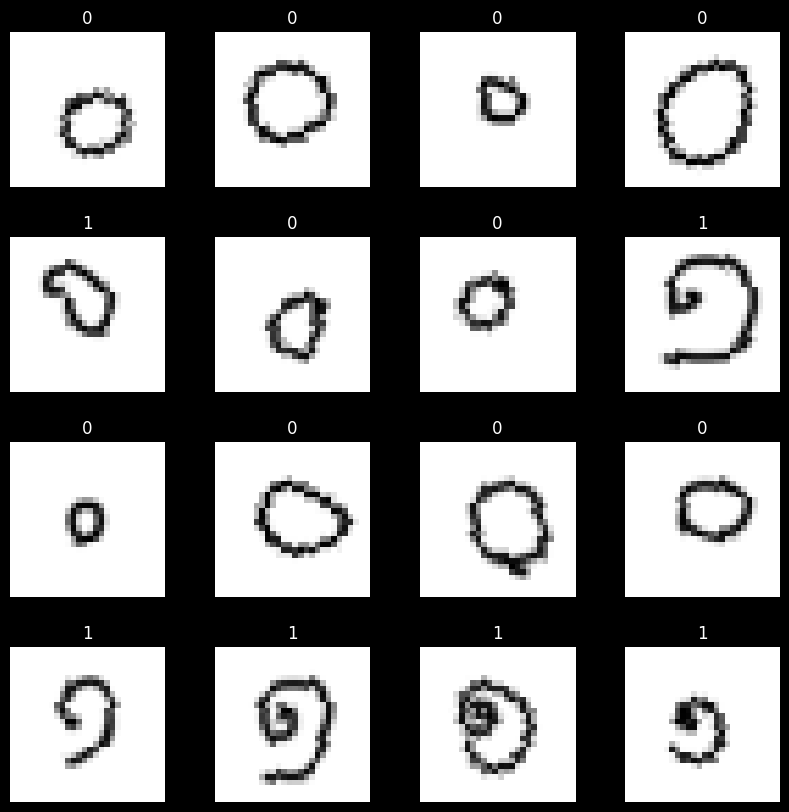

Train Dataset:
	Number of images in class 0: 270
	Number of images in class 1: 273
	Number of train samples: 543
Test Dataset:
	Number of images in class 0: 67
	Number of images in class 1: 69
	Number of test samples: 136


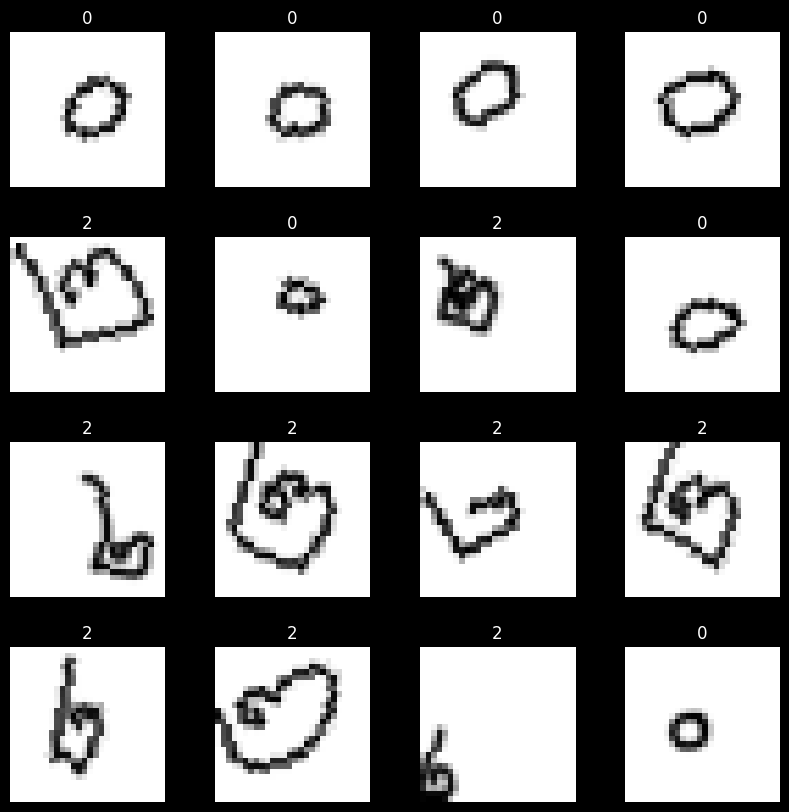

Train Dataset:
	Number of images in class 0: 269
	Number of images in class 1: 272
	Number of train samples: 541
Test Dataset:
	Number of images in class 0: 68
	Number of images in class 1: 68
	Number of test samples: 136


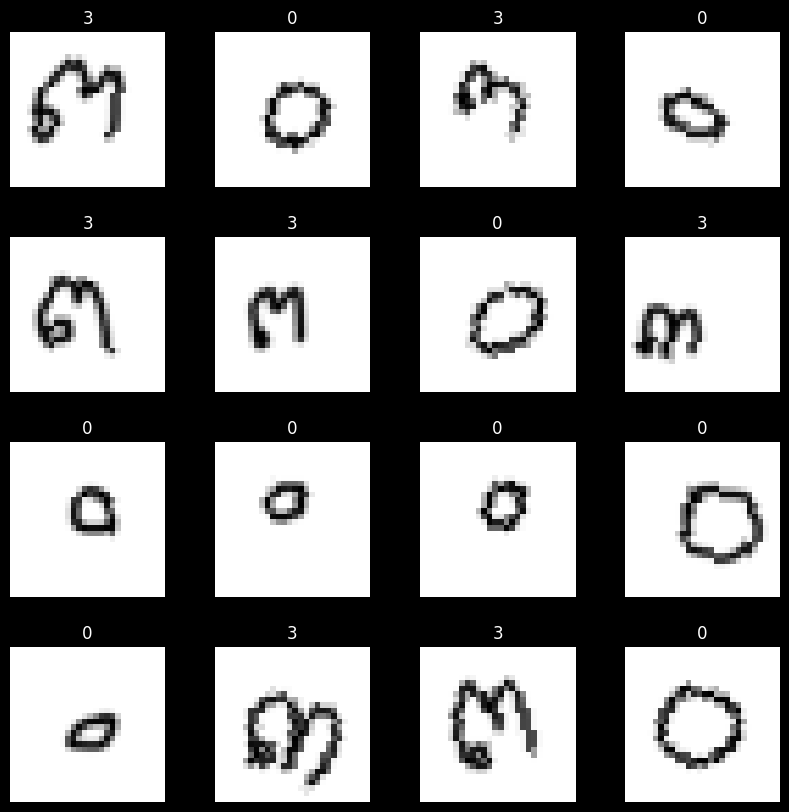

Train Dataset:
	Number of images in class 0: 269
	Number of images in class 1: 270
	Number of train samples: 539
Test Dataset:
	Number of images in class 0: 68
	Number of images in class 1: 67
	Number of test samples: 135


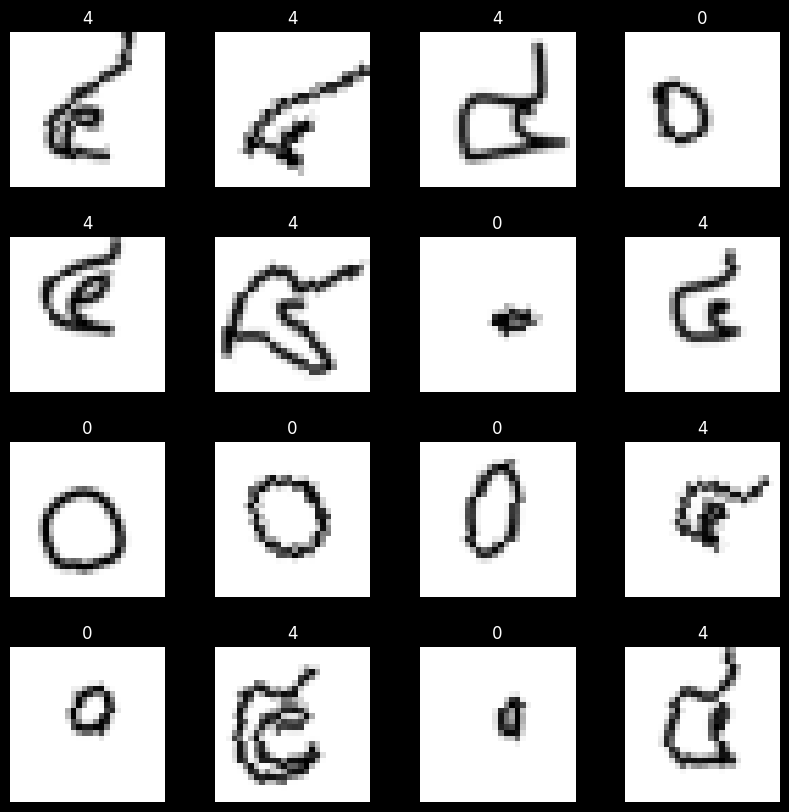

Train Dataset:
	Number of images in class 0: 269
	Number of images in class 1: 267
	Number of train samples: 536
Test Dataset:
	Number of images in class 0: 68
	Number of images in class 1: 67
	Number of test samples: 135


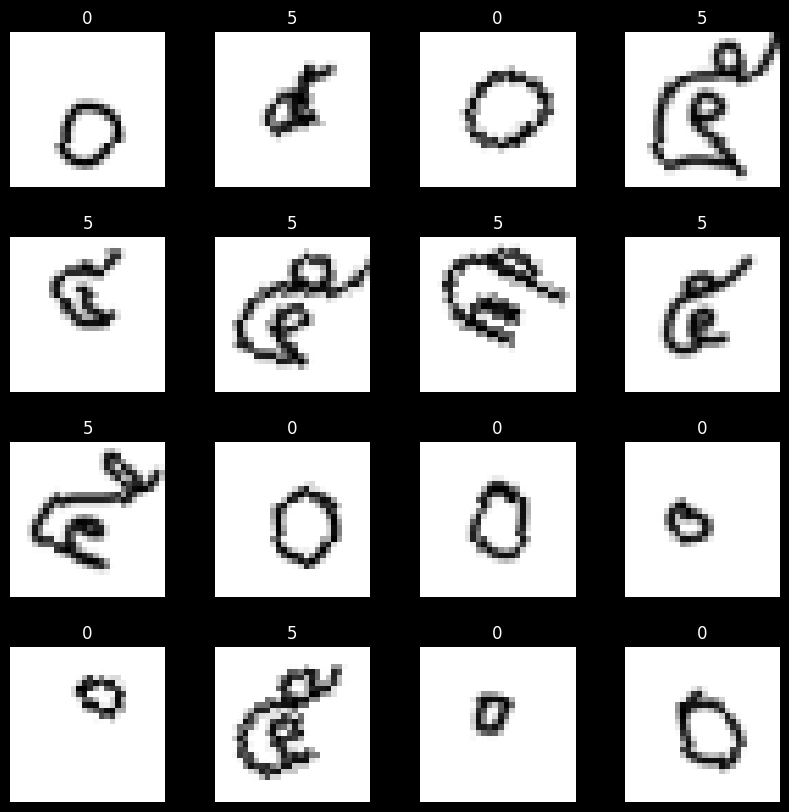

Train Dataset:
	Number of images in class 0: 270
	Number of images in class 1: 258
	Number of train samples: 528
Test Dataset:
	Number of images in class 0: 67
	Number of images in class 1: 65
	Number of test samples: 132


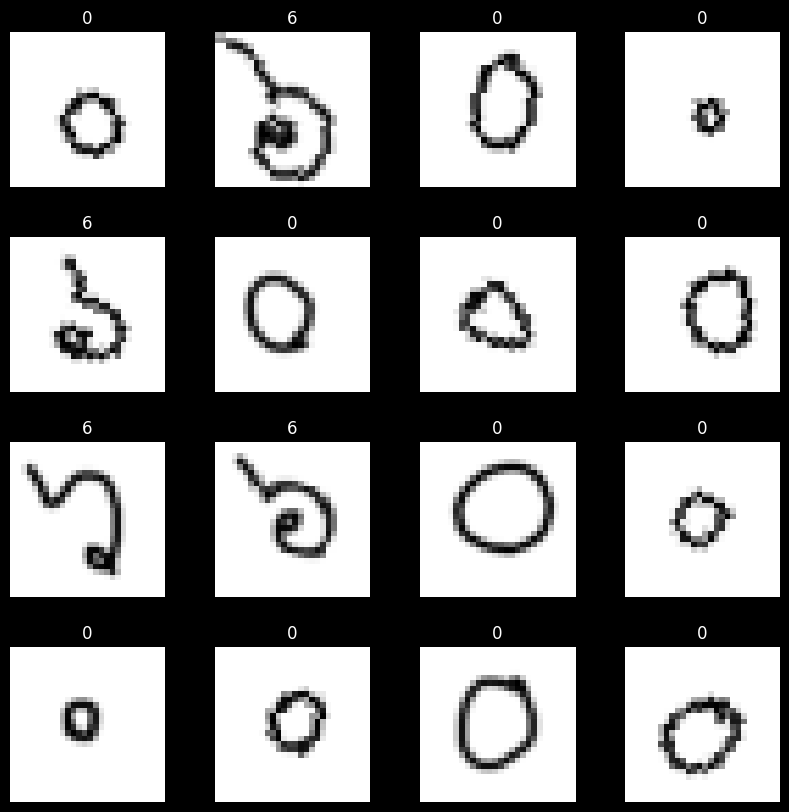

Train Dataset:
	Number of images in class 0: 269
	Number of images in class 1: 265
	Number of train samples: 534
Test Dataset:
	Number of images in class 0: 68
	Number of images in class 1: 66
	Number of test samples: 134


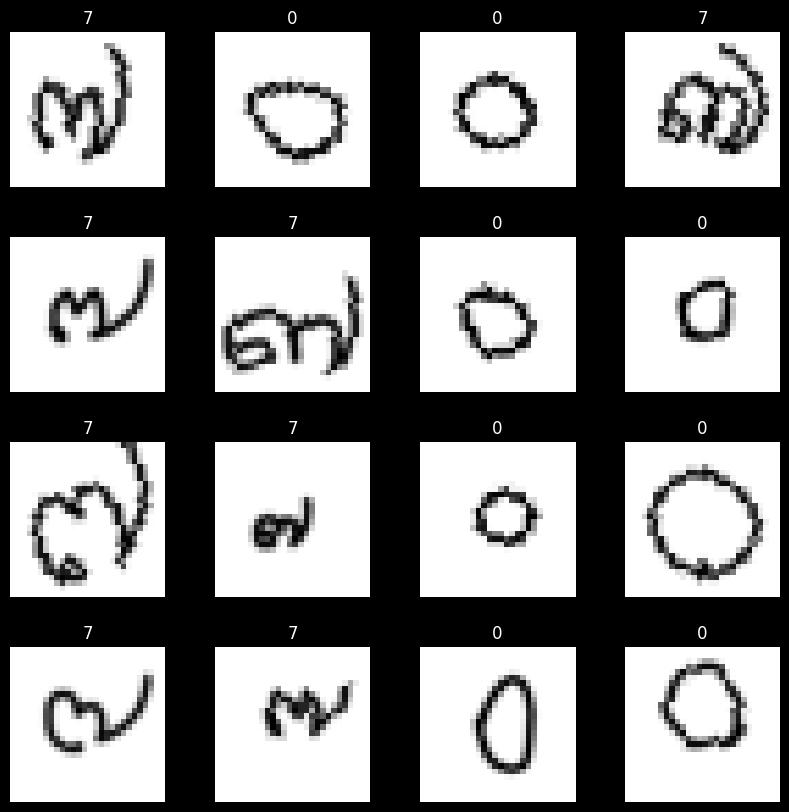

Train Dataset:
	Number of images in class 0: 269
	Number of images in class 1: 265
	Number of train samples: 534
Test Dataset:
	Number of images in class 0: 68
	Number of images in class 1: 66
	Number of test samples: 134


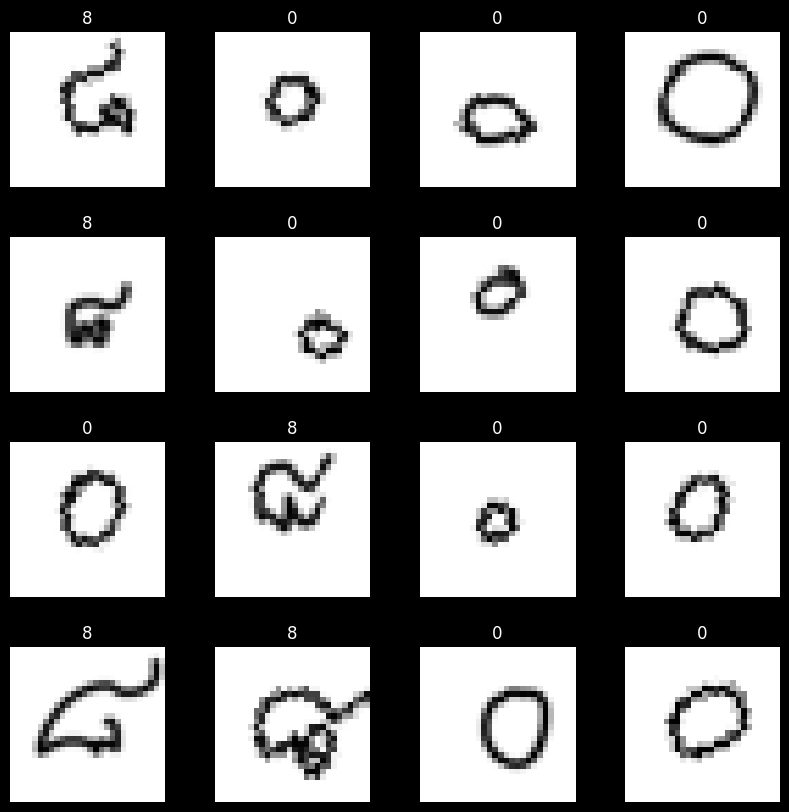

Train Dataset:
	Number of images in class 0: 269
	Number of images in class 1: 260
	Number of train samples: 529
Test Dataset:
	Number of images in class 0: 68
	Number of images in class 1: 65
	Number of test samples: 133


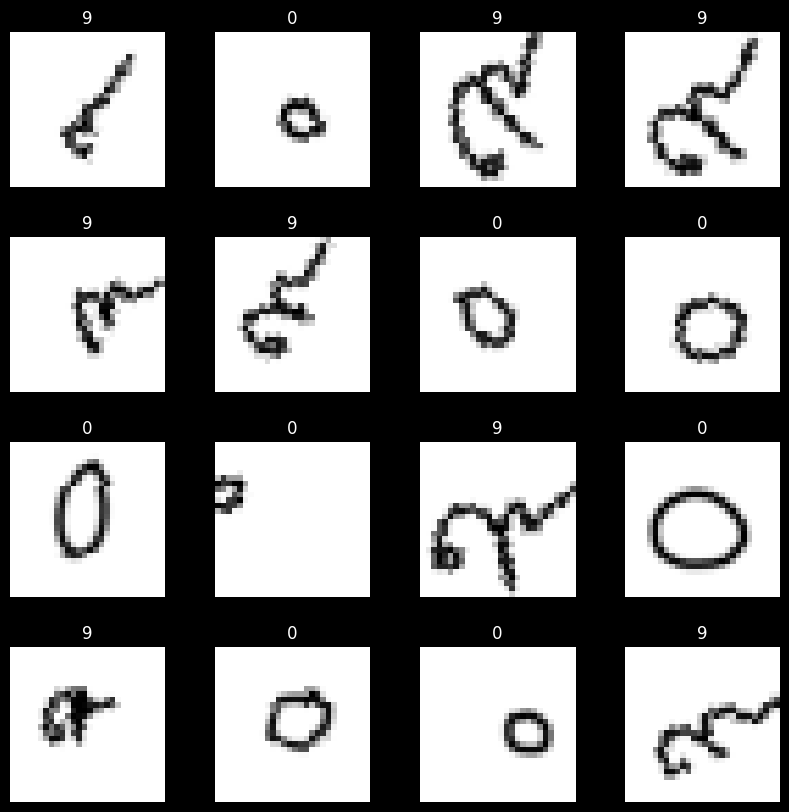

Train Dataset:
	Number of images in class 0: 271
	Number of images in class 1: 275
	Number of images in class 2: 5
	Number of train samples: 551
Test Dataset:
	Number of images in class 0: 66
	Number of images in class 1: 72
	Number of test samples: 138


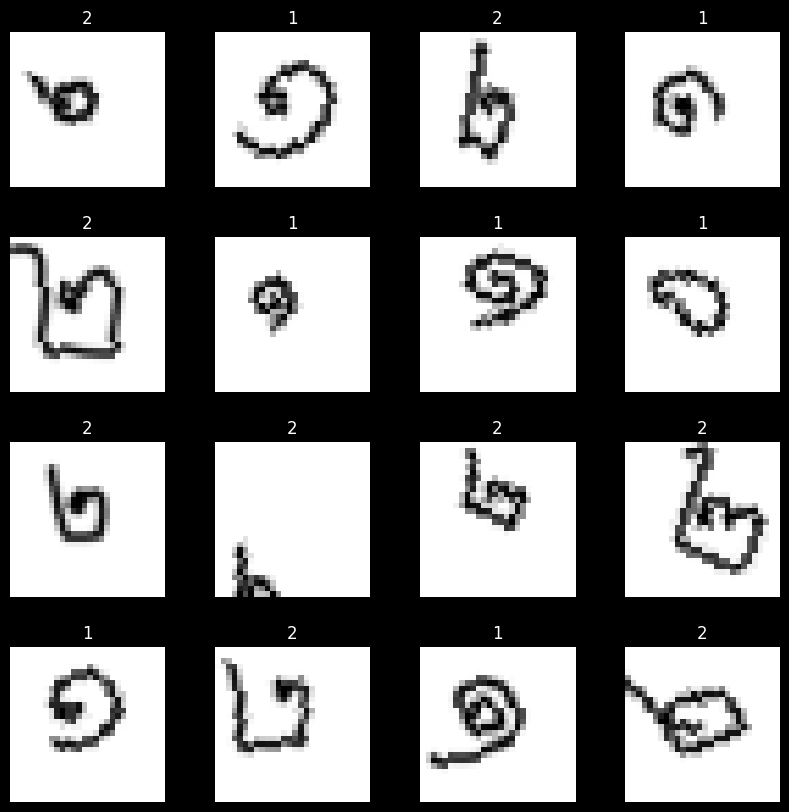

Train Dataset:
	Number of images in class 0: 271
	Number of images in class 1: 275
	Number of images in class 2: 3
	Number of train samples: 549
Test Dataset:
	Number of images in class 0: 66
	Number of images in class 1: 72
	Number of test samples: 138


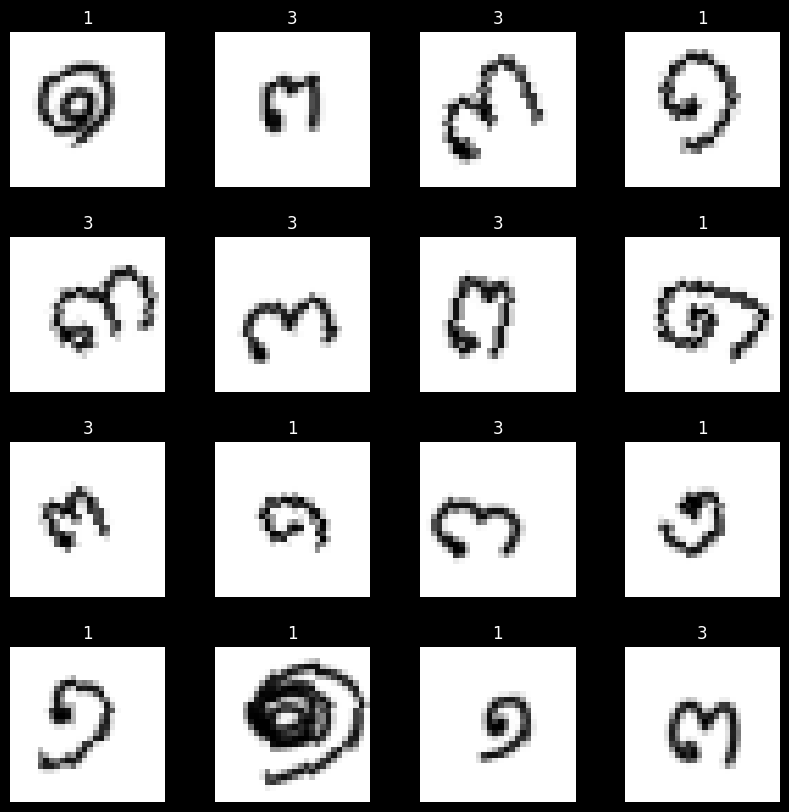

Train Dataset:
	Number of images in class 0: 271
	Number of images in class 1: 276
	Number of train samples: 547
Test Dataset:
	Number of images in class 0: 66
	Number of images in class 1: 71
	Number of test samples: 137


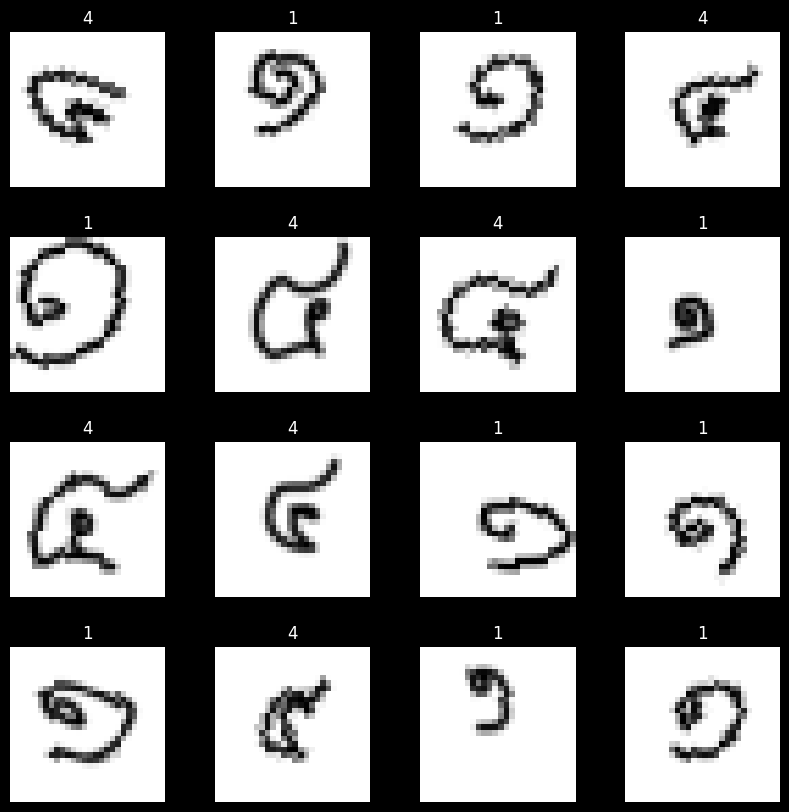

Train Dataset:
	Number of images in class 0: 271
	Number of images in class 1: 273
	Number of train samples: 544
Test Dataset:
	Number of images in class 0: 66
	Number of images in class 1: 71
	Number of test samples: 137


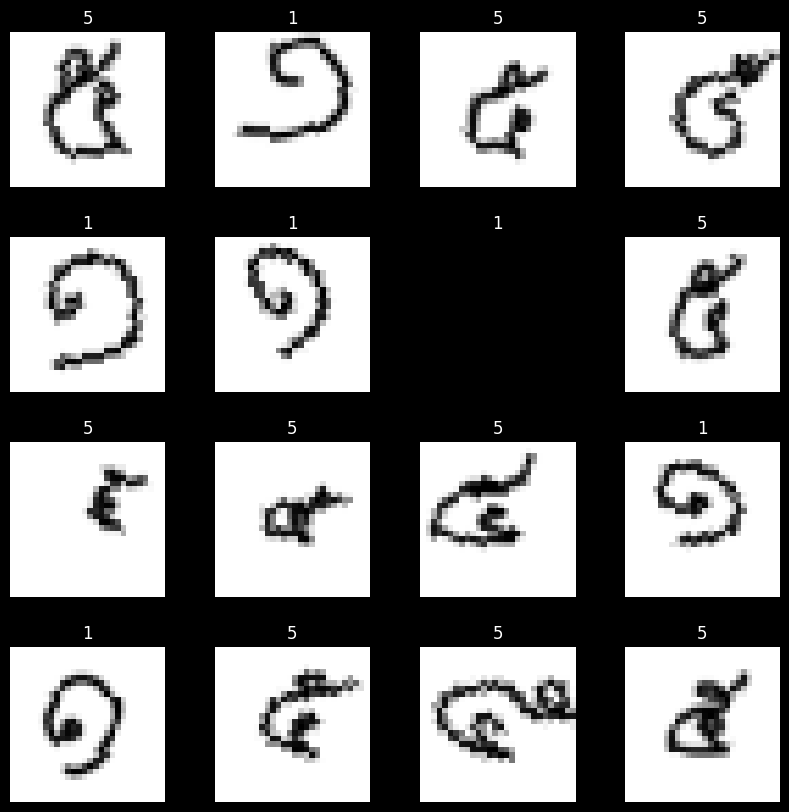

Train Dataset:
	Number of images in class 0: 272
	Number of images in class 1: 264
	Number of train samples: 536
Test Dataset:
	Number of images in class 0: 65
	Number of images in class 1: 69
	Number of test samples: 134


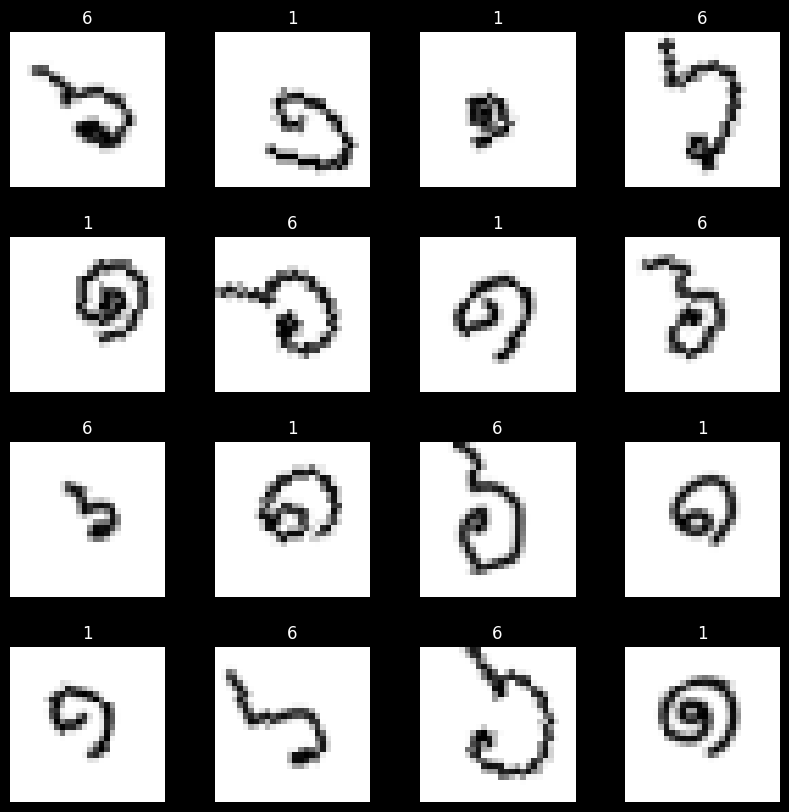

Train Dataset:
	Number of images in class 0: 271
	Number of images in class 1: 271
	Number of train samples: 542
Test Dataset:
	Number of images in class 0: 66
	Number of images in class 1: 70
	Number of test samples: 136


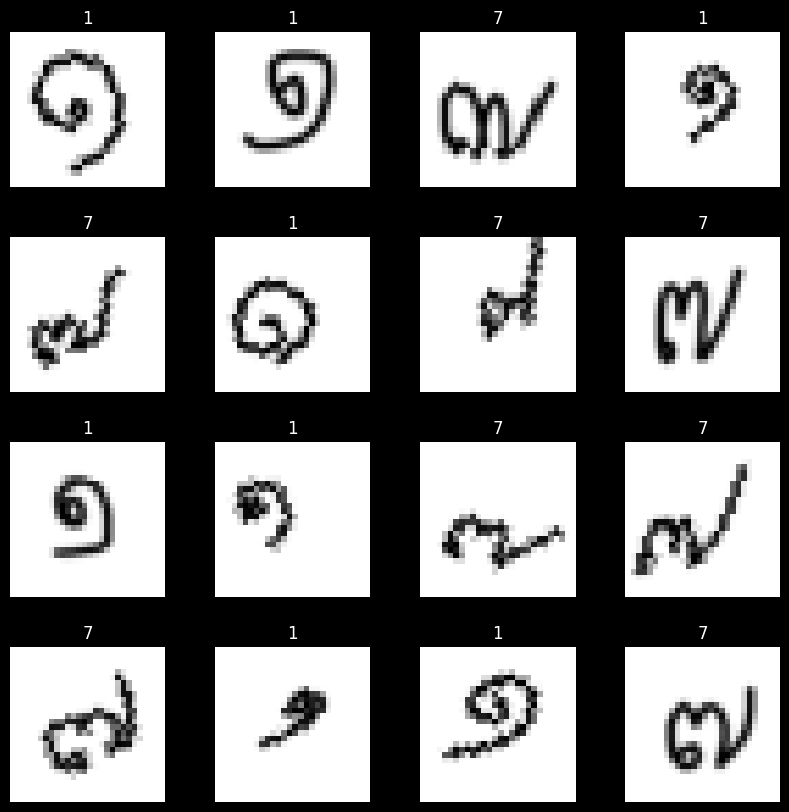

Train Dataset:
	Number of images in class 0: 271
	Number of images in class 1: 271
	Number of train samples: 542
Test Dataset:
	Number of images in class 0: 66
	Number of images in class 1: 70
	Number of test samples: 136


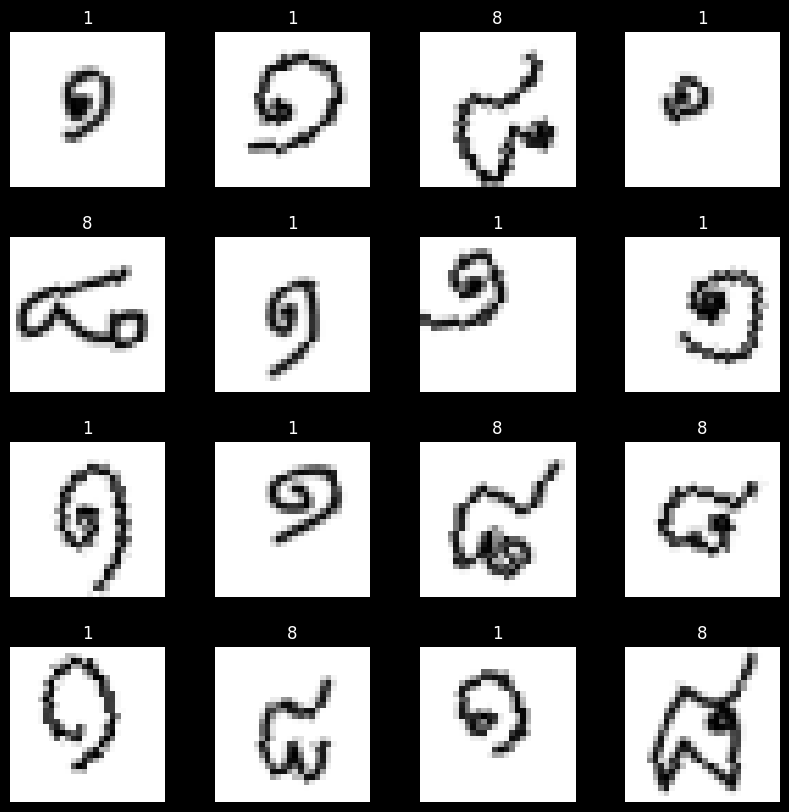

Train Dataset:
	Number of images in class 0: 271
	Number of images in class 1: 266
	Number of train samples: 537
Test Dataset:
	Number of images in class 0: 66
	Number of images in class 1: 69
	Number of test samples: 135


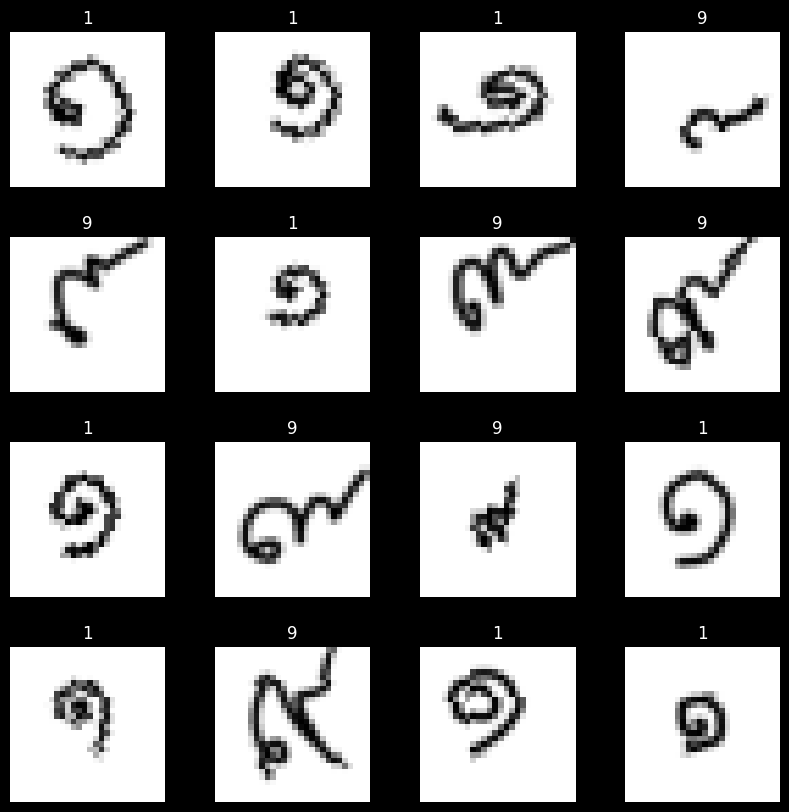

Train Dataset:
	Number of images in class 0: 270
	Number of images in class 1: 275
	Number of train samples: 545
Test Dataset:
	Number of images in class 0: 67
	Number of images in class 1: 70
	Number of test samples: 137


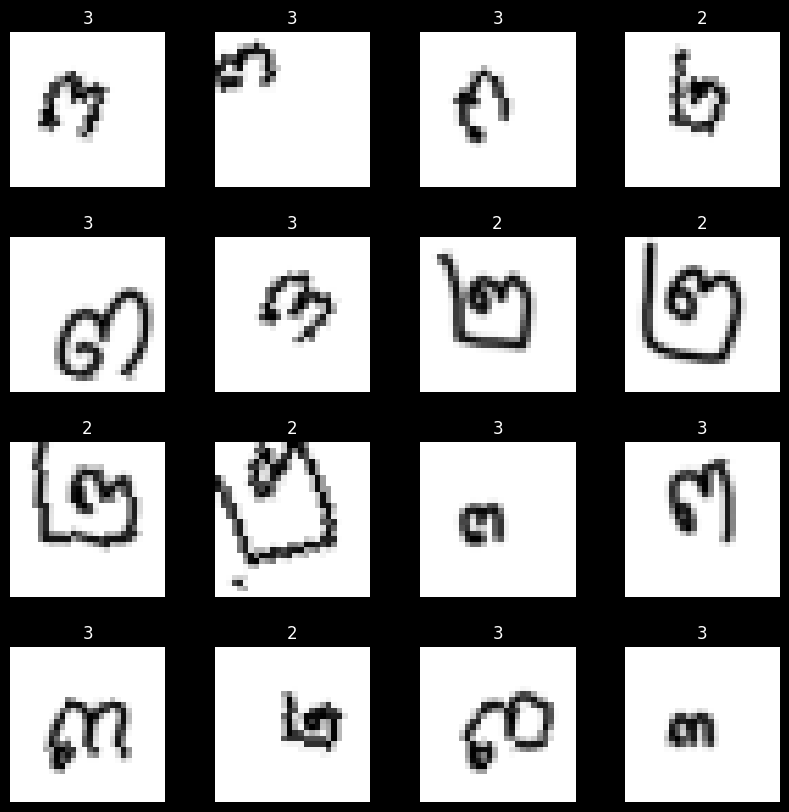

Train Dataset:
	Number of images in class 0: 270
	Number of images in class 1: 273
	Number of train samples: 543
Test Dataset:
	Number of images in class 0: 67
	Number of images in class 1: 69
	Number of test samples: 136


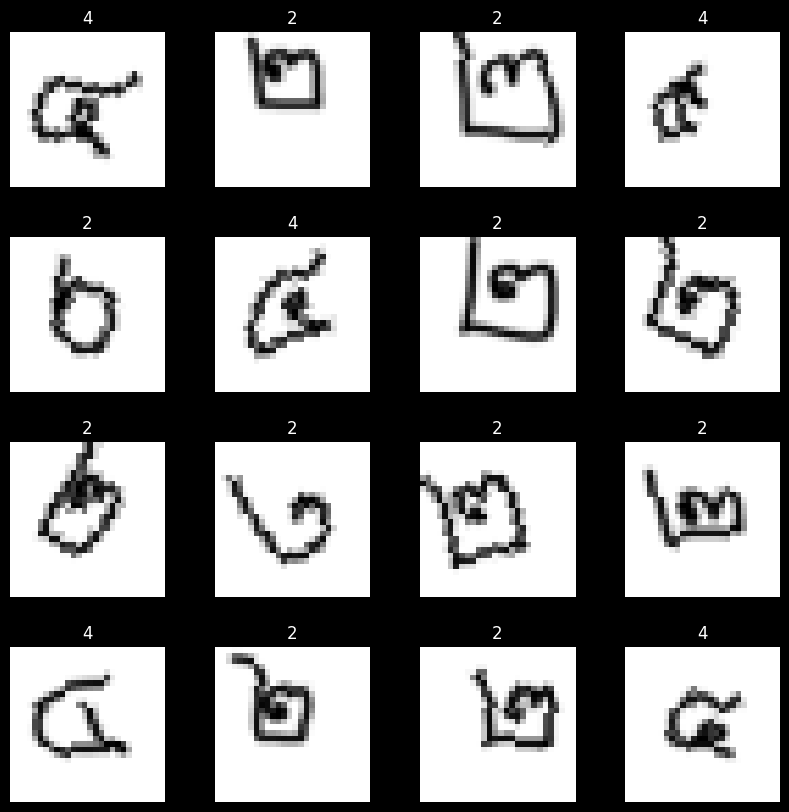

Train Dataset:
	Number of images in class 0: 270
	Number of images in class 1: 270
	Number of train samples: 540
Test Dataset:
	Number of images in class 0: 67
	Number of images in class 1: 69
	Number of test samples: 136


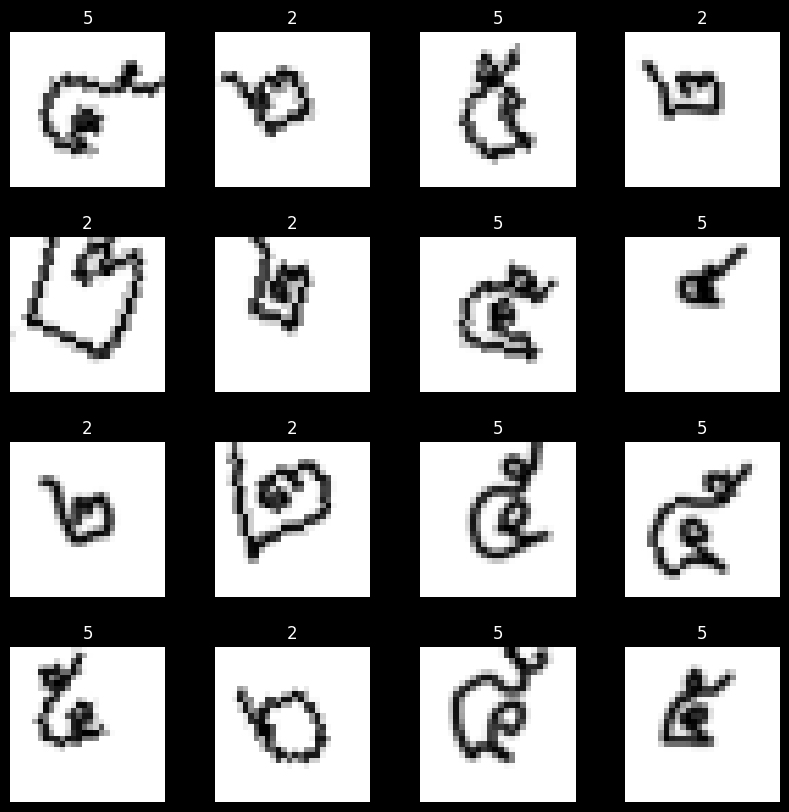

Train Dataset:
	Number of images in class 0: 271
	Number of images in class 1: 261
	Number of train samples: 532
Test Dataset:
	Number of images in class 0: 66
	Number of images in class 1: 67
	Number of test samples: 133


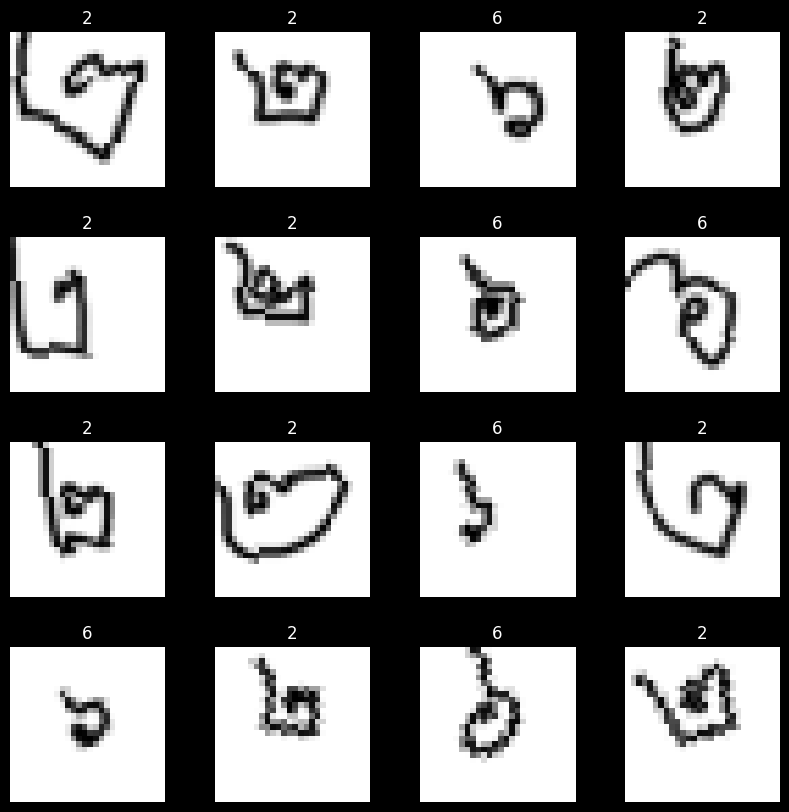

Train Dataset:
	Number of images in class 0: 270
	Number of images in class 1: 268
	Number of train samples: 538
Test Dataset:
	Number of images in class 0: 67
	Number of images in class 1: 68
	Number of test samples: 135


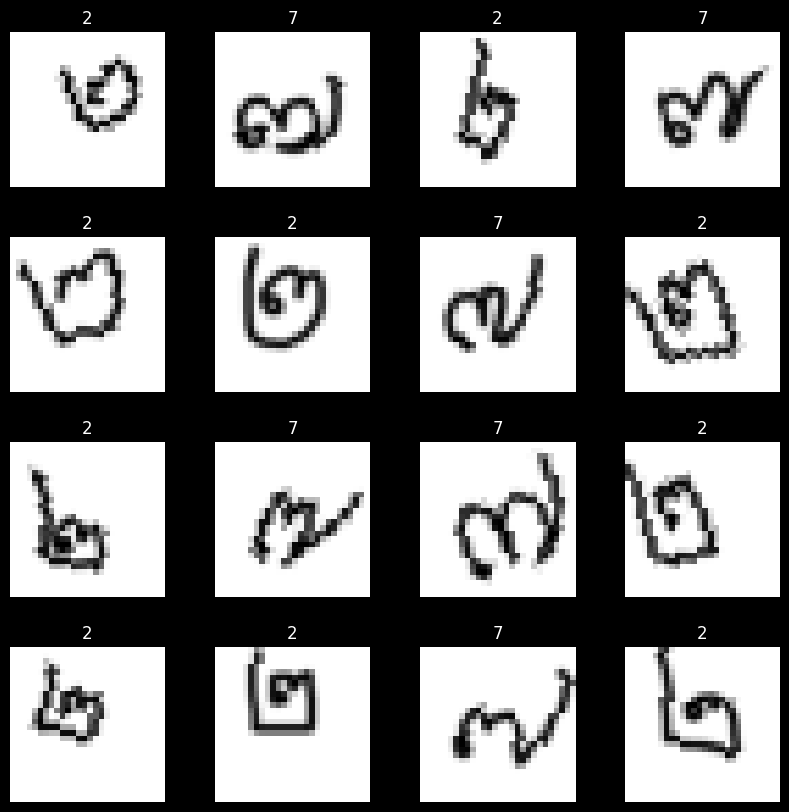

Train Dataset:
	Number of images in class 0: 270
	Number of images in class 1: 268
	Number of train samples: 538
Test Dataset:
	Number of images in class 0: 67
	Number of images in class 1: 68
	Number of test samples: 135


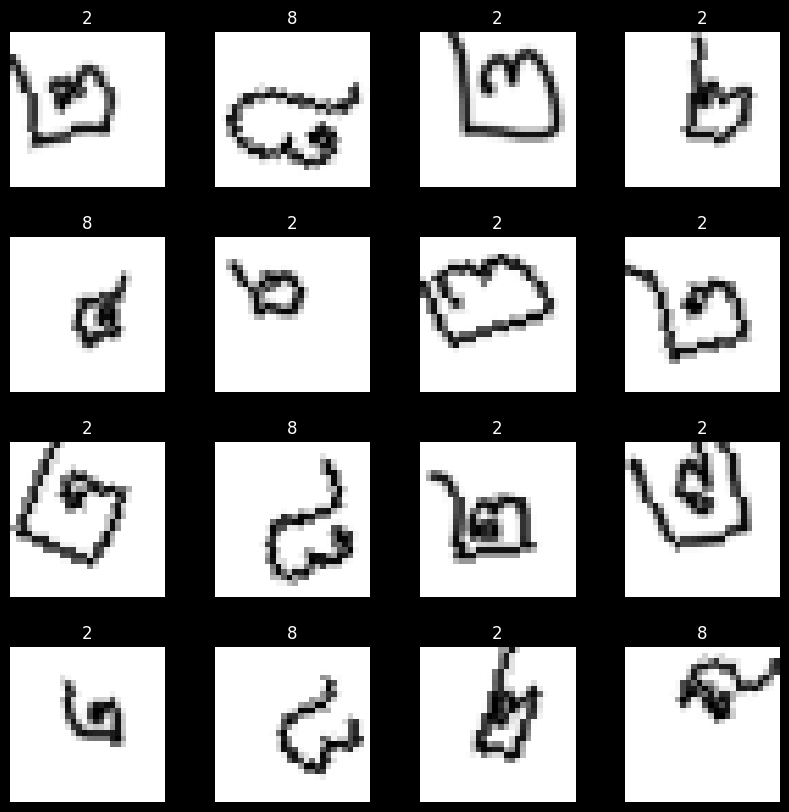

Train Dataset:
	Number of images in class 0: 270
	Number of images in class 1: 263
	Number of train samples: 533
Test Dataset:
	Number of images in class 0: 67
	Number of images in class 1: 67
	Number of test samples: 134


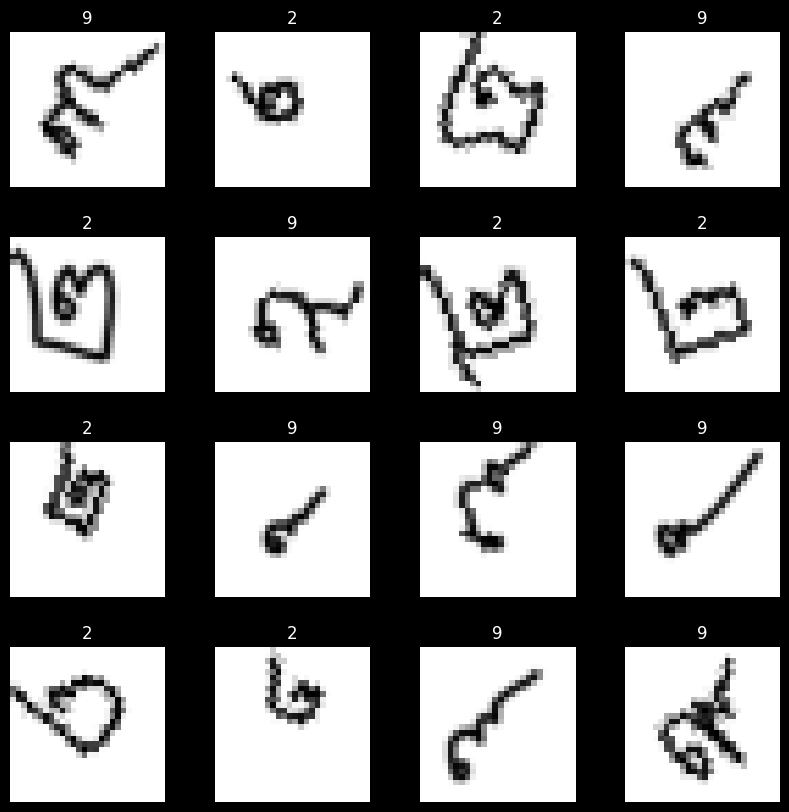

Train Dataset:
	Number of images in class 0: 271
	Number of images in class 1: 270
	Number of train samples: 541
Test Dataset:
	Number of images in class 0: 66
	Number of images in class 1: 70
	Number of test samples: 136


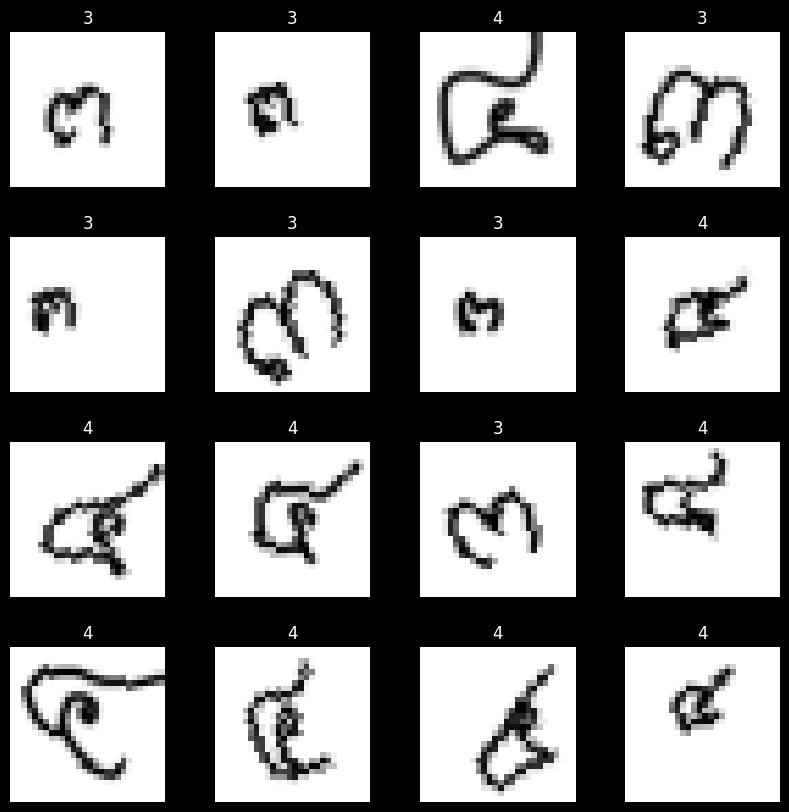

Train Dataset:
	Number of images in class 0: 271
	Number of images in class 1: 268
	Number of train samples: 539
Test Dataset:
	Number of images in class 0: 66
	Number of images in class 1: 69
	Number of test samples: 135


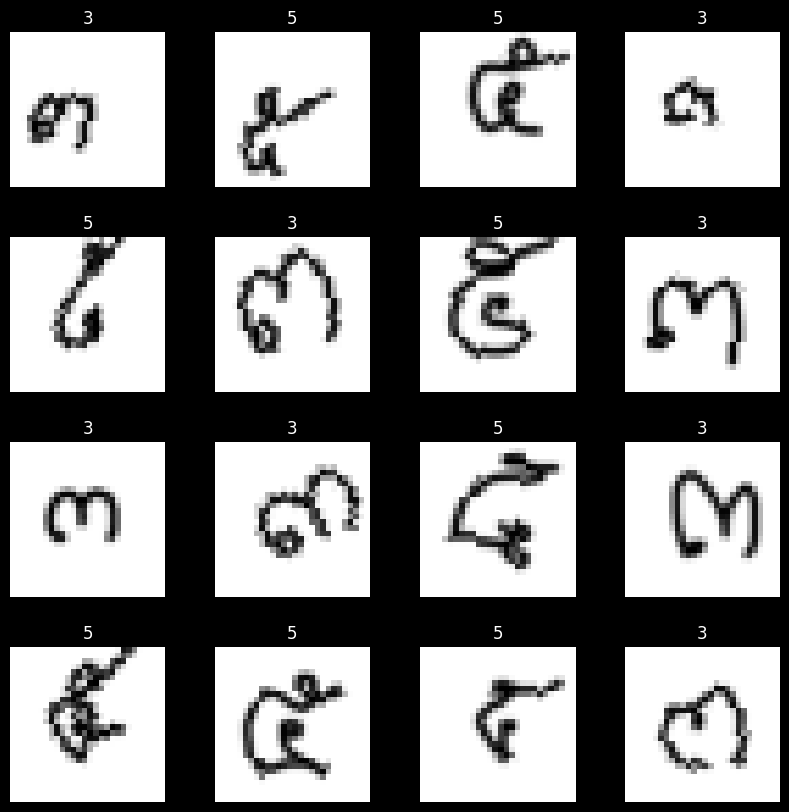

Train Dataset:
	Number of images in class 0: 271
	Number of images in class 1: 259
	Number of train samples: 530
Test Dataset:
	Number of images in class 0: 66
	Number of images in class 1: 67
	Number of test samples: 133


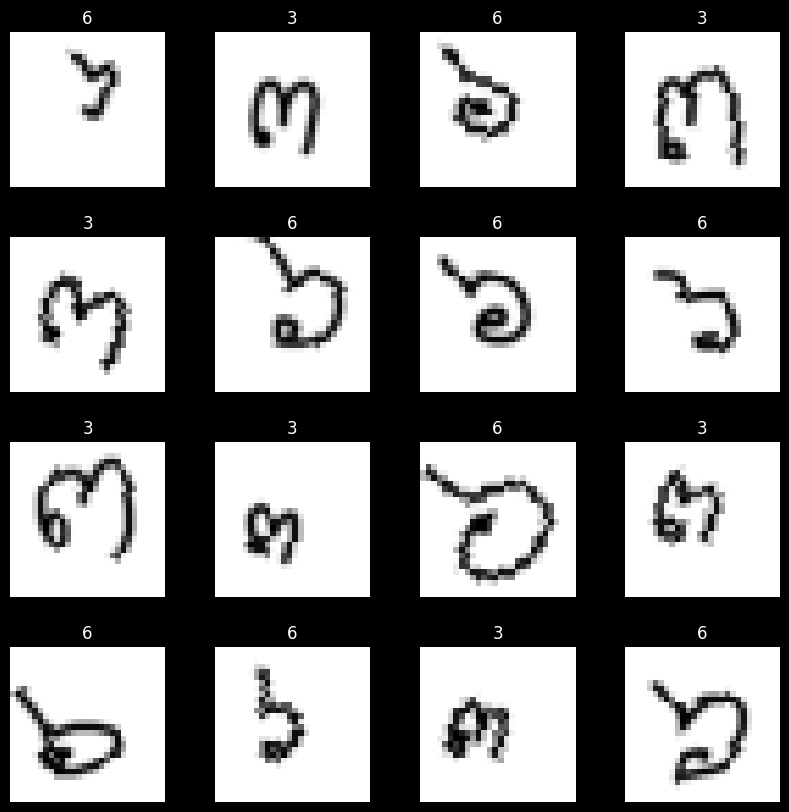

Train Dataset:
	Number of images in class 0: 271
	Number of images in class 1: 265
	Number of train samples: 536
Test Dataset:
	Number of images in class 0: 66
	Number of images in class 1: 69
	Number of test samples: 135


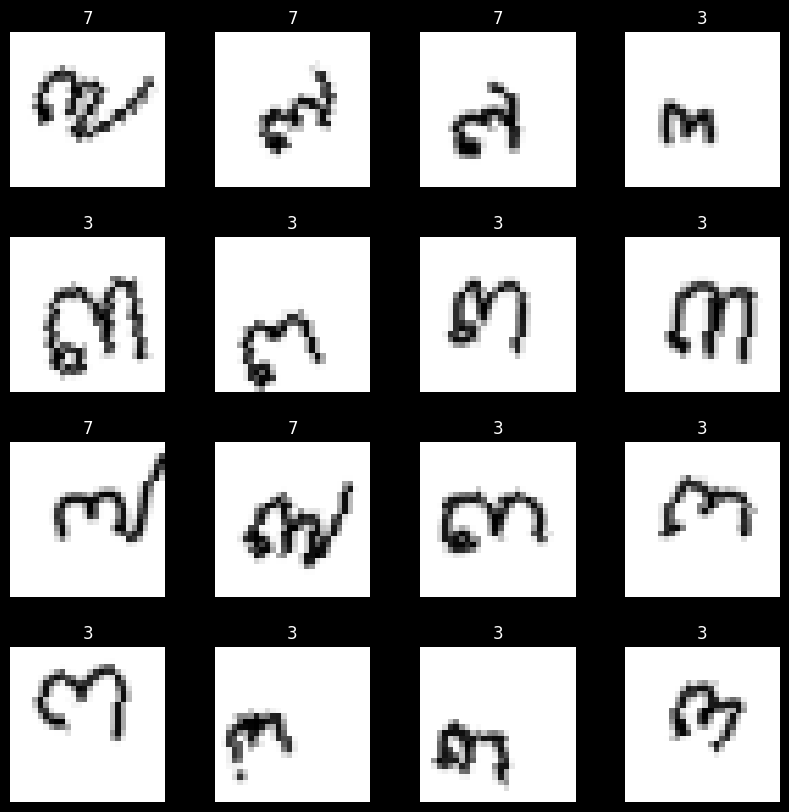

Train Dataset:
	Number of images in class 0: 271
	Number of images in class 1: 265
	Number of train samples: 536
Test Dataset:
	Number of images in class 0: 66
	Number of images in class 1: 69
	Number of test samples: 135


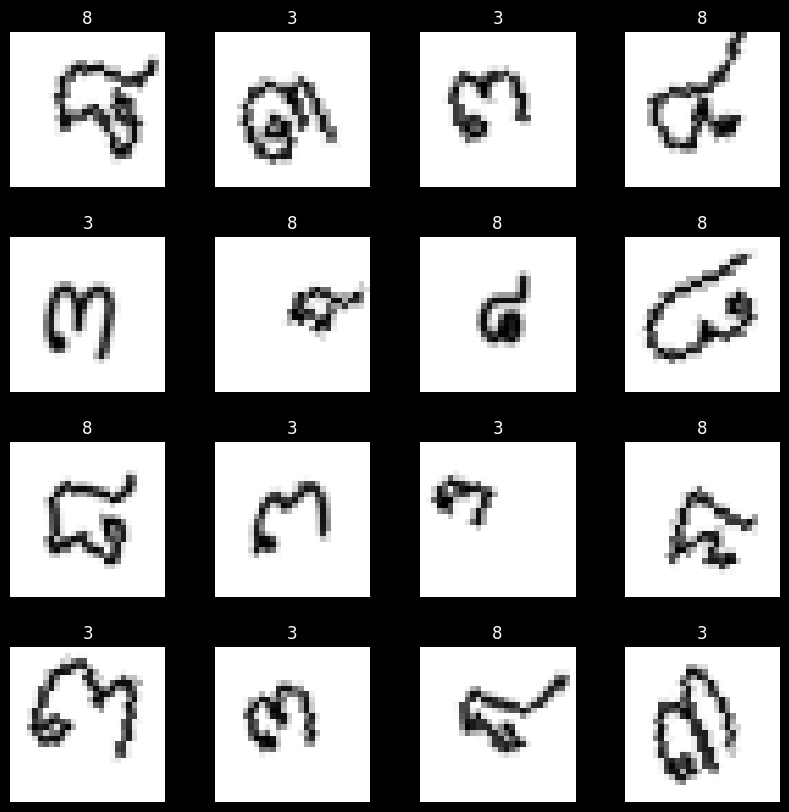

Train Dataset:
	Number of images in class 0: 271
	Number of images in class 1: 261
	Number of train samples: 532
Test Dataset:
	Number of images in class 0: 66
	Number of images in class 1: 67
	Number of test samples: 133


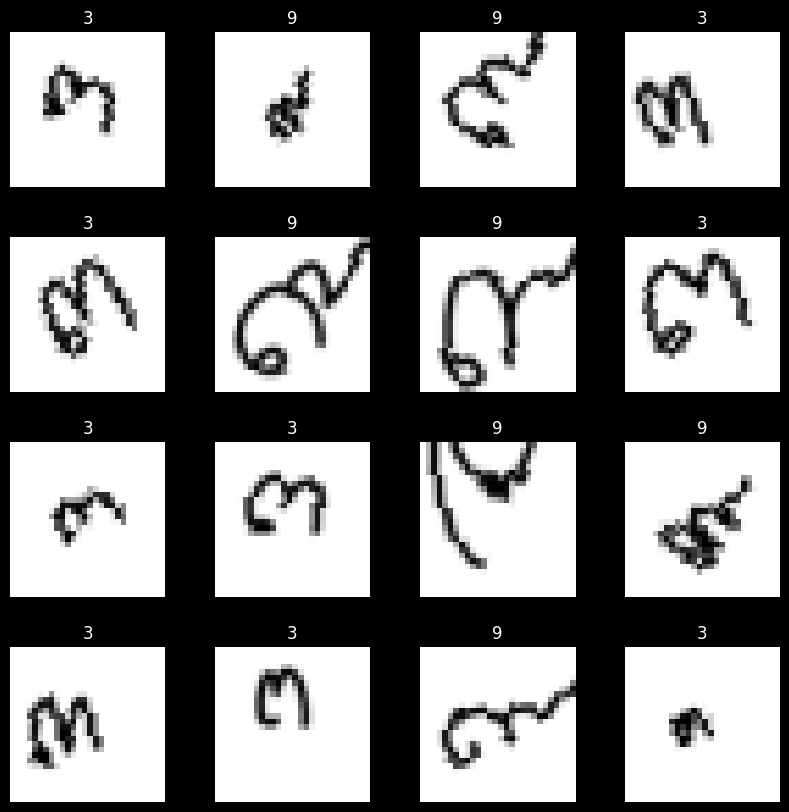

Train Dataset:
	Number of images in class 0: 269
	Number of images in class 1: 267
	Number of train samples: 536
Test Dataset:
	Number of images in class 0: 68
	Number of images in class 1: 67
	Number of test samples: 135


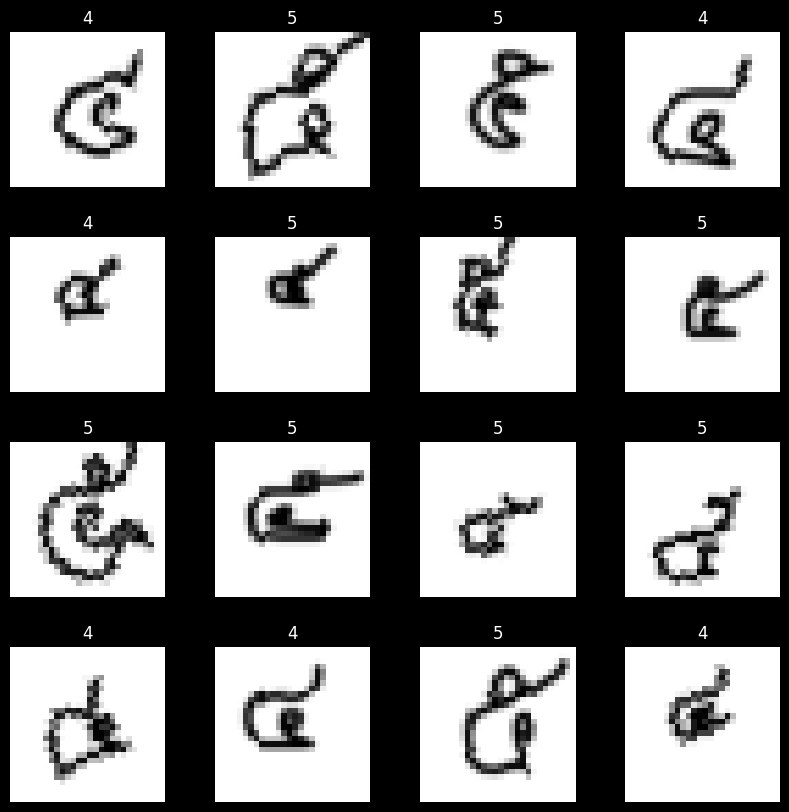

Train Dataset:
	Number of images in class 0: 270
	Number of images in class 1: 258
	Number of train samples: 528
Test Dataset:
	Number of images in class 0: 67
	Number of images in class 1: 65
	Number of test samples: 132


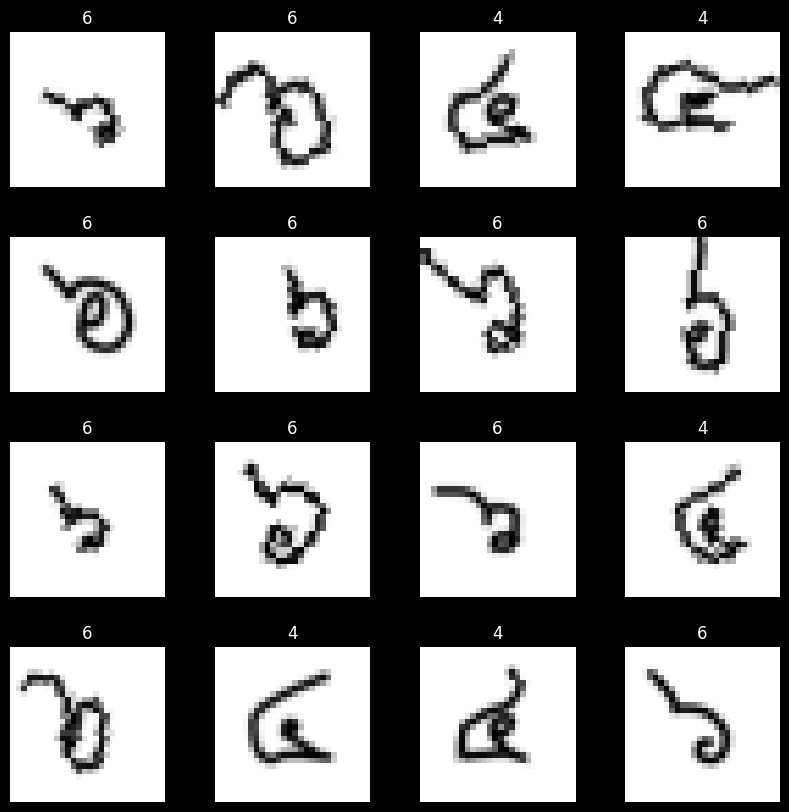

Train Dataset:
	Number of images in class 0: 269
	Number of images in class 1: 265
	Number of train samples: 534
Test Dataset:
	Number of images in class 0: 68
	Number of images in class 1: 66
	Number of test samples: 134


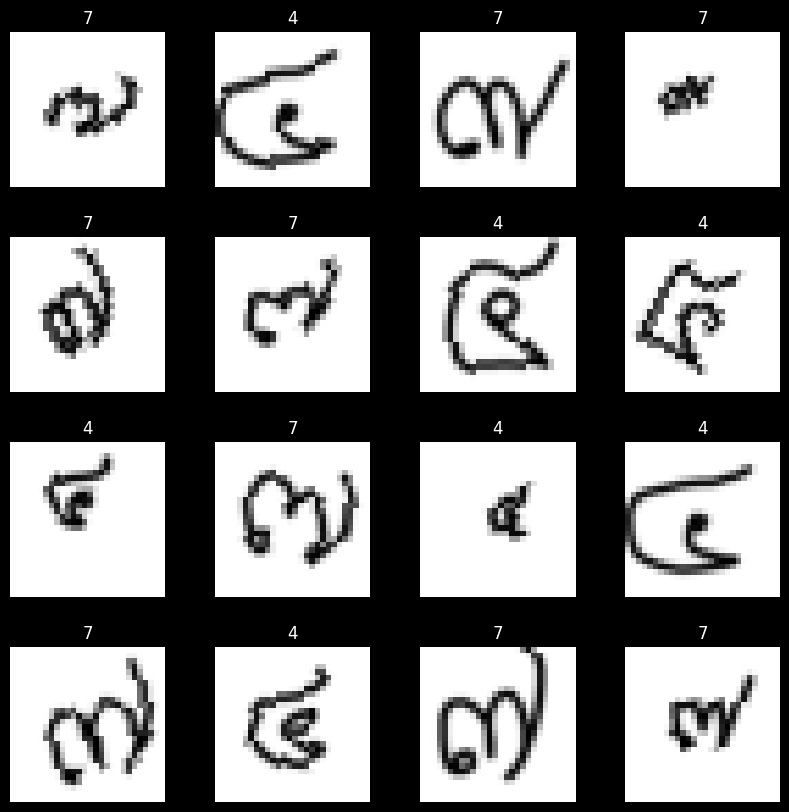

Train Dataset:
	Number of images in class 0: 269
	Number of images in class 1: 265
	Number of train samples: 534
Test Dataset:
	Number of images in class 0: 68
	Number of images in class 1: 66
	Number of test samples: 134


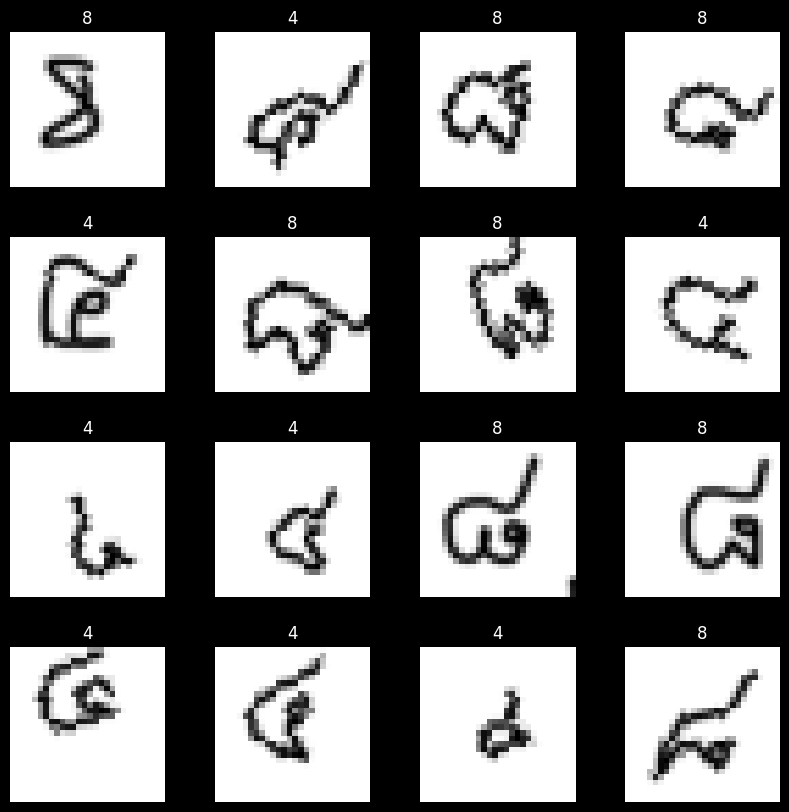

Train Dataset:
	Number of images in class 0: 269
	Number of images in class 1: 260
	Number of train samples: 529
Test Dataset:
	Number of images in class 0: 68
	Number of images in class 1: 65
	Number of test samples: 133


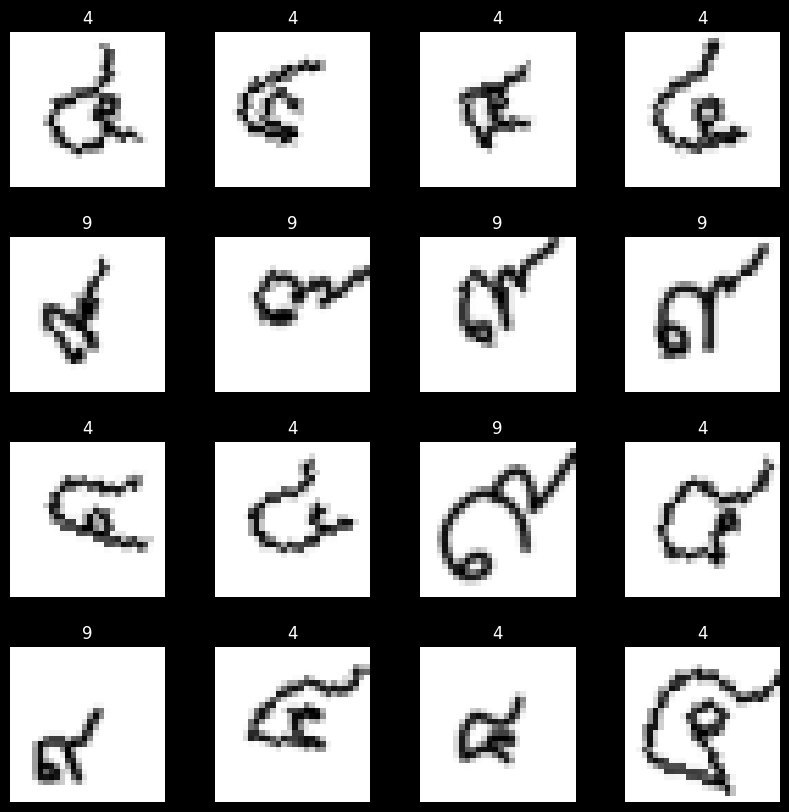

Train Dataset:
	Number of images in class 0: 269
	Number of images in class 1: 256
	Number of train samples: 525
Test Dataset:
	Number of images in class 0: 68
	Number of images in class 1: 64
	Number of test samples: 132


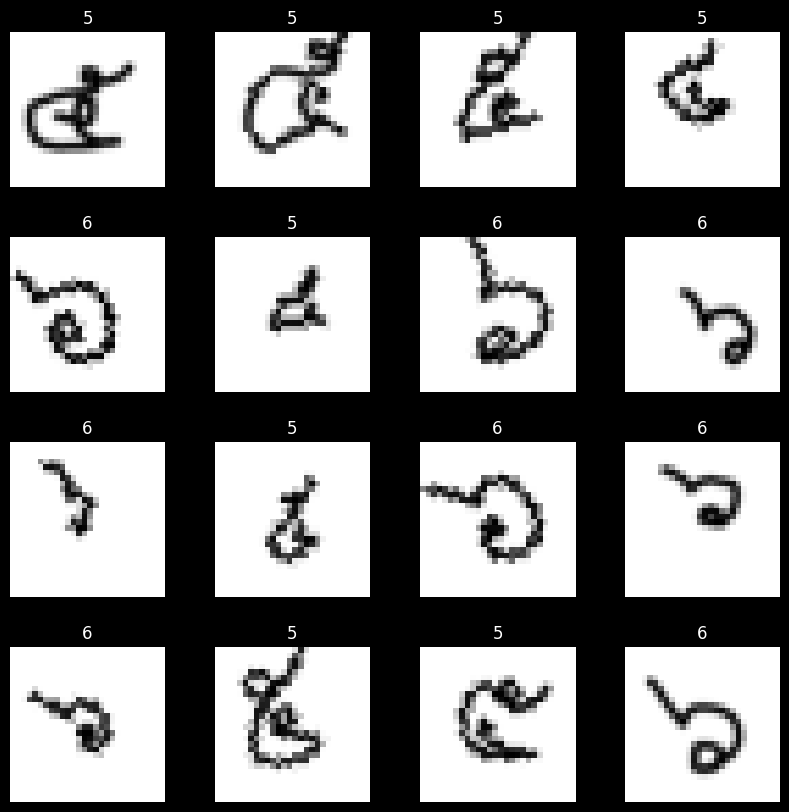

Train Dataset:
	Number of images in class 0: 269
	Number of images in class 1: 263
	Number of train samples: 532
Test Dataset:
	Number of images in class 0: 68
	Number of images in class 1: 65
	Number of test samples: 133


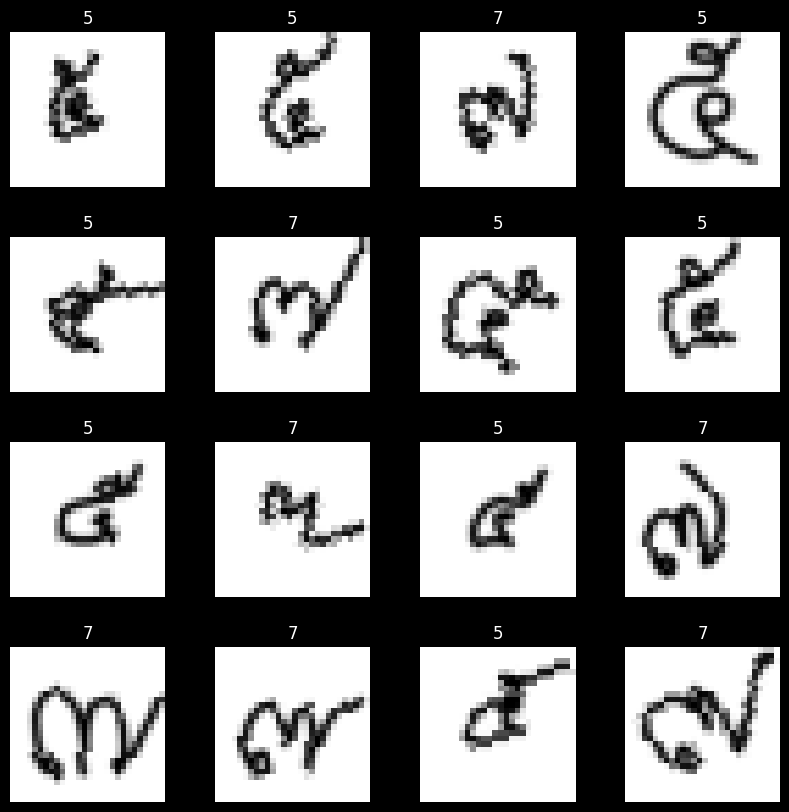

Train Dataset:
	Number of images in class 0: 269
	Number of images in class 1: 263
	Number of train samples: 532
Test Dataset:
	Number of images in class 0: 68
	Number of images in class 1: 65
	Number of test samples: 133


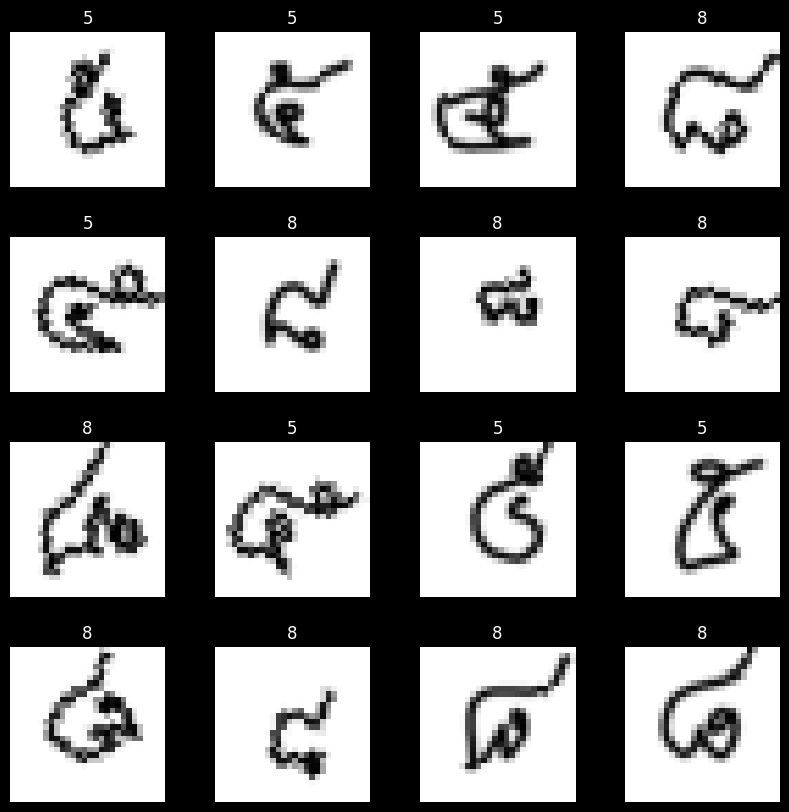

Train Dataset:
	Number of images in class 0: 269
	Number of images in class 1: 258
	Number of train samples: 527
Test Dataset:
	Number of images in class 0: 68
	Number of images in class 1: 64
	Number of test samples: 132


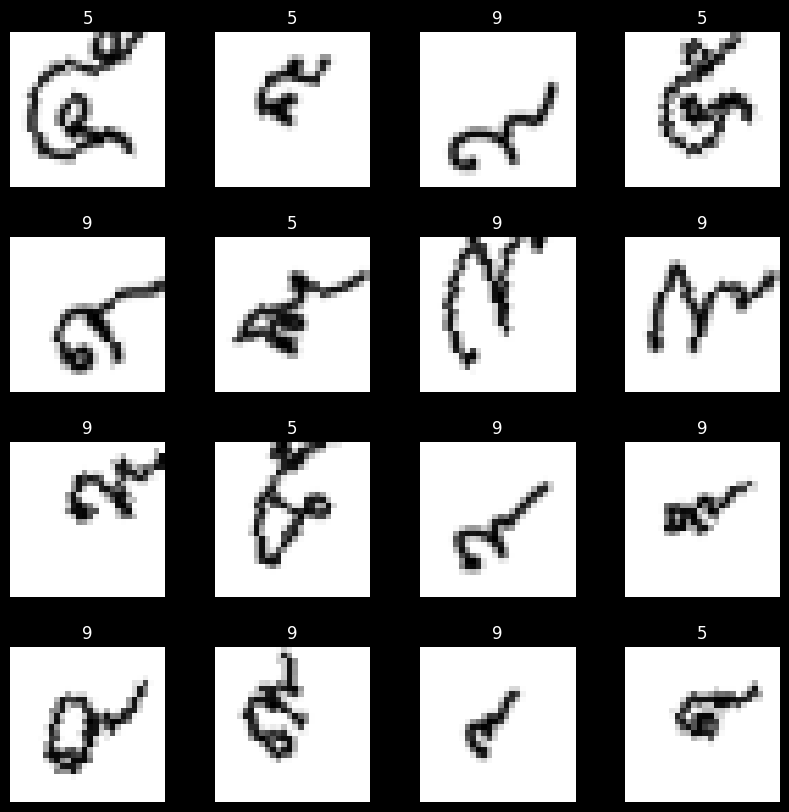

Train Dataset:
	Number of images in class 0: 270
	Number of images in class 1: 253
	Number of train samples: 523
Test Dataset:
	Number of images in class 0: 67
	Number of images in class 1: 64
	Number of test samples: 131


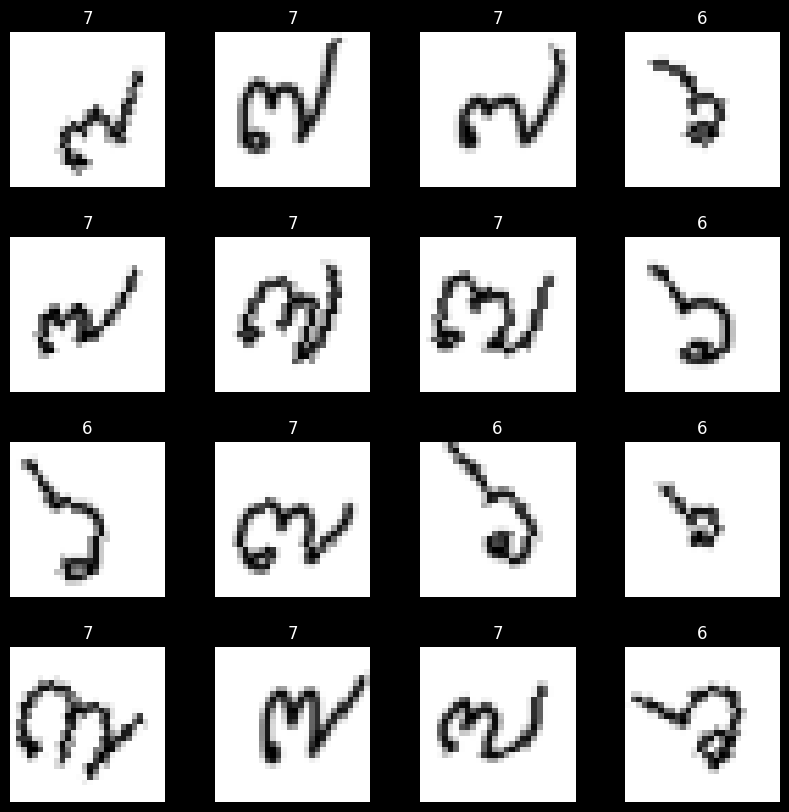

Train Dataset:
	Number of images in class 0: 270
	Number of images in class 1: 253
	Number of train samples: 523
Test Dataset:
	Number of images in class 0: 67
	Number of images in class 1: 64
	Number of test samples: 131


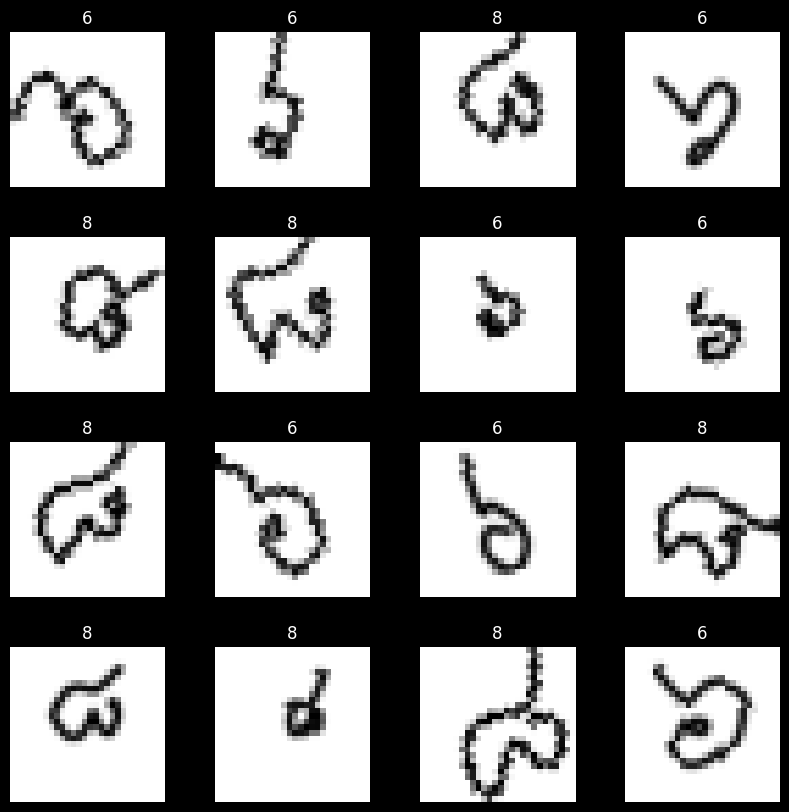

Train Dataset:
	Number of images in class 0: 270
	Number of images in class 1: 248
	Number of train samples: 518
Test Dataset:
	Number of images in class 0: 67
	Number of images in class 1: 63
	Number of test samples: 130


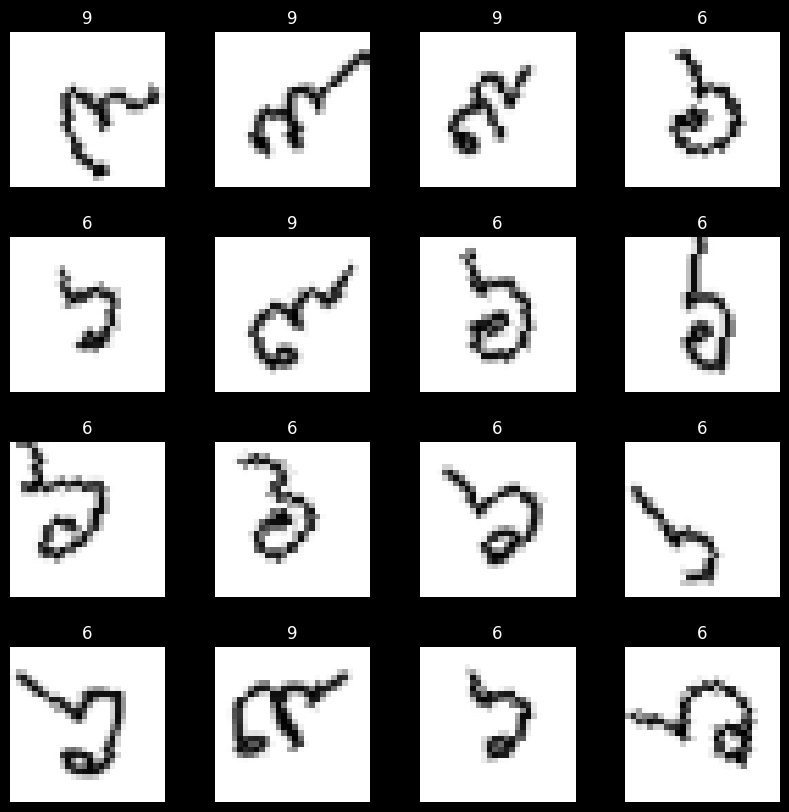

Train Dataset:
	Number of images in class 0: 268
	Number of images in class 1: 261
	Number of train samples: 529
Test Dataset:
	Number of images in class 0: 69
	Number of images in class 1: 64
	Number of test samples: 133


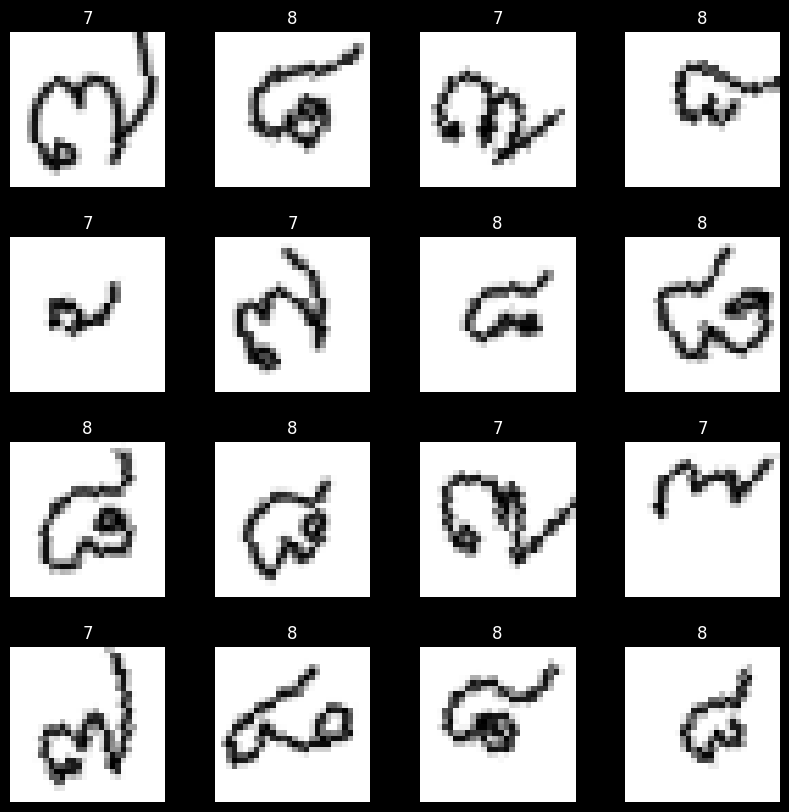

Train Dataset:
	Number of images in class 0: 268
	Number of images in class 1: 256
	Number of train samples: 524
Test Dataset:
	Number of images in class 0: 69
	Number of images in class 1: 63
	Number of test samples: 132


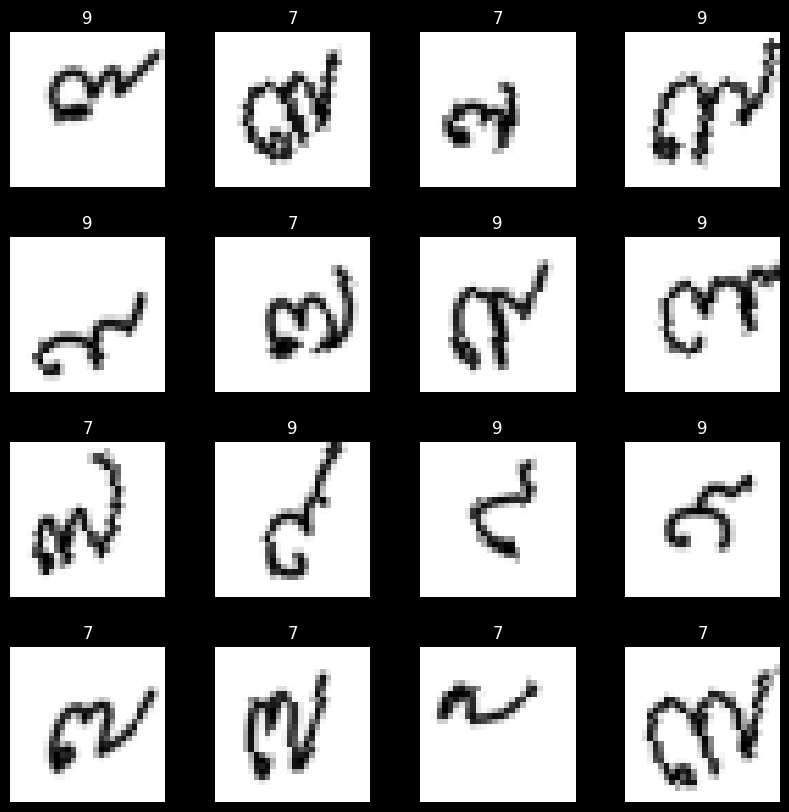

Train Dataset:
	Number of images in class 0: 268
	Number of images in class 1: 256
	Number of train samples: 524
Test Dataset:
	Number of images in class 0: 69
	Number of images in class 1: 63
	Number of test samples: 132


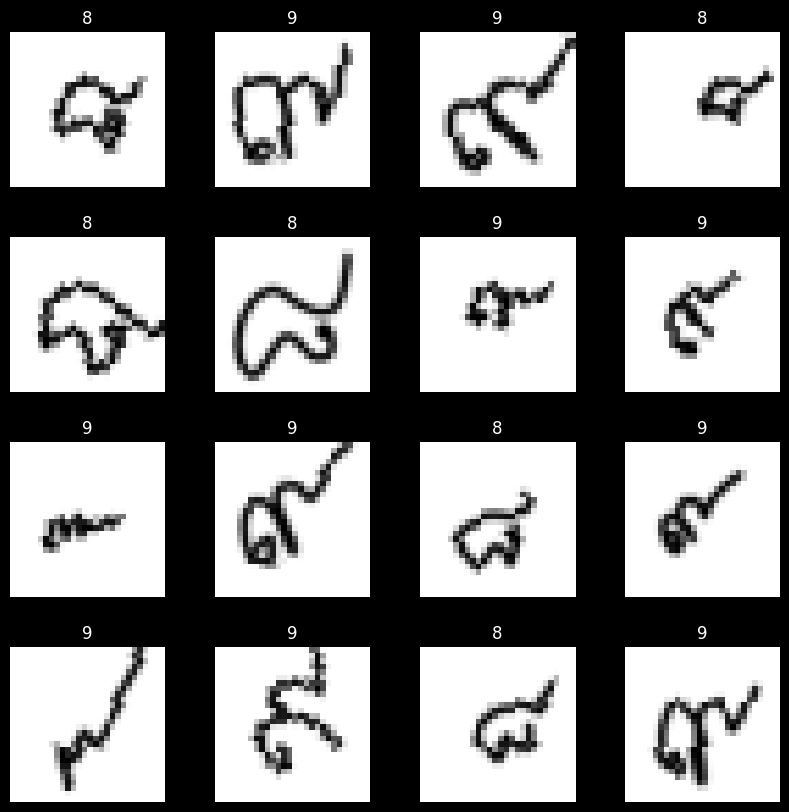

In [10]:
# all class_name and test_loader
combination = []
for i in range(0,10):
      for j in range(1,10):
        if i<j :
            combination.append([str(i),str(j)])
            
cn_and_loader = []
for com in combination:
      class_names = com
      train_loader, test_loader = load_data('./thai-handwriting-number/thai-handwriting-number.appspot.com',class_names)
      cn_and_loader.append((class_names,train_loader,test_loader))

Training Epoch [1/5]:   0%|          | 0/35 [00:00<?, ?batch/s]

Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.12batch/s, loss=0.671]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.99batch/s, loss=0.623]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.33batch/s, loss=0.509]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.84batch/s, loss=0.3]  


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.44batch/s, loss=0.185]


Epoch 5, Loss: 0.3534, Accuracy: 0.8428, Test Loss: 0.3520, Test Accuracy: 0.7956

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.90batch/s, loss=0.015] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 31.64batch/s, loss=0.0513]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 39.88batch/s, loss=0.822] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.99batch/s, loss=0.299]  


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 33.93batch/s, loss=0.022]  


Epoch 5, Loss: 0.0639, Accuracy: 0.9797, Test Loss: 0.0320, Test Accuracy: 0.9779

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.26batch/s, loss=0.0481]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.48batch/s, loss=0.307] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.29batch/s, loss=0.301] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.38batch/s, loss=0.322] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.05batch/s, loss=0.00715]


Epoch 5, Loss: 0.0932, Accuracy: 0.9612, Test Loss: 0.0741, Test Accuracy: 0.9706

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 30.04batch/s, loss=0.0952] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 25.32batch/s, loss=0.768] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.53batch/s, loss=0.00151]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 27.09batch/s, loss=0.306]  


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 33.27batch/s, loss=0.00471]


Epoch 5, Loss: 0.0479, Accuracy: 0.9814, Test Loss: 0.0358, Test Accuracy: 0.9778

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.02batch/s, loss=0.000124]
C:\Users\USERIT\AppData\Local\Temp\ipykernel_22132\1396517491.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1, len(features), figsize=(len(features)*3, 4))


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 25.24batch/s, loss=0.0071]  


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 19.01batch/s, loss=0.0991]  


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 33.82batch/s, loss=0.00357] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.61batch/s, loss=0.00486] 


Epoch 5, Loss: 0.0036, Accuracy: 0.9981, Test Loss: 0.0314, Test Accuracy: 0.9852

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.37batch/s, loss=0.0101]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.30batch/s, loss=0.637] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.89batch/s, loss=0.00688]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 28.78batch/s, loss=0.00493]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.93batch/s, loss=0.173] 


Epoch 5, Loss: 0.0655, Accuracy: 0.9697, Test Loss: 0.0733, Test Accuracy: 0.9621

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 25.26batch/s, loss=0.000212]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 30.20batch/s, loss=0.125]   


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 31.22batch/s, loss=4.98e-5]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 30.66batch/s, loss=0.000547]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 39.04batch/s, loss=0.000293]


Epoch 5, Loss: 0.0147, Accuracy: 0.9925, Test Loss: 0.0488, Test Accuracy: 0.9776

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 30.16batch/s, loss=0.00615]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 30.55batch/s, loss=0.00293]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 27.66batch/s, loss=0.49]   


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 28.44batch/s, loss=0.0166] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 30.92batch/s, loss=0.0339] 


Epoch 5, Loss: 0.0183, Accuracy: 0.9925, Test Loss: 0.0703, Test Accuracy: 0.9851

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.22batch/s, loss=0.139]   


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.43batch/s, loss=0.164] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 27.95batch/s, loss=0.0727] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.60batch/s, loss=0.000222]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.33batch/s, loss=0.000566]


Epoch 5, Loss: 0.0228, Accuracy: 0.9962, Test Loss: 0.1002, Test Accuracy: 0.9699

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.34batch/s, loss=0.456]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.91batch/s, loss=0.0613]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.83batch/s, loss=0.0119] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 26.82batch/s, loss=0.00357]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.32batch/s, loss=0.0364] 


Epoch 5, Loss: 0.0992, Accuracy: 0.9528, Test Loss: 0.0749, Test Accuracy: 0.9710

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.15batch/s, loss=0.153] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 27.49batch/s, loss=0.0871]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.76batch/s, loss=0.00828]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.09batch/s, loss=0.411] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.80batch/s, loss=0.183]  


Epoch 5, Loss: 0.0853, Accuracy: 0.9672, Test Loss: 0.1817, Test Accuracy: 0.8986

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 28.71batch/s, loss=0.162] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 33.60batch/s, loss=0.501] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.71batch/s, loss=0.00814]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.66batch/s, loss=0.139]  


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 24.50batch/s, loss=0.000484]


Epoch 5, Loss: 0.0185, Accuracy: 0.9945, Test Loss: 0.0434, Test Accuracy: 0.9854

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 27.94batch/s, loss=0.00713]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 27.63batch/s, loss=0.0286]  


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 24.74batch/s, loss=1.18e-5] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.15batch/s, loss=6.38e-5]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 22.54batch/s, loss=0.000167]


Epoch 5, Loss: 0.0075, Accuracy: 0.9982, Test Loss: 0.0508, Test Accuracy: 0.9854

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 30.43batch/s, loss=0.454]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:01<00:00,  6.52batch/s, loss=0.00465]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 26.63batch/s, loss=0.00687]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.33batch/s, loss=0.00338]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.54batch/s, loss=0.00271]


Epoch 5, Loss: 0.0385, Accuracy: 0.9813, Test Loss: 0.1249, Test Accuracy: 0.9403

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 13.63batch/s, loss=0.0191] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.23batch/s, loss=0.00149] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 28.61batch/s, loss=0.0081]  


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.83batch/s, loss=0.661]  


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.60batch/s, loss=0.0137] 


Epoch 5, Loss: 0.0130, Accuracy: 0.9982, Test Loss: 0.0519, Test Accuracy: 0.9779

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 13.34batch/s, loss=0.00112]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.30batch/s, loss=0.00573]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 33.20batch/s, loss=0.139]   


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 33.64batch/s, loss=0.00115] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 23.29batch/s, loss=0.0012]  


Epoch 5, Loss: 0.0104, Accuracy: 0.9963, Test Loss: 0.1031, Test Accuracy: 0.9853

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:01<00:00,  8.87batch/s, loss=1.12e-5] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.77batch/s, loss=0.00434]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.83batch/s, loss=0.000695]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 28.93batch/s, loss=0.0055]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.88batch/s, loss=0.00381] 


Epoch 5, Loss: 0.0186, Accuracy: 0.9944, Test Loss: 0.0901, Test Accuracy: 0.9704

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:01<00:00,  7.69batch/s, loss=0.0288]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 33.85batch/s, loss=0.0963]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.70batch/s, loss=0.189] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.13batch/s, loss=0.0151]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.51batch/s, loss=0.471]  


Epoch 5, Loss: 0.0614, Accuracy: 0.9688, Test Loss: 0.1083, Test Accuracy: 0.9781

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 12.74batch/s, loss=0.0451]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.44batch/s, loss=0.0127]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 24.95batch/s, loss=0.00661] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 31.98batch/s, loss=0.0183]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 33.14batch/s, loss=0.00153] 


Epoch 5, Loss: 0.0184, Accuracy: 0.9926, Test Loss: 0.0760, Test Accuracy: 0.9706

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 12.99batch/s, loss=0.0266]  


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 30.56batch/s, loss=7.09e-5] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 22.63batch/s, loss=0.038]   


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 24.04batch/s, loss=0.000738]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 30.82batch/s, loss=0.00945] 


Epoch 5, Loss: 0.0228, Accuracy: 0.9926, Test Loss: 0.0402, Test Accuracy: 0.9853

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.36batch/s, loss=0.276]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 28.15batch/s, loss=0.00547]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 31.95batch/s, loss=0.0761]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 28.00batch/s, loss=0.0206] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 28.74batch/s, loss=0.0779]


Epoch 5, Loss: 0.0769, Accuracy: 0.9737, Test Loss: 0.1016, Test Accuracy: 0.9699

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.12batch/s, loss=0.000923]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.37batch/s, loss=0.00382]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.07batch/s, loss=0.00846]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.74batch/s, loss=0.00103]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 31.16batch/s, loss=0.000924]


Epoch 5, Loss: 0.0305, Accuracy: 0.9907, Test Loss: 0.0861, Test Accuracy: 0.9481

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.26batch/s, loss=0.0343] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.31batch/s, loss=0.000773]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.90batch/s, loss=0.0119] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.54batch/s, loss=0.0195] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 26.71batch/s, loss=0.0833]  


Epoch 5, Loss: 0.0292, Accuracy: 0.9926, Test Loss: 0.0202, Test Accuracy: 0.9926

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.72batch/s, loss=0.000335]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.91batch/s, loss=0.000401]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 39.07batch/s, loss=0.000151]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 22.40batch/s, loss=0.015]   


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 31.45batch/s, loss=0.0975] 


Epoch 5, Loss: 0.0064, Accuracy: 0.9981, Test Loss: 0.0206, Test Accuracy: 0.9925

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 28.16batch/s, loss=0.0305]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.22batch/s, loss=0.00815]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.76batch/s, loss=0.0696] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 27.23batch/s, loss=0.025]  


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.68batch/s, loss=0.0418] 


Epoch 5, Loss: 0.0177, Accuracy: 0.9945, Test Loss: 0.0201, Test Accuracy: 0.9926

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.15batch/s, loss=0.00196]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 33.97batch/s, loss=0.00517]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.43batch/s, loss=0.00405]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.52batch/s, loss=0.00151]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.03batch/s, loss=0.0193]  


Epoch 5, Loss: 0.0058, Accuracy: 1.0000, Test Loss: 0.0147, Test Accuracy: 1.0000

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.81batch/s, loss=0.294] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.60batch/s, loss=0.0441]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.97batch/s, loss=0.0817]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.45batch/s, loss=0.0716] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 27.55batch/s, loss=0.0586] 


Epoch 5, Loss: 0.0300, Accuracy: 0.9887, Test Loss: 0.0369, Test Accuracy: 0.9850

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.58batch/s, loss=0.0429]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.14batch/s, loss=0.000357]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 27.92batch/s, loss=0.0258]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 31.55batch/s, loss=0.0222] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.79batch/s, loss=0.131]  


Epoch 5, Loss: 0.0313, Accuracy: 0.9888, Test Loss: 0.0982, Test Accuracy: 0.9704

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.39batch/s, loss=0.0247] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 30.99batch/s, loss=0.000105]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 22.17batch/s, loss=0.00102]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 24.65batch/s, loss=0.00294]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 31.94batch/s, loss=0.000315]


Epoch 5, Loss: 0.0075, Accuracy: 0.9981, Test Loss: 0.0708, Test Accuracy: 0.9704

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.84batch/s, loss=0.000109]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.17batch/s, loss=0.0019]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.00batch/s, loss=0.00525]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 30.31batch/s, loss=0.0413] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.48batch/s, loss=0.0272] 


Epoch 5, Loss: 0.0122, Accuracy: 0.9962, Test Loss: 0.0676, Test Accuracy: 0.9624

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 33.46batch/s, loss=0.72] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 33.10batch/s, loss=0.266]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 30.84batch/s, loss=0.0074]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.24batch/s, loss=0.122]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.99batch/s, loss=0.447]


Epoch 5, Loss: 0.2588, Accuracy: 0.8937, Test Loss: 0.4096, Test Accuracy: 0.8074

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 33.91batch/s, loss=0.0343]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.76batch/s, loss=0.00179]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 33.13batch/s, loss=0.0101] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.19batch/s, loss=0.0307]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 28.27batch/s, loss=0.0113] 


Epoch 5, Loss: 0.0465, Accuracy: 0.9792, Test Loss: 0.0561, Test Accuracy: 0.9697

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 31.39batch/s, loss=0.16]  


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 31.28batch/s, loss=0.417]  


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 30.86batch/s, loss=0.258]  


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.29batch/s, loss=0.00624]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.38batch/s, loss=0.00134]


Epoch 5, Loss: 0.0292, Accuracy: 0.9906, Test Loss: 0.0590, Test Accuracy: 0.9776

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.32batch/s, loss=0.405]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 28.17batch/s, loss=1.01] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.60batch/s, loss=0.759]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 30.26batch/s, loss=0.548] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.21batch/s, loss=0.159]


Epoch 5, Loss: 0.2268, Accuracy: 0.9157, Test Loss: 0.3077, Test Accuracy: 0.8731

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 19.09batch/s, loss=0.449]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 28.09batch/s, loss=0.0361]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.27batch/s, loss=0.0512]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.27batch/s, loss=0.873] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.01batch/s, loss=0.00948]


Epoch 5, Loss: 0.0960, Accuracy: 0.9546, Test Loss: 0.1188, Test Accuracy: 0.9549

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.11batch/s, loss=4.78e-5]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 26.75batch/s, loss=0.000815]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 31.85batch/s, loss=0.00176] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.27batch/s, loss=0.000937]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.74batch/s, loss=0.00862] 


Epoch 5, Loss: 0.0150, Accuracy: 0.9962, Test Loss: 0.0157, Test Accuracy: 0.9848

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 31.61batch/s, loss=8.07e-5]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 33.58batch/s, loss=0.0186]  


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 27.05batch/s, loss=0.000841]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 17.45batch/s, loss=5.31e-5] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.06batch/s, loss=0.034]   


Epoch 5, Loss: 0.0339, Accuracy: 0.9887, Test Loss: 0.0564, Test Accuracy: 0.9850

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 23.77batch/s, loss=0.237]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 21.69batch/s, loss=0.0554]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 28.05batch/s, loss=0.59]  


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 25.81batch/s, loss=0.00253]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.38batch/s, loss=0.0427]


Epoch 5, Loss: 0.0662, Accuracy: 0.9774, Test Loss: 0.1207, Test Accuracy: 0.9474

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 30.18batch/s, loss=0.0113]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.12batch/s, loss=0.0112] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.51batch/s, loss=0.148]  


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.20batch/s, loss=0.000412]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 23.53batch/s, loss=0.198]  


Epoch 5, Loss: 0.0388, Accuracy: 0.9905, Test Loss: 0.1457, Test Accuracy: 0.9318

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.21batch/s, loss=0.643]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.52batch/s, loss=0.0171]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.13batch/s, loss=0.108] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.84batch/s, loss=0.0598]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.76batch/s, loss=0.000528]


Epoch 5, Loss: 0.0930, Accuracy: 0.9579, Test Loss: 0.1772, Test Accuracy: 0.9695

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.41batch/s, loss=0.611] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.08batch/s, loss=0.0108]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 26.24batch/s, loss=0.00016]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 26.77batch/s, loss=0.0269] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.48batch/s, loss=0.0176] 


Epoch 5, Loss: 0.0712, Accuracy: 0.9751, Test Loss: 0.1007, Test Accuracy: 0.9542

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 16.62batch/s, loss=9.59e-5]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 19.95batch/s, loss=0.00626]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.94batch/s, loss=0.000207]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 24.33batch/s, loss=0.000517]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.17batch/s, loss=0.00011] 


Epoch 5, Loss: 0.0206, Accuracy: 0.9903, Test Loss: 0.0938, Test Accuracy: 0.9692

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.87batch/s, loss=0.512]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 33.40batch/s, loss=0.365]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.77batch/s, loss=0.35] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 24.31batch/s, loss=0.496] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 31.46batch/s, loss=0.0618]


Epoch 5, Loss: 0.1709, Accuracy: 0.9433, Test Loss: 0.0909, Test Accuracy: 0.9699

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 31.28batch/s, loss=0.0827]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 31.07batch/s, loss=0.174]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 33.60batch/s, loss=0.0324]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.74batch/s, loss=0.503] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.29batch/s, loss=1.85]  


Epoch 5, Loss: 0.1348, Accuracy: 0.9523, Test Loss: 0.3081, Test Accuracy: 0.9394

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.16batch/s, loss=0.276]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.37batch/s, loss=0.193]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.19batch/s, loss=0.125] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.99batch/s, loss=0.0852]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.64batch/s, loss=0.0734]


Epoch 5, Loss: 0.1461, Accuracy: 0.9447, Test Loss: 0.2077, Test Accuracy: 0.9318

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


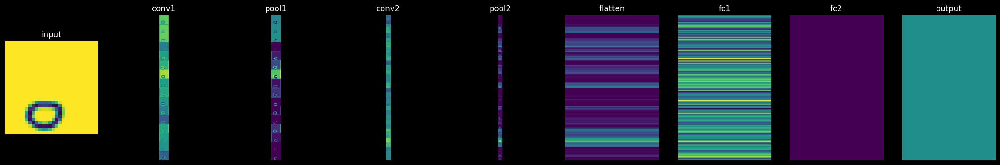

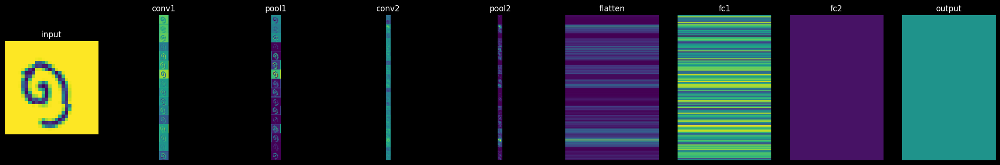

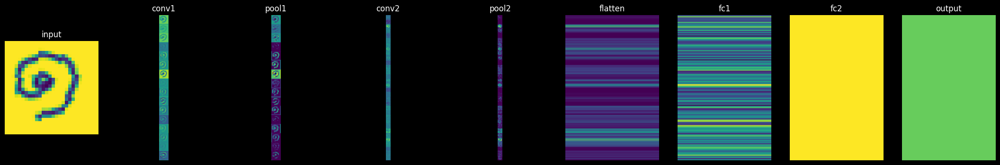

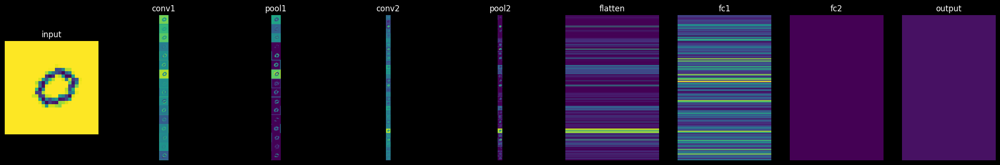

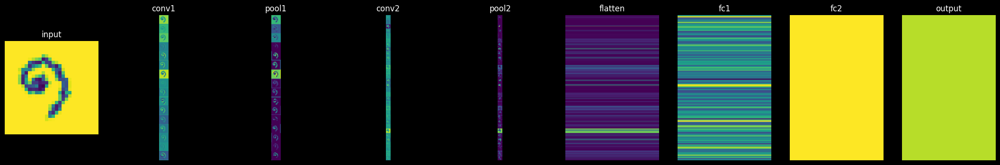

...

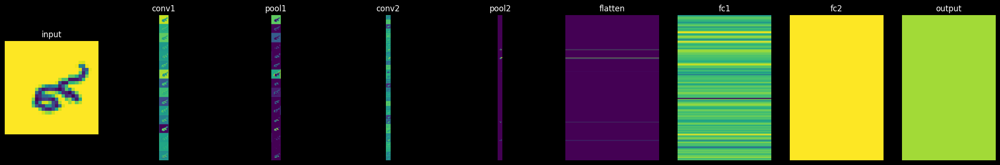

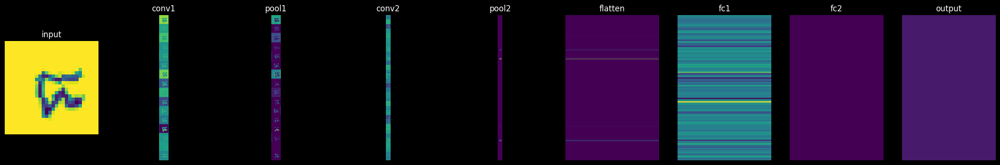

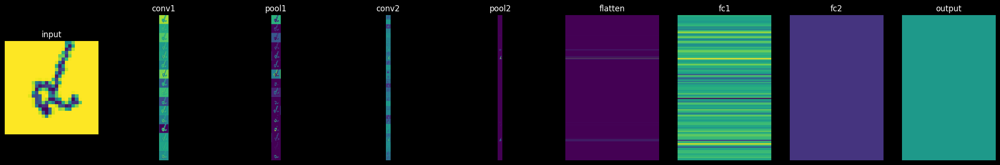

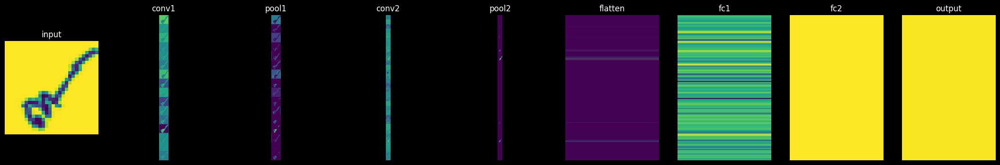

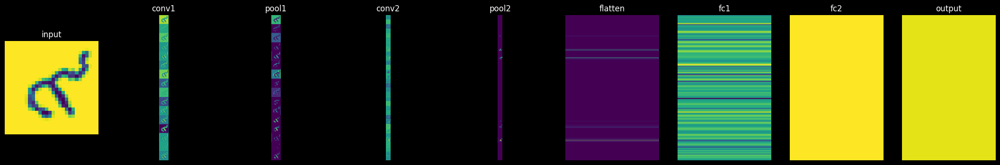

In [11]:
### START CODE HERE ###


cnn_model = CNN() 
loss_fn = nn.BCELoss()
optimizer = torch.optim.SGD(cnn_model.parameters(), lr=0.01, momentum=0.9)

for cl in cn_and_loader:
    class_names,train_loader,test_loader  = cl
    writer = SummaryWriter(log_dir=f'runs/{class_names[0]}_{class_names[1]}/CNN')

    device = 'cpu'

    cnn_history = train(
        class_names,
        cnn_model,
        optimizer,
        loss_fn,
        train_loader,
        test_loader,
        epochs=5,
        writer=writer,
        checkpoint_path=f"checkpoints/cnn_model/{class_names}.pth",
        device=device,
    )

### END CODE HERE ###

Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 14.02batch/s, loss=0.535]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-1.455, max=4.419
torch.Size([16, 1])
sigmoid values: min=0.189, max=0.988
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 44.35batch/s, loss=0.591]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-2.113, max=4.267
torch.Size([16, 1])
sigmoid values: min=0.108, max=0.986
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 43.44batch/s, loss=0.381]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.253, max=7.035
torch.Size([16, 1])
sigmoid values: min=0.037, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 43.70batch/s, loss=0.61] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.369, max=6.644
torch.Size([16, 1])
sigmoid values: min=0.013, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.96batch/s, loss=0.272]


Epoch 5, Loss: 0.5159, Accuracy: 0.7770, Test Loss: 0.5648, Test Accuracy: 0.7080

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.843, max=3.163
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.959
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.75batch/s, loss=0.0498]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-2.947, max=5.781
torch.Size([16, 1])
sigmoid values: min=0.050, max=0.997
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 43.96batch/s, loss=0.144]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.770, max=4.559
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.990
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 43.37batch/s, loss=0.0406]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.311, max=7.315
torch.Size([16, 1])
sigmoid values: min=0.013, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 43.62batch/s, loss=0.389] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.702, max=5.496
torch.Size([16, 1])
sigmoid values: min=0.009, max=0.996
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 42.63batch/s, loss=0.165] 


Epoch 5, Loss: 0.2485, Accuracy: 0.9227, Test Loss: 0.1447, Test Accuracy: 0.9412

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.220, max=3.286
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.964
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 40.03batch/s, loss=0.0796]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.031, max=4.311
torch.Size([16, 1])
sigmoid values: min=0.006, max=0.987
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 44.56batch/s, loss=0.455]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.374, max=5.530
torch.Size([16, 1])
sigmoid values: min=0.002, max=0.996
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 17.20batch/s, loss=0.624] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.262, max=3.762
torch.Size([16, 1])
sigmoid values: min=0.014, max=0.977
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.71batch/s, loss=0.195]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-9.222, max=8.356
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 46.78batch/s, loss=0.272]


Epoch 5, Loss: 0.2801, Accuracy: 0.9057, Test Loss: 0.2060, Test Accuracy: 0.9412

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.024, max=6.089
torch.Size([16, 1])
sigmoid values: min=0.002, max=0.998
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.82batch/s, loss=0.146]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.573, max=4.645
torch.Size([16, 1])
sigmoid values: min=0.004, max=0.990
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 31.73batch/s, loss=0.0189]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.561, max=11.637
torch.Size([16, 1])
sigmoid values: min=0.010, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 23.68batch/s, loss=0.0586]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.567, max=9.340
torch.Size([16, 1])
sigmoid values: min=0.010, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 19.15batch/s, loss=0.971] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-11.371, max=8.539
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.29batch/s, loss=0.593] 


Epoch 5, Loss: 0.1884, Accuracy: 0.9369, Test Loss: 0.2888, Test Accuracy: 0.9111

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.063, max=9.241
torch.Size([16, 1])
sigmoid values: min=0.002, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.49batch/s, loss=0.0307]
C:\Users\USERIT\AppData\Local\Temp\ipykernel_22132\1396517491.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1, len(features), figsize=(len(features)*3, 4))


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.929, max=12.512
torch.Size([16, 1])
sigmoid values: min=0.001, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.37batch/s, loss=0.109] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.337, max=9.645
torch.Size([16, 1])
sigmoid values: min=0.005, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 42.52batch/s, loss=0.00864]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-9.049, max=15.794
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.18batch/s, loss=0.00591]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-13.005, max=12.834
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 41.60batch/s, loss=0.0303]


Epoch 5, Loss: 0.0864, Accuracy: 0.9720, Test Loss: 0.1121, Test Accuracy: 0.9556

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-9.598, max=14.651
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 39.26batch/s, loss=0.892]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.793, max=7.243
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 46.29batch/s, loss=0.6]  


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.797, max=7.823
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 47.56batch/s, loss=1.27] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-2.583, max=11.043
torch.Size([16, 1])
sigmoid values: min=0.070, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.89batch/s, loss=1.49] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.426, max=4.316
torch.Size([16, 1])
sigmoid values: min=0.002, max=0.987
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 46.90batch/s, loss=0.693] 


Epoch 5, Loss: 0.3244, Accuracy: 0.8788, Test Loss: 0.4910, Test Accuracy: 0.8333

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-12.781, max=4.708
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.991
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.25batch/s, loss=1.52] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-10.276, max=5.140
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.994
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 40.07batch/s, loss=0.00127]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-11.087, max=6.969
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 43.70batch/s, loss=2.17] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.150, max=16.565
torch.Size([16, 1])
sigmoid values: min=0.016, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 46.03batch/s, loss=0.129]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.645, max=17.170
torch.Size([16, 1])
sigmoid values: min=0.010, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 45.53batch/s, loss=0.0176]


Epoch 5, Loss: 0.2367, Accuracy: 0.9345, Test Loss: 0.3215, Test Accuracy: 0.9179

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.682, max=9.860
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.29batch/s, loss=0.748]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.350, max=9.541
torch.Size([16, 1])
sigmoid values: min=0.034, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 46.48batch/s, loss=0.0121]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.497, max=7.028
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 46.64batch/s, loss=0.887] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.719, max=6.627
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 43.23batch/s, loss=0.0908]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.876, max=14.241
torch.Size([16, 1])
sigmoid values: min=0.020, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.60batch/s, loss=0.0968]


Epoch 5, Loss: 0.2327, Accuracy: 0.9326, Test Loss: 0.3430, Test Accuracy: 0.9403

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-14.880, max=11.502
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.20batch/s, loss=0.925]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-9.893, max=10.225
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 41.50batch/s, loss=0.00811]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.839, max=12.259
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 46.67batch/s, loss=0.704]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.939, max=15.236
torch.Size([16, 1])
sigmoid values: min=0.007, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 45.13batch/s, loss=2.03]  


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.196, max=10.963
torch.Size([16, 1])
sigmoid values: min=0.001, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.37batch/s, loss=0.0151]


Epoch 5, Loss: 0.2269, Accuracy: 0.9282, Test Loss: 0.3385, Test Accuracy: 0.9098

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.406, max=15.610
torch.Size([16, 1])
sigmoid values: min=0.004, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 30.00batch/s, loss=0.213]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-12.560, max=6.005
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.998
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.29batch/s, loss=0.317]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-12.617, max=5.847
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.997
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 40.37batch/s, loss=0.473] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-9.697, max=7.968
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.02batch/s, loss=0.679]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.662, max=5.916
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.997
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 45.23batch/s, loss=0.124]


Epoch 5, Loss: 0.8110, Accuracy: 0.7967, Test Loss: 0.4167, Test Accuracy: 0.8841

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.658, max=12.202
torch.Size([16, 1])
sigmoid values: min=0.003, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.89batch/s, loss=0.317]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.009, max=13.610
torch.Size([16, 1])
sigmoid values: min=0.018, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 27.40batch/s, loss=1.08] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.667, max=8.276
torch.Size([16, 1])
sigmoid values: min=0.009, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 31.75batch/s, loss=0.25] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.900, max=7.874
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 39.60batch/s, loss=2.46] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.710, max=14.733
torch.Size([16, 1])
sigmoid values: min=0.009, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 42.60batch/s, loss=0.0542]


Epoch 5, Loss: 0.4903, Accuracy: 0.8270, Test Loss: 0.5727, Test Accuracy: 0.8406

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.086, max=9.563
torch.Size([16, 1])
sigmoid values: min=0.001, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 41.85batch/s, loss=1.01] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.833, max=2.799
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.943
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 43.07batch/s, loss=0.205] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.603, max=6.885
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.33batch/s, loss=0.241]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.727, max=10.013
torch.Size([16, 1])
sigmoid values: min=0.001, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 24.23batch/s, loss=0.702]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.259, max=8.869
torch.Size([16, 1])
sigmoid values: min=0.005, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 45.27batch/s, loss=0.102]


Epoch 5, Loss: 0.4187, Accuracy: 0.8410, Test Loss: 0.6374, Test Accuracy: 0.7664

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.295, max=5.533
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.996
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 33.64batch/s, loss=0.0524]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.473, max=12.749
torch.Size([16, 1])
sigmoid values: min=0.004, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 42.36batch/s, loss=0.109] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.385, max=12.470
torch.Size([16, 1])
sigmoid values: min=0.002, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.76batch/s, loss=1.16] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.089, max=13.022
torch.Size([16, 1])
sigmoid values: min=0.044, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.63batch/s, loss=0.0383]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.032, max=10.813
torch.Size([16, 1])
sigmoid values: min=0.001, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 28.60batch/s, loss=0.0618]


Epoch 5, Loss: 0.5254, Accuracy: 0.8787, Test Loss: 0.3196, Test Accuracy: 0.8832

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.473, max=16.044
torch.Size([16, 1])
sigmoid values: min=0.011, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 25.36batch/s, loss=1.93] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.835, max=4.191
torch.Size([16, 1])
sigmoid values: min=0.008, max=0.985
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.86batch/s, loss=0.212]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.008, max=3.694
torch.Size([16, 1])
sigmoid values: min=0.002, max=0.976
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 25.83batch/s, loss=0.539]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-2.644, max=7.018
torch.Size([16, 1])
sigmoid values: min=0.066, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 39.29batch/s, loss=0.384]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-10.680, max=9.219
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.85batch/s, loss=0.996]


Epoch 5, Loss: 0.4190, Accuracy: 0.8507, Test Loss: 0.5971, Test Accuracy: 0.8209

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.702, max=4.910
torch.Size([16, 1])
sigmoid values: min=0.003, max=0.993
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.48batch/s, loss=0.536]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.350, max=9.718
torch.Size([16, 1])
sigmoid values: min=0.013, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.35batch/s, loss=0.195]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.937, max=10.463
torch.Size([16, 1])
sigmoid values: min=0.019, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 31.09batch/s, loss=0.144]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.094, max=15.343
torch.Size([16, 1])
sigmoid values: min=0.006, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 39.18batch/s, loss=0.11]  


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.394, max=13.213
torch.Size([16, 1])
sigmoid values: min=0.005, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 45.08batch/s, loss=0.494]


Epoch 5, Loss: 0.3204, Accuracy: 0.8819, Test Loss: 0.5185, Test Accuracy: 0.8603

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.974, max=8.675
torch.Size([16, 1])
sigmoid values: min=0.003, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 42.97batch/s, loss=0.215]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.421, max=9.217
torch.Size([16, 1])
sigmoid values: min=0.002, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 44.59batch/s, loss=0.401] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-9.004, max=5.155
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.994
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.77batch/s, loss=0.0771]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-10.461, max=5.807
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.997
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 43.94batch/s, loss=0.96]  


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.081, max=7.044
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 44.12batch/s, loss=1.19] 


Epoch 5, Loss: 0.3395, Accuracy: 0.8727, Test Loss: 0.5331, Test Accuracy: 0.8456

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.081, max=10.422
torch.Size([16, 1])
sigmoid values: min=0.017, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 46.17batch/s, loss=0.879]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-9.266, max=5.990
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.998
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.27batch/s, loss=0.702]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.398, max=7.220
torch.Size([16, 1])
sigmoid values: min=0.005, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 33.08batch/s, loss=0.0595]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.200, max=8.264
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.19batch/s, loss=0.112]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-9.713, max=7.009
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 46.45batch/s, loss=0.49]  


Epoch 5, Loss: 0.2990, Accuracy: 0.8883, Test Loss: 0.4644, Test Accuracy: 0.8667

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.574, max=9.768
torch.Size([16, 1])
sigmoid values: min=0.001, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.22batch/s, loss=0.209]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.060, max=3.978
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.982
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 45.79batch/s, loss=0.269]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.353, max=6.927
torch.Size([16, 1])
sigmoid values: min=0.005, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 45.52batch/s, loss=0.674]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.353, max=7.842
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 46.06batch/s, loss=0.583]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-2.068, max=9.797
torch.Size([16, 1])
sigmoid values: min=0.112, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 46.18batch/s, loss=0.264]


Epoch 5, Loss: 0.6207, Accuracy: 0.7578, Test Loss: 0.7810, Test Accuracy: 0.6569

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-11.742, max=2.433
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.919
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 45.17batch/s, loss=0.469]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-9.054, max=5.968
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.997
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 42.98batch/s, loss=0.711]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-10.927, max=6.144
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.998
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 46.68batch/s, loss=0.0952]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.635, max=7.438
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 44.48batch/s, loss=0.593] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-10.122, max=6.979
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 44.42batch/s, loss=0.991]


Epoch 5, Loss: 0.2773, Accuracy: 0.9024, Test Loss: 0.3335, Test Accuracy: 0.8897

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.880, max=10.508
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.70batch/s, loss=0.0388] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-12.080, max=10.705
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 39.70batch/s, loss=0.646]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-10.827, max=9.743
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 40.45batch/s, loss=1.17]  


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.746, max=12.408
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 21.70batch/s, loss=0.0987]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-15.317, max=13.910
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 43.33batch/s, loss=0.0331]


Epoch 5, Loss: 0.1819, Accuracy: 0.9389, Test Loss: 0.1886, Test Accuracy: 0.9412

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.231, max=16.500
torch.Size([16, 1])
sigmoid values: min=0.038, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.55batch/s, loss=0.0703]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-9.379, max=7.528
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 26.19batch/s, loss=0.0887]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-11.820, max=13.848
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 43.80batch/s, loss=0.0307]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.179, max=9.343
torch.Size([16, 1])
sigmoid values: min=0.001, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 33.78batch/s, loss=0.49]  


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-2.090, max=12.108
torch.Size([16, 1])
sigmoid values: min=0.110, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.47batch/s, loss=0.0136]


Epoch 5, Loss: 0.5863, Accuracy: 0.8026, Test Loss: 0.2476, Test Accuracy: 0.9173

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.927, max=8.024
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 17.98batch/s, loss=0.9]   


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-9.177, max=3.496
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.971
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.90batch/s, loss=0.671] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.133, max=7.225
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 44.35batch/s, loss=0.0136]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-9.861, max=10.509
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 39.19batch/s, loss=0.121] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.804, max=4.587
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.990
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 31.53batch/s, loss=0.0444]


Epoch 5, Loss: 0.2289, Accuracy: 0.9145, Test Loss: 0.2127, Test Accuracy: 0.8963

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-9.588, max=10.064
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 44.08batch/s, loss=0.0826]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-13.966, max=5.329
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.995
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 43.29batch/s, loss=0.0477]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-15.380, max=8.680
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 41.71batch/s, loss=0.078] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.144, max=7.982
torch.Size([16, 1])
sigmoid values: min=0.006, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.04batch/s, loss=0.0278]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-11.906, max=10.670
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 44.81batch/s, loss=0.00854]


Epoch 5, Loss: 0.1508, Accuracy: 0.9424, Test Loss: 0.1112, Test Accuracy: 0.9556

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.336, max=6.136
torch.Size([16, 1])
sigmoid values: min=0.002, max=0.998
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 45.83batch/s, loss=0.108]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.868, max=11.535
torch.Size([16, 1])
sigmoid values: min=0.008, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 45.78batch/s, loss=0.154] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.984, max=9.188
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 39.99batch/s, loss=0.321]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-11.666, max=9.788
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 45.82batch/s, loss=0.0107]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.802, max=7.771
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.20batch/s, loss=2.76]  


Epoch 5, Loss: 0.1552, Accuracy: 0.9550, Test Loss: 0.4408, Test Accuracy: 0.9328

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-10.323, max=8.654
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 45.14batch/s, loss=0.603]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.555, max=7.029
torch.Size([16, 1])
sigmoid values: min=0.028, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.08batch/s, loss=1.03]  


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.928, max=8.095
torch.Size([16, 1])
sigmoid values: min=0.003, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 45.41batch/s, loss=0.181]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.228, max=13.335
torch.Size([16, 1])
sigmoid values: min=0.001, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 43.83batch/s, loss=0.0141]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-9.783, max=10.790
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 46.27batch/s, loss=0.0207]


Epoch 5, Loss: 0.2683, Accuracy: 0.9131, Test Loss: 0.3407, Test Accuracy: 0.8971

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.519, max=12.364
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 46.32batch/s, loss=0.416] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-9.905, max=11.221
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.92batch/s, loss=0.545] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.439, max=17.924
torch.Size([16, 1])
sigmoid values: min=0.002, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 44.48batch/s, loss=0.0319]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-9.651, max=15.535
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 43.40batch/s, loss=0.0247]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.771, max=19.465
torch.Size([16, 1])
sigmoid values: min=0.001, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 44.70batch/s, loss=0.0379]


Epoch 5, Loss: 0.1673, Accuracy: 0.9536, Test Loss: 0.3753, Test Accuracy: 0.9037

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-12.944, max=6.749
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 19.17batch/s, loss=0.701]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.644, max=4.233
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.986
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 46.26batch/s, loss=0.0488]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.985, max=8.075
torch.Size([16, 1])
sigmoid values: min=0.003, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 44.54batch/s, loss=0.177]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.915, max=16.303
torch.Size([16, 1])
sigmoid values: min=0.003, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 45.75batch/s, loss=0.118]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.831, max=14.700
torch.Size([16, 1])
sigmoid values: min=0.008, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 31.58batch/s, loss=0.0925]


Epoch 5, Loss: 0.3506, Accuracy: 0.8849, Test Loss: 0.3638, Test Accuracy: 0.8722

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-12.937, max=4.061
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.983
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 44.61batch/s, loss=0.64] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-9.066, max=3.991
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.982
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 46.72batch/s, loss=0.757]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.144, max=9.615
torch.Size([16, 1])
sigmoid values: min=0.041, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.79batch/s, loss=1.54] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-9.289, max=7.522
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.66batch/s, loss=0.0281]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.385, max=8.667
torch.Size([16, 1])
sigmoid values: min=0.002, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 43.51batch/s, loss=1.07] 


Epoch 5, Loss: 0.4894, Accuracy: 0.8265, Test Loss: 0.5185, Test Accuracy: 0.8519

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-1.955, max=7.284
torch.Size([16, 1])
sigmoid values: min=0.124, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 44.82batch/s, loss=0.811]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.773, max=9.571
torch.Size([16, 1])
sigmoid values: min=0.008, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 47.08batch/s, loss=0.357]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.078, max=11.253
torch.Size([16, 1])
sigmoid values: min=0.002, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 39.00batch/s, loss=0.0369]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.321, max=11.468
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 43.75batch/s, loss=1.89] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.634, max=11.732
torch.Size([16, 1])
sigmoid values: min=0.001, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 47.27batch/s, loss=0.0104]


Epoch 5, Loss: 0.2825, Accuracy: 0.8993, Test Loss: 0.4092, Test Accuracy: 0.8815

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.977, max=6.762
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 51.86batch/s, loss=0.00607]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.472, max=6.286
torch.Size([16, 1])
sigmoid values: min=0.004, max=0.998
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 47.61batch/s, loss=0.761]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.131, max=7.945
torch.Size([16, 1])
sigmoid values: min=0.016, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 46.49batch/s, loss=0.0757]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.691, max=6.989
torch.Size([16, 1])
sigmoid values: min=0.003, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 25.18batch/s, loss=0.0345]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.220, max=7.425
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 41.75batch/s, loss=0.124]


Epoch 5, Loss: 0.5639, Accuracy: 0.7970, Test Loss: 0.5235, Test Accuracy: 0.7970

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.949, max=7.289
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 40.77batch/s, loss=0.165]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.844, max=15.166
torch.Size([16, 1])
sigmoid values: min=0.008, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.43batch/s, loss=0.111]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.121, max=11.685
torch.Size([16, 1])
sigmoid values: min=0.002, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 43.20batch/s, loss=1.52] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.245, max=10.208
torch.Size([16, 1])
sigmoid values: min=0.001, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 43.60batch/s, loss=0.494]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.402, max=4.933
torch.Size([16, 1])
sigmoid values: min=0.002, max=0.993
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 41.64batch/s, loss=0.225]


Epoch 5, Loss: 0.6727, Accuracy: 0.7593, Test Loss: 0.8442, Test Accuracy: 0.7185

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.518, max=2.920
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.949
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.20batch/s, loss=0.298]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.204, max=8.579
torch.Size([16, 1])
sigmoid values: min=0.001, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 45.28batch/s, loss=0.0357]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-12.653, max=9.285
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 43.78batch/s, loss=0.0517]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-9.155, max=9.793
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.26batch/s, loss=0.07] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.882, max=15.336
torch.Size([16, 1])
sigmoid values: min=0.008, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 40.55batch/s, loss=0.684]


Epoch 5, Loss: 0.5301, Accuracy: 0.8201, Test Loss: 0.6262, Test Accuracy: 0.7652

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-15.584, max=5.502
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.996
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 33.57batch/s, loss=1.99]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-11.586, max=3.977
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.982
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 40.59batch/s, loss=0.289]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.665, max=9.538
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 42.86batch/s, loss=1.05] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.667, max=11.566
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.13batch/s, loss=0.393]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-13.434, max=9.029
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 42.12batch/s, loss=0.0272]


Epoch 5, Loss: 0.3602, Accuracy: 0.8502, Test Loss: 0.4611, Test Accuracy: 0.8134

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.196, max=11.164
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 42.75batch/s, loss=0.0953]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.079, max=5.902
torch.Size([16, 1])
sigmoid values: min=0.017, max=0.997
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 41.02batch/s, loss=0.315]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.733, max=8.049
torch.Size([16, 1])
sigmoid values: min=0.009, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 41.29batch/s, loss=0.213]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.108, max=8.507
torch.Size([16, 1])
sigmoid values: min=0.006, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.20batch/s, loss=0.176]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.521, max=2.485
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.923
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 39.20batch/s, loss=1.06] 


Epoch 5, Loss: 0.6708, Accuracy: 0.7734, Test Loss: 0.6441, Test Accuracy: 0.7687

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.288, max=6.424
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.998
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.98batch/s, loss=1.42] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.653, max=3.564
torch.Size([16, 1])
sigmoid values: min=0.009, max=0.972
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 41.12batch/s, loss=1.26] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.806, max=6.351
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.998
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 43.65batch/s, loss=0.331]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.339, max=5.267
torch.Size([16, 1])
sigmoid values: min=0.002, max=0.995
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 39.04batch/s, loss=0.868]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-2.647, max=9.587
torch.Size([16, 1])
sigmoid values: min=0.066, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.21batch/s, loss=0.317]


Epoch 5, Loss: 0.6283, Accuracy: 0.7694, Test Loss: 0.5226, Test Accuracy: 0.7970

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.988, max=7.125
torch.Size([16, 1])
sigmoid values: min=0.007, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 44.46batch/s, loss=0.0641]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-11.171, max=5.223
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.995
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 46.29batch/s, loss=0.374]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-14.596, max=5.266
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.995
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 43.41batch/s, loss=0.000161]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-12.992, max=6.840
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.39batch/s, loss=0.29]  


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-12.374, max=9.392
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 44.67batch/s, loss=0.00637]


Epoch 5, Loss: 0.2309, Accuracy: 0.9257, Test Loss: 0.1862, Test Accuracy: 0.9242

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-12.942, max=4.355
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.987
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.94batch/s, loss=0.00626]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.110, max=14.047
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 27.58batch/s, loss=0.0431]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-13.572, max=5.274
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.995
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 43.91batch/s, loss=0.449]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-13.259, max=9.906
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 45.96batch/s, loss=0.0293]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.470, max=10.380
torch.Size([16, 1])
sigmoid values: min=0.004, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 43.72batch/s, loss=0.502] 


Epoch 5, Loss: 0.3072, Accuracy: 0.9023, Test Loss: 0.2975, Test Accuracy: 0.9023

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.831, max=12.591
torch.Size([16, 1])
sigmoid values: min=0.001, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.13batch/s, loss=0.0574]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.518, max=6.887
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 44.16batch/s, loss=2.87] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.096, max=13.485
torch.Size([16, 1])
sigmoid values: min=0.016, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 47.24batch/s, loss=0.0528]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-9.173, max=7.687
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 48.09batch/s, loss=1.22] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-11.640, max=7.251
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 46.83batch/s, loss=0.416] 


Epoch 5, Loss: 0.4230, Accuracy: 0.8459, Test Loss: 0.3472, Test Accuracy: 0.8496

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-11.000, max=8.003
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 47.76batch/s, loss=0.303]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-10.184, max=10.304
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 20.16batch/s, loss=0.211]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.507, max=7.050
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.58batch/s, loss=2.39] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-10.679, max=6.878
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 47.77batch/s, loss=0.602]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-9.436, max=4.454
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.989
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 39.14batch/s, loss=0.0511]


Epoch 5, Loss: 0.3617, Accuracy: 0.8710, Test Loss: 0.5982, Test Accuracy: 0.7803

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.945, max=7.444
torch.Size([16, 1])
sigmoid values: min=0.003, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 47.84batch/s, loss=0.136]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.170, max=6.905
torch.Size([16, 1])
sigmoid values: min=0.006, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 46.70batch/s, loss=0.0282]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.997, max=9.662
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 47.49batch/s, loss=0.0407]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.452, max=6.765
torch.Size([16, 1])
sigmoid values: min=0.002, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 48.58batch/s, loss=0.293]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.988, max=15.458
torch.Size([16, 1])
sigmoid values: min=0.007, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.98batch/s, loss=0.265] 


Epoch 5, Loss: 0.2100, Accuracy: 0.9235, Test Loss: 0.3654, Test Accuracy: 0.8397

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.678, max=3.687
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.976
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 45.42batch/s, loss=1.68] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.571, max=6.901
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 30.15batch/s, loss=0.0675]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.857, max=6.384
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.998
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.91batch/s, loss=0.0136]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-12.187, max=6.997
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 30.83batch/s, loss=0.902] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.632, max=7.777
torch.Size([16, 1])
sigmoid values: min=0.001, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 18.50batch/s, loss=0.00956]


Epoch 5, Loss: 0.1755, Accuracy: 0.9216, Test Loss: 0.2450, Test Accuracy: 0.8779

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.789, max=3.514
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.971
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.41batch/s, loss=0.0058]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.094, max=12.449
torch.Size([16, 1])
sigmoid values: min=0.043, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 39.43batch/s, loss=0.607]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.407, max=12.372
torch.Size([16, 1])
sigmoid values: min=0.002, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 43.43batch/s, loss=0.00422]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-12.311, max=7.918
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 46.66batch/s, loss=0.0147]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.460, max=14.028
torch.Size([16, 1])
sigmoid values: min=0.001, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 41.63batch/s, loss=0.0131] 


Epoch 5, Loss: 0.1572, Accuracy: 0.9459, Test Loss: 0.1387, Test Accuracy: 0.9692

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-12.843, max=12.504
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 46.15batch/s, loss=1.78]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-10.761, max=-1.593
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.169
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.21batch/s, loss=0.0458]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-9.014, max=3.528
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.971
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 40.59batch/s, loss=1.93] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-9.720, max=8.329
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.68batch/s, loss=0.635]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-10.297, max=8.065
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.40batch/s, loss=1.14] 


Epoch 5, Loss: 0.5778, Accuracy: 0.7826, Test Loss: 0.6708, Test Accuracy: 0.8195

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.146, max=7.180
torch.Size([16, 1])
sigmoid values: min=0.016, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 48.16batch/s, loss=0.582]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.714, max=7.726
torch.Size([16, 1])
sigmoid values: min=0.003, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 44.81batch/s, loss=0.391]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.870, max=9.430
torch.Size([16, 1])
sigmoid values: min=0.003, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 46.01batch/s, loss=0.261]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.899, max=6.463
torch.Size([16, 1])
sigmoid values: min=0.007, max=0.998
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 40.73batch/s, loss=1.62] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.276, max=4.158
torch.Size([16, 1])
sigmoid values: min=0.005, max=0.985
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 27.84batch/s, loss=0.0288]


Epoch 5, Loss: 0.4173, Accuracy: 0.8206, Test Loss: 0.4824, Test Accuracy: 0.7576

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.161, max=4.932
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.993
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 43.77batch/s, loss=0.829]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-9.272, max=5.143
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.994
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 47.11batch/s, loss=0.283]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-9.830, max=1.853
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.865
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 33.36batch/s, loss=0.149] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.945, max=4.674
torch.Size([16, 1])
sigmoid values: min=0.003, max=0.991
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 41.84batch/s, loss=0.328]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-9.691, max=6.438
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.998
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.48batch/s, loss=0.086]


Epoch 5, Loss: 0.3883, Accuracy: 0.8435, Test Loss: 0.2983, Test Accuracy: 0.8864

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.633, max=9.492
torch.Size([16, 1])
sigmoid values: min=0.004, max=1.000
3 1
1 784
1 1
1 1


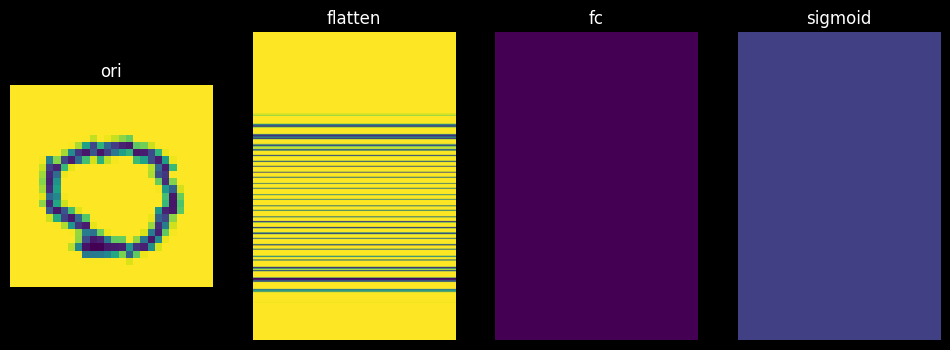

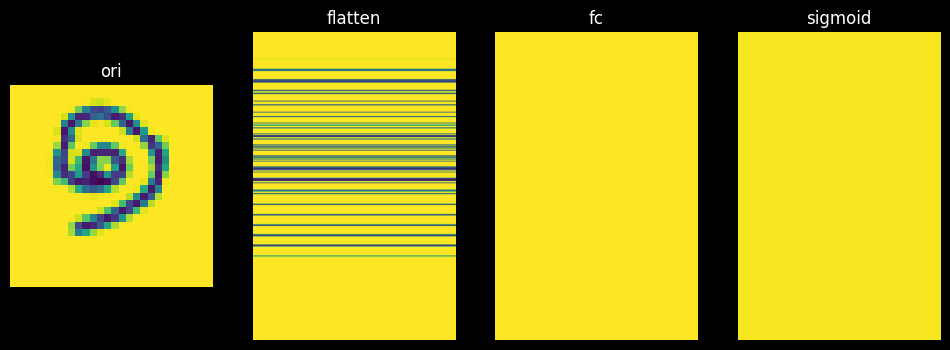

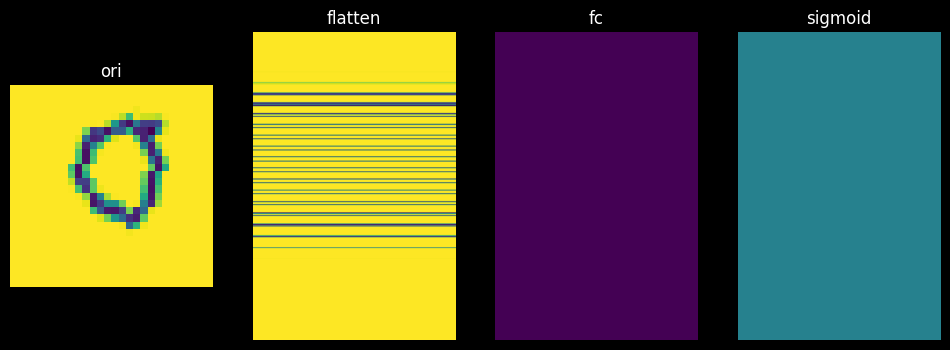

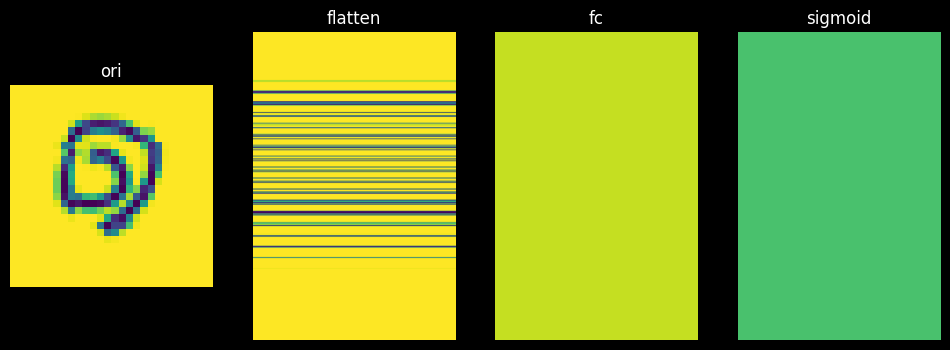

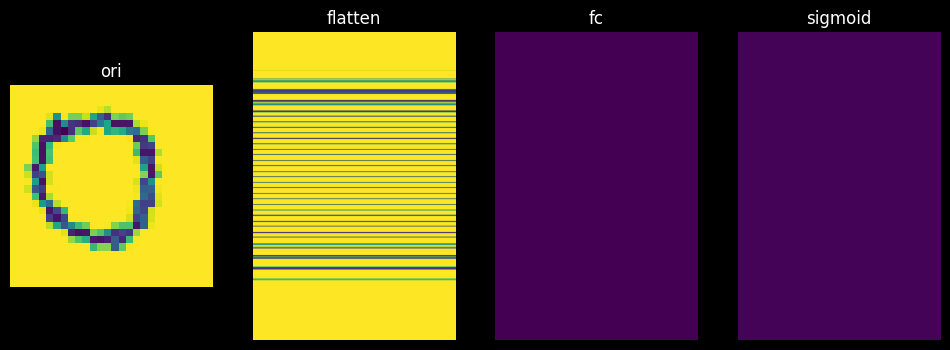

...

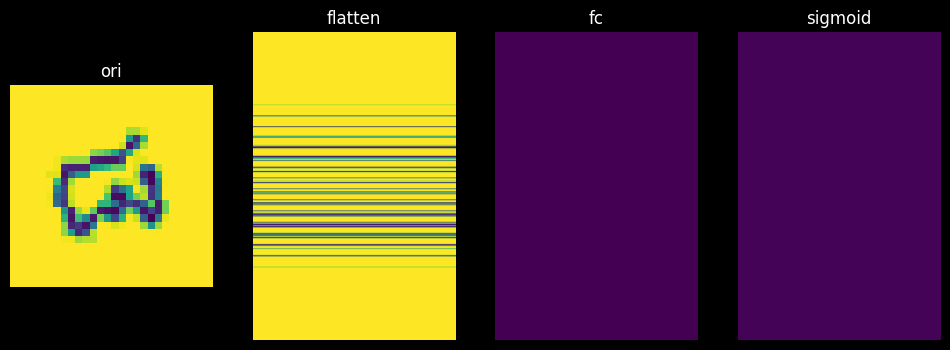

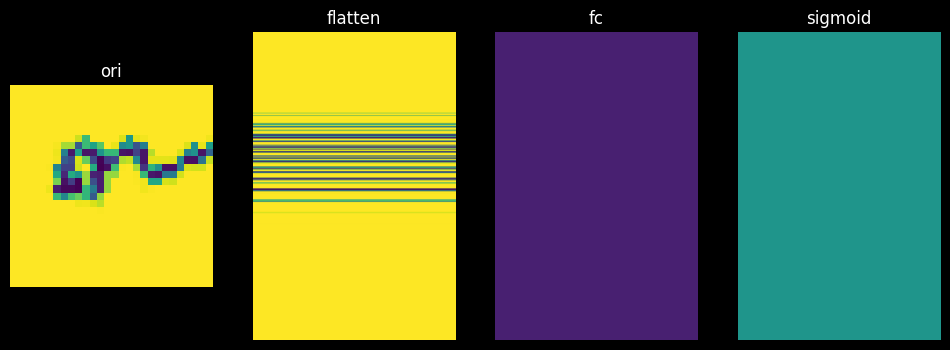

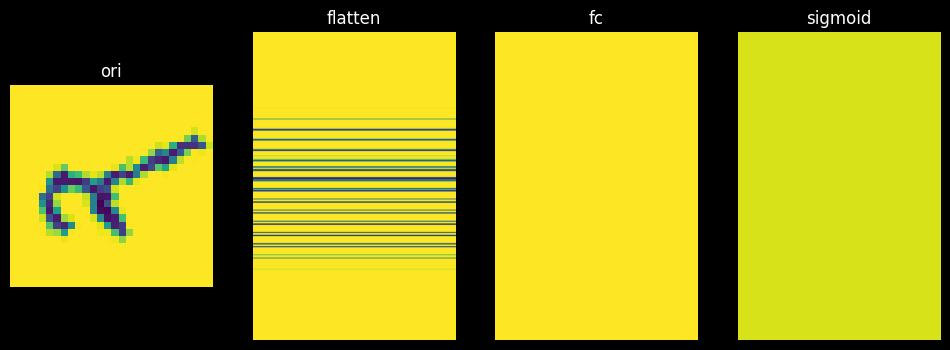

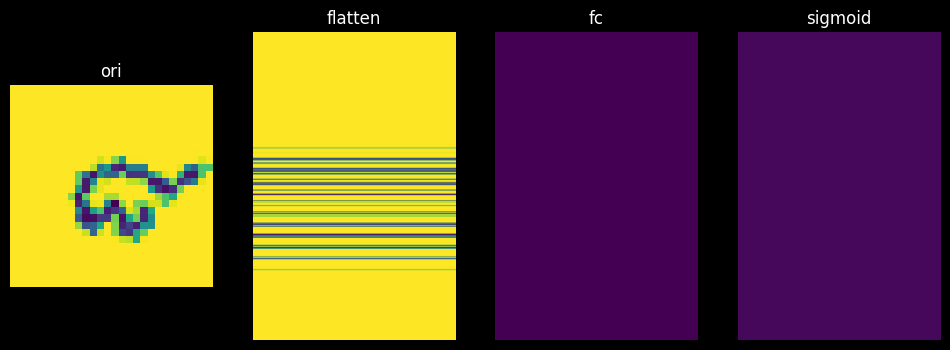

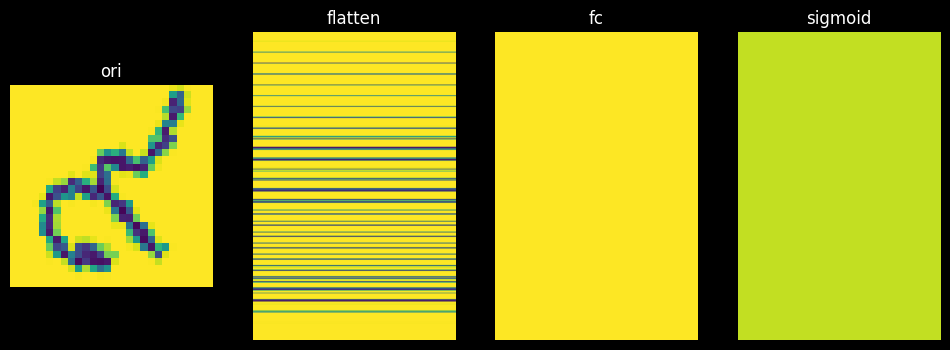

In [12]:
nn_model = NN() 
loss_fn = nn.BCELoss()
optimizer = torch.optim.Adam(nn_model.parameters(), lr=0.01)

for cl in cn_and_loader:
    class_names,train_loader,test_loader  = cl
    writer = SummaryWriter(log_dir=f'runs/{class_names[0]}_{class_names[1]}/NN')

    device = 'cpu'

    nn_history = train(
        class_names,
        nn_model,
        optimizer,
        loss_fn,
        train_loader,
        test_loader,
        epochs=5,
        writer=writer,
        checkpoint_path=f"checkpoints/nn_model/{class_names}.pth",
        device=device,
    )

Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 26.80batch/s, loss=0.593]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.59batch/s, loss=0.581]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 39.29batch/s, loss=0.236]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.09batch/s, loss=0.608]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.83batch/s, loss=0.518]


Epoch 5, Loss: 0.3945, Accuracy: 0.8117, Test Loss: 0.7041, Test Accuracy: 0.6715

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 27.59batch/s, loss=0.265]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.18batch/s, loss=0.103] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 41.04batch/s, loss=0.0906]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.51batch/s, loss=0.0321]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 26.53batch/s, loss=0.0376]


Epoch 5, Loss: 0.1720, Accuracy: 0.9374, Test Loss: 0.1666, Test Accuracy: 0.9412

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.58batch/s, loss=0.111]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.68batch/s, loss=0.555]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.98batch/s, loss=0.433]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 39.21batch/s, loss=0.116] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.42batch/s, loss=0.0594]


Epoch 5, Loss: 0.2879, Accuracy: 0.8725, Test Loss: 0.1885, Test Accuracy: 0.9118

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 25.94batch/s, loss=0.368]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 28.90batch/s, loss=0.382]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.74batch/s, loss=0.252] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 24.35batch/s, loss=0.144]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.22batch/s, loss=0.295]


Epoch 5, Loss: 0.1940, Accuracy: 0.9276, Test Loss: 0.3769, Test Accuracy: 0.8667

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 33.17batch/s, loss=0.00736]
C:\Users\USERIT\AppData\Local\Temp\ipykernel_22132\1396517491.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1, len(features), figsize=(len(features)*3, 4))


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.27batch/s, loss=0.0482] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.31batch/s, loss=0.0645]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.10batch/s, loss=0.131] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.44batch/s, loss=0.301] 


Epoch 5, Loss: 0.0656, Accuracy: 0.9795, Test Loss: 0.1753, Test Accuracy: 0.9185

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 28.56batch/s, loss=0.176]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.94batch/s, loss=1.88] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.78batch/s, loss=0.241]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.02batch/s, loss=0.0637]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 33.86batch/s, loss=0.0298]


Epoch 5, Loss: 0.2418, Accuracy: 0.9129, Test Loss: 0.3280, Test Accuracy: 0.8864

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 39.55batch/s, loss=0.0575]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.89batch/s, loss=0.231]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 31.95batch/s, loss=0.179]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.54batch/s, loss=0.0161]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.88batch/s, loss=0.0732]


Epoch 5, Loss: 0.1167, Accuracy: 0.9569, Test Loss: 0.1183, Test Accuracy: 0.9552

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.90batch/s, loss=0.181]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 31.97batch/s, loss=0.196] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 39.23batch/s, loss=0.255]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 39.34batch/s, loss=0.126]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.06batch/s, loss=0.244]


Epoch 5, Loss: 0.1739, Accuracy: 0.9363, Test Loss: 0.2452, Test Accuracy: 0.9179

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.98batch/s, loss=1.26] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.08batch/s, loss=0.312] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 40.31batch/s, loss=1.28] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.29batch/s, loss=0.188] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.65batch/s, loss=0.263]


Epoch 5, Loss: 0.1524, Accuracy: 0.9490, Test Loss: 0.2125, Test Accuracy: 0.9023

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.28batch/s, loss=0.293]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.33batch/s, loss=0.48] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.07batch/s, loss=0.182]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.90batch/s, loss=0.234]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.54batch/s, loss=0.268]


Epoch 5, Loss: 0.4869, Accuracy: 0.7731, Test Loss: 0.4396, Test Accuracy: 0.7681

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.90batch/s, loss=0.474]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.14batch/s, loss=0.503]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.80batch/s, loss=0.331]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 28.69batch/s, loss=0.395]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.96batch/s, loss=0.331]


Epoch 5, Loss: 0.4476, Accuracy: 0.7778, Test Loss: 0.4623, Test Accuracy: 0.7826

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.09batch/s, loss=0.413]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.14batch/s, loss=0.9]  


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.15batch/s, loss=0.36] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 25.84batch/s, loss=0.795]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.55batch/s, loss=0.515]


Epoch 5, Loss: 0.4132, Accuracy: 0.8263, Test Loss: 0.4175, Test Accuracy: 0.8613

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 28.52batch/s, loss=0.586]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 28.82batch/s, loss=0.296]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.33batch/s, loss=0.198]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 25.96batch/s, loss=0.0801]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.99batch/s, loss=0.14]  


Epoch 5, Loss: 0.2776, Accuracy: 0.8750, Test Loss: 0.2550, Test Accuracy: 0.8905

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 39.03batch/s, loss=0.54] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 40.92batch/s, loss=0.56] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.01batch/s, loss=0.536]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 42.52batch/s, loss=0.944]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 39.43batch/s, loss=0.225]


Epoch 5, Loss: 0.4587, Accuracy: 0.7836, Test Loss: 0.4908, Test Accuracy: 0.7761

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 20.58batch/s, loss=0.639]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.30batch/s, loss=0.544]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.50batch/s, loss=0.227]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.30batch/s, loss=0.269]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 30.35batch/s, loss=0.0294]


Epoch 5, Loss: 0.2168, Accuracy: 0.9244, Test Loss: 0.2099, Test Accuracy: 0.9118

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.26batch/s, loss=0.189]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 25.22batch/s, loss=0.126]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.66batch/s, loss=0.346]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.65batch/s, loss=0.816] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.99batch/s, loss=0.268]


Epoch 5, Loss: 0.2361, Accuracy: 0.9151, Test Loss: 0.2816, Test Accuracy: 0.8897

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.29batch/s, loss=0.295]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.84batch/s, loss=0.216]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.45batch/s, loss=0.182]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 39.67batch/s, loss=0.142]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.72batch/s, loss=0.263]


Epoch 5, Loss: 0.3352, Accuracy: 0.8678, Test Loss: 0.3186, Test Accuracy: 0.8296

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.29batch/s, loss=0.336]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.75batch/s, loss=0.648]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.97batch/s, loss=0.334]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 33.60batch/s, loss=0.155]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 40.29batch/s, loss=0.669]


Epoch 5, Loss: 0.4824, Accuracy: 0.8092, Test Loss: 0.3825, Test Accuracy: 0.7956

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.49batch/s, loss=0.781]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 16.85batch/s, loss=0.54] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.09batch/s, loss=0.4]  


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.17batch/s, loss=0.39] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.76batch/s, loss=0.41] 


Epoch 5, Loss: 0.3393, Accuracy: 0.8785, Test Loss: 0.3248, Test Accuracy: 0.8676

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.79batch/s, loss=0.243]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 40.27batch/s, loss=0.0408]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 39.77batch/s, loss=0.397]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 31.75batch/s, loss=0.0361]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 39.79batch/s, loss=0.0241]


Epoch 5, Loss: 0.1475, Accuracy: 0.9389, Test Loss: 0.2122, Test Accuracy: 0.9191

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 26.31batch/s, loss=0.697]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.25batch/s, loss=0.231]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.50batch/s, loss=0.189]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 42.91batch/s, loss=0.282]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 40.22batch/s, loss=0.34] 


Epoch 5, Loss: 0.3625, Accuracy: 0.8402, Test Loss: 0.3068, Test Accuracy: 0.9098

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.77batch/s, loss=0.244]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.07batch/s, loss=0.239]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.57batch/s, loss=0.051]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 31.25batch/s, loss=0.468] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.51batch/s, loss=0.417]


Epoch 5, Loss: 0.2844, Accuracy: 0.8941, Test Loss: 0.2364, Test Accuracy: 0.9333

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.06batch/s, loss=0.166]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.70batch/s, loss=0.501]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.20batch/s, loss=0.186] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 25.55batch/s, loss=0.281] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 39.75batch/s, loss=0.166] 


Epoch 5, Loss: 0.2088, Accuracy: 0.9219, Test Loss: 0.1645, Test Accuracy: 0.9333

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 30.13batch/s, loss=0.164]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.37batch/s, loss=0.0984]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 39.75batch/s, loss=0.153] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 39.15batch/s, loss=0.389]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.07batch/s, loss=0.0626]


Epoch 5, Loss: 0.2275, Accuracy: 0.9268, Test Loss: 0.1300, Test Accuracy: 0.9403

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.99batch/s, loss=0.46] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 22.18batch/s, loss=0.589]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.45batch/s, loss=0.204]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 25.46batch/s, loss=0.512] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.26batch/s, loss=0.511]


Epoch 5, Loss: 0.2599, Accuracy: 0.9057, Test Loss: 0.3905, Test Accuracy: 0.8309

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.93batch/s, loss=0.37]  


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 25.84batch/s, loss=0.352] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.17batch/s, loss=0.254]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.75batch/s, loss=0.0402]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 37.32batch/s, loss=0.287]


Epoch 5, Loss: 0.1337, Accuracy: 0.9462, Test Loss: 0.2194, Test Accuracy: 0.9185

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.07batch/s, loss=0.925]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 40.32batch/s, loss=0.122]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 40.50batch/s, loss=0.255]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 40.31batch/s, loss=0.5]  


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 39.87batch/s, loss=0.115]


Epoch 5, Loss: 0.2627, Accuracy: 0.9057, Test Loss: 0.3302, Test Accuracy: 0.8346

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 41.44batch/s, loss=0.213]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.94batch/s, loss=0.502]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 31.97batch/s, loss=0.426]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 36.63batch/s, loss=0.497]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.78batch/s, loss=0.931]


Epoch 5, Loss: 0.4326, Accuracy: 0.8284, Test Loss: 0.4269, Test Accuracy: 0.8593

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 38.04batch/s, loss=0.259]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.82batch/s, loss=0.129]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.30batch/s, loss=0.337]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.64batch/s, loss=0.596]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 28.44batch/s, loss=0.104]


Epoch 5, Loss: 0.3064, Accuracy: 0.9011, Test Loss: 0.3565, Test Accuracy: 0.8741

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 30.18batch/s, loss=0.447]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 33.99batch/s, loss=0.356]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 17.44batch/s, loss=0.546]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 26.00batch/s, loss=0.305]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 17.53batch/s, loss=0.761]


Epoch 5, Loss: 0.4348, Accuracy: 0.7838, Test Loss: 0.5278, Test Accuracy: 0.7143

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 30.16batch/s, loss=0.696]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 31.05batch/s, loss=0.0759]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 27.84batch/s, loss=0.575]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 26.77batch/s, loss=1.14] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.12batch/s, loss=0.466]


Epoch 5, Loss: 0.4704, Accuracy: 0.7985, Test Loss: 0.4134, Test Accuracy: 0.8370

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.01batch/s, loss=0.693]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 21.92batch/s, loss=0.812]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 33.08batch/s, loss=0.698]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.16batch/s, loss=0.742]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 33.58batch/s, loss=0.875]


Epoch 5, Loss: 0.7433, Accuracy: 0.5265, Test Loss: 0.7444, Test Accuracy: 0.5076

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.25batch/s, loss=0.717]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.72batch/s, loss=1.07] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 26.47batch/s, loss=0.766]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 33.03batch/s, loss=0.554]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.18batch/s, loss=0.25] 


Epoch 5, Loss: 0.4698, Accuracy: 0.8277, Test Loss: 0.3814, Test Accuracy: 0.8433

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 26.19batch/s, loss=0.7]  


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 28.33batch/s, loss=0.791]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 31.70batch/s, loss=0.994]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.01batch/s, loss=0.599]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 31.60batch/s, loss=0.407]


Epoch 5, Loss: 0.5506, Accuracy: 0.7584, Test Loss: 0.4753, Test Accuracy: 0.8060

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 33.76batch/s, loss=0.93] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.80batch/s, loss=0.346]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.59batch/s, loss=0.623]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 33.11batch/s, loss=0.455]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 28.62batch/s, loss=0.527]


Epoch 5, Loss: 0.4599, Accuracy: 0.8204, Test Loss: 0.5263, Test Accuracy: 0.7519

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 28.25batch/s, loss=0.701]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.00batch/s, loss=0.441]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.37batch/s, loss=0.546]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.33batch/s, loss=0.271]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 31.92batch/s, loss=0.41] 


Epoch 5, Loss: 0.3868, Accuracy: 0.8629, Test Loss: 0.2988, Test Accuracy: 0.9167

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 26.58batch/s, loss=0.127]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 30.84batch/s, loss=0.423]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 31.17batch/s, loss=0.527]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 14.03batch/s, loss=0.621] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 25.79batch/s, loss=0.129]


Epoch 5, Loss: 0.3365, Accuracy: 0.8327, Test Loss: 0.3675, Test Accuracy: 0.8722

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 24.30batch/s, loss=1.12] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.68batch/s, loss=0.0915]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 21.81batch/s, loss=0.386]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 31.99batch/s, loss=0.326]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 24.35batch/s, loss=0.0759]


Epoch 5, Loss: 0.3874, Accuracy: 0.8741, Test Loss: 0.3599, Test Accuracy: 0.8647

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 22.13batch/s, loss=0.355]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 33.20batch/s, loss=0.262]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 27.81batch/s, loss=0.46] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 30.32batch/s, loss=0.553]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 20.53batch/s, loss=0.553]


Epoch 5, Loss: 0.4482, Accuracy: 0.7951, Test Loss: 0.4223, Test Accuracy: 0.8636

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.85batch/s, loss=0.549]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 30.05batch/s, loss=0.203]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 32.08batch/s, loss=0.567]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 21.42batch/s, loss=0.0624]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 28.64batch/s, loss=0.202]


Epoch 5, Loss: 0.3532, Accuracy: 0.8757, Test Loss: 0.2969, Test Accuracy: 0.8397

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.77batch/s, loss=0.318]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 26.38batch/s, loss=0.209]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.55batch/s, loss=0.0736]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.22batch/s, loss=1.11] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 35.85batch/s, loss=0.218] 


Epoch 5, Loss: 0.2780, Accuracy: 0.8987, Test Loss: 0.2632, Test Accuracy: 0.9084

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.00batch/s, loss=0.113]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 18.28batch/s, loss=0.134]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 25.63batch/s, loss=0.051]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 34.76batch/s, loss=1.21] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 30.22batch/s, loss=0.0597]


Epoch 5, Loss: 0.1893, Accuracy: 0.9440, Test Loss: 0.1961, Test Accuracy: 0.9538

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 23.25batch/s, loss=0.563]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 33.06batch/s, loss=0.777]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 17.05batch/s, loss=0.677]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 22.10batch/s, loss=0.683]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 27.84batch/s, loss=1.26] 


Epoch 5, Loss: 0.7324, Accuracy: 0.5161, Test Loss: 0.9167, Test Accuracy: 0.4962

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 21.51batch/s, loss=0.605]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.51batch/s, loss=0.735]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 26.13batch/s, loss=0.135]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 24.99batch/s, loss=0.713]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 22.30batch/s, loss=0.726]


Epoch 5, Loss: 0.7259, Accuracy: 0.5000, Test Loss: 0.7299, Test Accuracy: 0.4924

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 26.95batch/s, loss=0.579]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 25.49batch/s, loss=0.722]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 23.65batch/s, loss=1.04] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 29.01batch/s, loss=0.612]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 9/9 [00:00<00:00, 26.96batch/s, loss=0.735]


Epoch 5, Loss: 0.7470, Accuracy: 0.4828, Test Loss: 0.7005, Test Accuracy: 0.5076

3 1
1 784
1 48
1 48
1 1
1 1


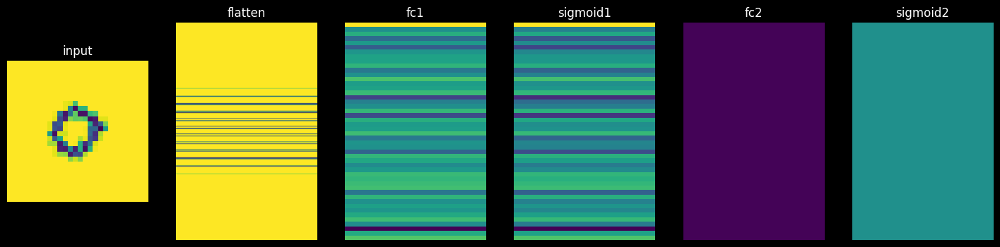

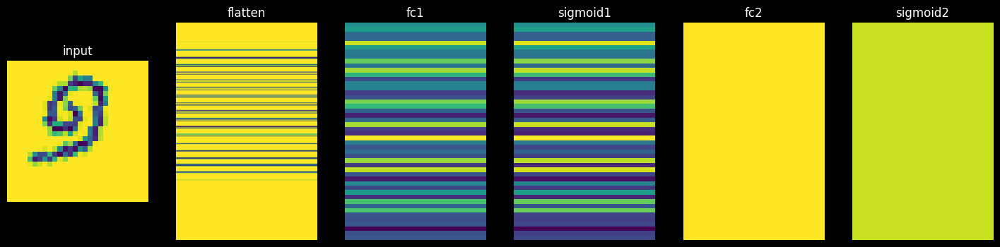

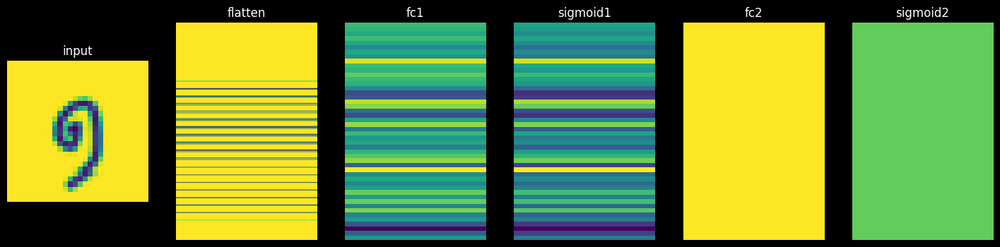

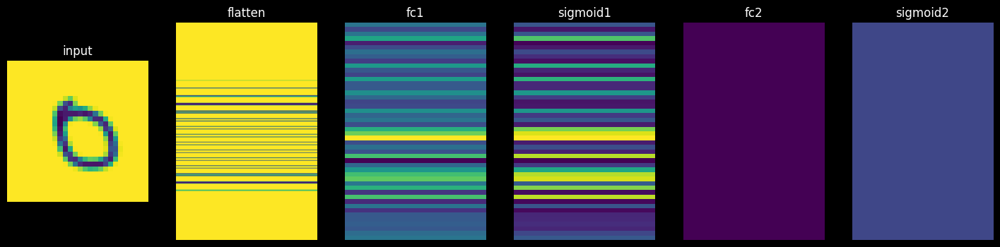

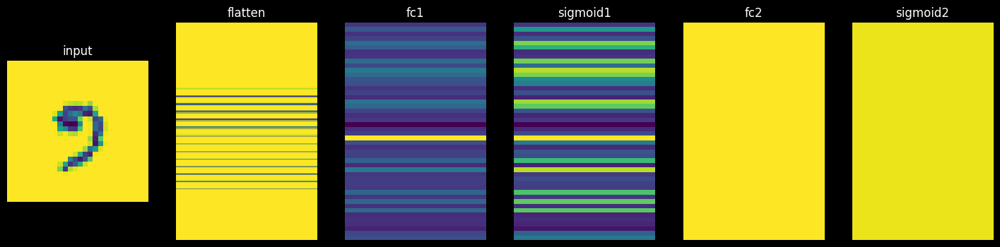

...

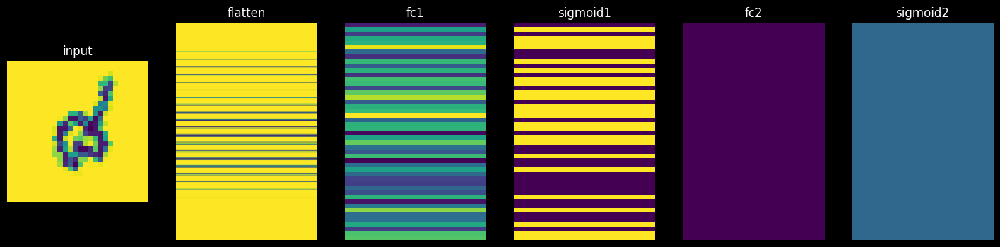

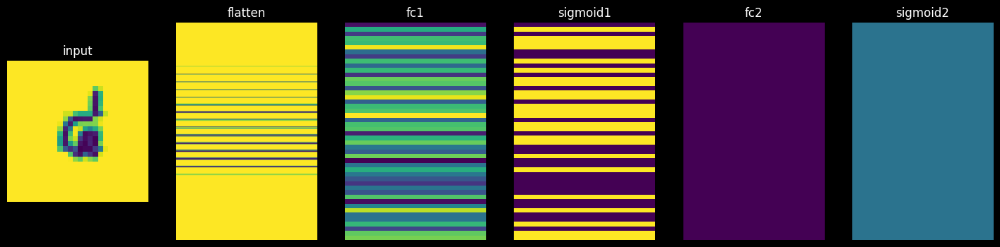

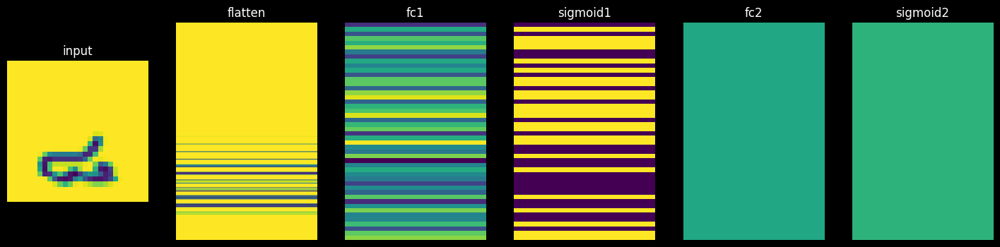

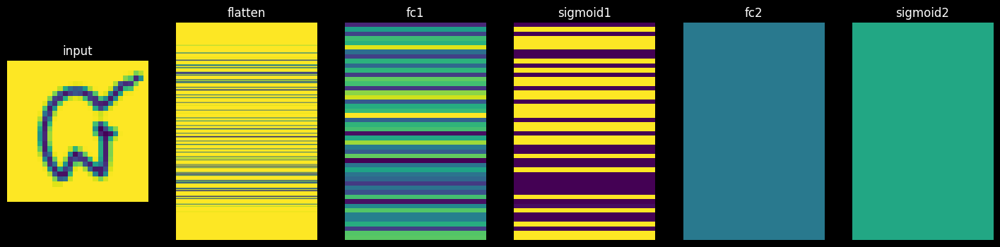

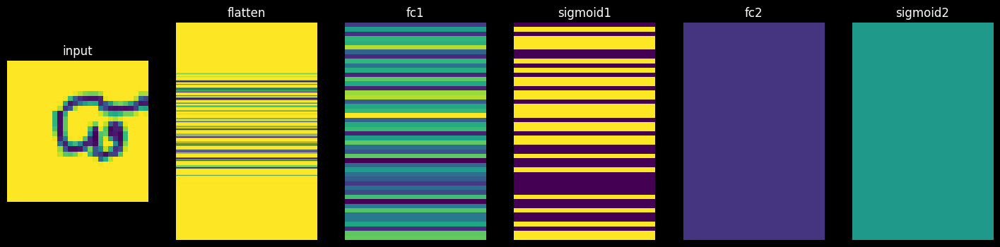

In [13]:

mlp_model = MLP() 
loss_fn = nn.BCELoss()
optimizer = torch.optim.SGD(mlp_model.parameters(), lr=0.03, momentum=0.9)

for cl in cn_and_loader:
    class_names,train_loader,test_loader  = cl
    writer = SummaryWriter(log_dir=f'runs/{class_names[0]}_{class_names[1]}/MLP')
    device = 'cpu'

    mlp_history = train(
        class_names,
        mlp_model,
        optimizer,
        loss_fn,
        train_loader,
        test_loader,
        epochs=5,
        writer=writer,
        checkpoint_path=f"checkpoints/mlp_model/{class_names}.pth",
        device=device,
    )

Try to load the weights into the model and the confusion matrix for each model with every combination of numbers that you've obtained, as shown in the expected output.


<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical
This is just an example of NN. You should have three models: NN, MLP, and CNN, with one model per plot.

![image.png](https://github.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/blob/main/Lab4_NN-and-CNN/assets/09.png?raw=true)

</details>

📥 Loading model from: checkpoints/cnn_model\['0', '1'].pth
📥 Loading model from: checkpoints/cnn_model\['0', '2'].pth
📥 Loading model from: checkpoints/cnn_model\['0', '3'].pth
📥 Loading model from: checkpoints/cnn_model\['0', '4'].pth
📥 Loading model from: checkpoints/cnn_model\['0', '5'].pth
📥 Loading model from: checkpoints/cnn_model\['0', '6'].pth
📥 Loading model from: checkpoints/cnn_model\['0', '7'].pth
📥 Loading model from: checkpoints/cnn_model\['0', '8'].pth
📥 Loading model from: checkpoints/cnn_model\['0', '9'].pth
📥 Loading model from: checkpoints/cnn_model\['1', '2'].pth
📥 Loading model from: checkpoints/cnn_model\['1', '3'].pth
📥 Loading model from: checkpoints/cnn_model\['1', '4'].pth
📥 Loading model from: checkpoints/cnn_model\['1', '5'].pth
📥 Loading model from: checkpoints/cnn_model\['1', '6'].pth
📥 Loading model from: checkpoints/cnn_model\['1', '7'].pth
📥 Loading model from: checkpoints/cnn_model\['1', '8'].pth
📥 Loading model from: checkpoints/cnn_model\['1', '9'].p

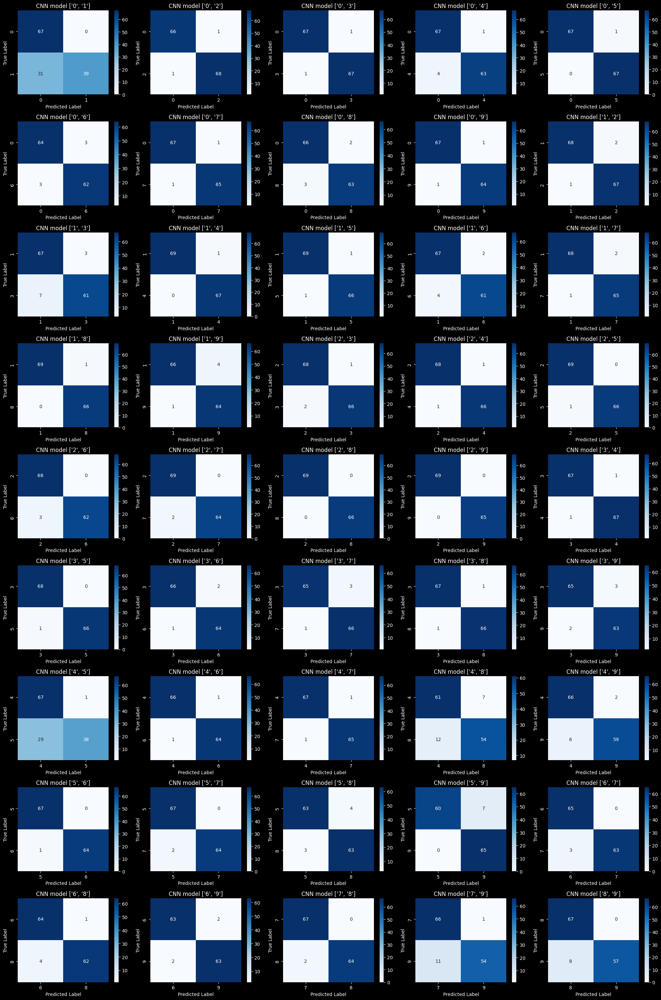

In [14]:
### START CODE HERE ###
from sklearn.metrics import confusion_matrix
import seaborn as sn

def plot_confusion_matrix(loaded_models, model_name, cn_and_loader, device):
    
    fig, axs = plt.subplots(9, 5, figsize=(20, 30))
    axs = axs.flatten()

    for i, (model, (class_names, _,test_loader)) in enumerate(zip(loaded_models, cn_and_loader)):
        all_preds = []
        all_labels = []

        with torch.no_grad():
            for images, labels in test_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                preds = (outputs > 0.6).int().squeeze()

                class_ints = list(map(int, class_names))  
                pred_classes = [class_ints[i] for i in preds.cpu().numpy()]  
                all_preds.extend(pred_classes)
                all_labels.extend(labels.cpu().numpy())
   
        cm = confusion_matrix(all_labels, all_preds)

        sn.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                    xticklabels=class_names, yticklabels=class_names,
                    ax=axs[i])
        axs[i].set_xlabel('Predicted Label')
        axs[i].set_ylabel('True Label')
        axs[i].set_title(f'{model_name} {class_names}')

    plt.tight_layout()
    plt.show()

model_folder = 'checkpoints/cnn_model'  # หรือ 'checkpoints\\cnn_model' สำหรับ Windows
model_paths = [os.path.join(model_folder, f) 
               for f in os.listdir(model_folder) 
               if f.endswith('.pth')]

loaded_models = []

for path in model_paths:
    print(f"📥 Loading model from: {path}")
    model_instance = CNN()  
    model_instance.load_state_dict(torch.load(path, weights_only=True))
    model_instance.eval()
    loaded_models.append(model_instance)

plot_confusion_matrix(loaded_models,'CNN model',cn_and_loader, 'cpu')
### END CODE HERE ###

Questions
1. How does the performance of different models vary across different pairs of numbers in our dataset?
2. Can you identify the number pairs where the Neural Network model performs best and worst? Explain why the NN model is able/unable to classify these specific pairs based on the visualization of feature maps of each node in each layer.
3. Analyze and compare how MLP and CNN models perform on the dataset compared to the Neural Network model.  Identify scenarios where MLP and CNN outperform or underperform the NN. Explain the reasons behind these performance differences. Consider factors like the underlying structure of the data and the specific strengths of each model architecture.
4. According to your observations from questions 1-3, propose specific strategies to improve the performance of each model (NN, MLP, CNN) on this dataset. Consider factors such as data preprocessing, data augmentation, or potential changes to the model architecture itself. Justify your suggestions based on the strengths and limitations identified in the previous questions.

## Answer ##
1.  CNN เป็นโมเดลที่สามารถแยกคู่ตัวเลขได้ดีที่สุด
    MLP สามารถแยกคู่ตัวเลยได้รองลงมาจาก CNN แต่มีกรณีที่โมลเดล predict ได้ผลลัพธ์เป็นคลาสเดียวกันทั้งหมด (๓ ๖, ๗ ๘)
    NN สามารถแยกคู่ตัวเลยได้รองลงมาจาก MLP ถึงแม้จะไม่มีสถานการณ์ที่โมเดล predict ได้ผลลัพธ์เดียวกันทั้งหมด แต่โมลเดลก็มีความแม่นยำน้อบกว่า MLP อย่างเห็นได้ชัด ส่วนใหญ่ผลลัพธ์ที่ได้จากกการ predict จะเป็น true และ false ปนกัน เกือบครึ่งต่อครึ่ง และมี True Positive และ True Negative น้อยกว่า MLP
    สาเหตุที่ CNN แยกคู่ตัวเลขได้ดีที่สุด เพราะ CNN เป็นโมเดลที่สามารถเข้าใจความสัมพันธ์ 2 มิติได้ (ซ้ายขวา บนล่าง) แต่โมเดลอื่นทำไม่ได้ ทำให้ CNN สามารถทำความเข้าใจลักษณะภาพได้ดีกว่าโมเดลอื่นๆ
2.  คู่เลขที่ง่าย คือ ๐ กับ ๕ เพราะลักษณะของตัวเลขทั้งสองมีความต่างกันอย่างชัดเจน
    คู่เลขที่ยาก คือ ๒ กับ ๓ เพราะมีลักษณะที่คล้ายกัน
3.  • MLP และ CNN มี layer ของการทำงานมากกว่า NN โดยที่
        - CNN มี convolutional layers with ReLU activations  2 ชั้น จากนั้น flatten ตามด้วย fully connected layers with ReLU activations อีก 2 ชั้น จากนั้นจึงใช้ sigmoid activation รวมเป็น 6 ชั้น
        - MLP มี flatten ตามด้วย fully connected layer with sigmoid activation 2 ชั้น รวมเป็น 3 ชั้น
        - NN มีแค่ flattens และ fully connected layer with sigmoid activation รวมเป็น 2 ชั้น
    • สถานการณ์ที่ MLP และ CNN ทำงานได้ดีกว่า NN: กรณีตัวเลขมีลักษณะคล้ายกันในบางจุด แต่ต่างกันใน pattern รวม เช่น ๔ ๙
    • ความแตกต่างของประสิทธิภาพ เกิดจาก ความซับซ้อนของ layer ใน model 
        - CNN ใช้ทั้ง convolutional layers และ ด้วย fully connected layers ทำให้สามารถเข้าใจโครงสร้างของภาพได้ดี รู้ความสำคัญของตำแหน่ง ซ้ายขวา บนล่าง โมเดลเหมาะกับข้อมูลที่เป็น 2 มิติ
        - MLP มี fully connected layer 2 ชั้น ทำให้ model พอจะรู้ pattern ของตัวเลขได้มาก แต่ไม่เท่า CNN เพราะโมเดลเหมาะกับข้อมูลที่เป็น 1 มิติมากกว่า
        - NN มี fully connected layer 1 ชั้น ทำให้ไม่สามารถแยกแยะตัวเลขที่มีรูปคล้ายกันได้
4.  NN : เหมาะกับข้อมูลเรียบง่าย แต่ไม่เหมาะกับภาพ 2D ซับซ้อน
    - เพิ่ม hidden layer และ Augment data เพื่อให้โมเดลสามารถแยกคู่เลขที่ยากได้ดียิ่งขึ้น
    - ใช้ activation functions ที่มีพลังแยกแยะมากขึ้น เช่น ReLU แทน Sigmoid
    MLP : เข้าใจ pattern ได้ดีขึ้นกว่า NN แต่ยังคง flatten ข้อมูล ทำให้เสีย spatial structure
    - เพิ่ม hidden layer และ ใช้ Flatten + Dropout ป้องกัน overfitting
    CNN : เข้าใจ spatial structure ได้ดี จึงเหมาะกับภาพตัวเลขไทยที่มีโครงสร้างเฉพาะ
    - ใช้ data augmentation เช่น random crop, rotation และปรับ kernel size หรือ depth ของ convolutional layer ตามความซับซ้อนของลายมือ
    - ปรับ kernel size หรือเพิ่ม depth ของ convolutional layers หากตัวเลขมีความซับซ้อน (เช่น มีหลายเส้นโค้ง)